# S3: QQ Plots

In [9]:
import sys

sys.path.append('../../')
from global_variables import SUBDIR, RUN, WORKSPACE

In [10]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import math

In [11]:
def get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=False):

    lst_df = []
    n_dict = {}
    for cohort in cohort_df["COHORT"].values:
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        path_csv = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv"
        path_input_mut = f"{maf_input_dir}/{cohort}.in.maf"
        if os.path.exists(path_csv):
            df_o3d = pd.read_csv(path_csv, low_memory=False)
            df_o3d = df_o3d[["Gene", "Uniprot_ID", "Cohort", "pval", "qval", "Score_obs_sim_top_vol", "Mut_in_top_vol", "Mut_in_gene"]].dropna(subset=["pval"]).reset_index(drop=True)
            
            df_o3d.pval = df_o3d.pval.replace(0, 0.00001)
            df_mut = pd.read_table(path_input_mut, low_memory=False)
            df_mut = df_mut[df_mut["Variant_Classification"] == "Missense_Mutation"].reset_index(drop=True)
            df_mut = df_mut[df_mut.Hugo_Symbol.isin(df_o3d.Gene.unique())]
            
            if min_n != False:
                if len(df_o3d) > min_n:
                    lst_df.append(df_o3d)
            else:
                lst_df.append(df_o3d)
                
            n_dict[cohort] = {}
            n_dict[cohort]["genes"] = len(df_o3d)
            n_dict[cohort]["mut"] = len(df_mut)
        else:
            print(f"Path doesn't exist: {path_csv}")
            
    df = pd.concat(lst_df)
    df["n_genes"] = df.Cohort.map(lambda x: n_dict[x]["genes"])
    df["n_mut"] = df.Cohort.map(lambda x: n_dict[x]["mut"])
    df = df.sort_values(["n_genes", "pval"], ascending=[False, True])

    return df.reset_index(drop=True)


def qq_plot(df_results, filename, figsize=(10, 16), tcga=True, title_fontsize=12):
    
    cols = 4
    rows = math.ceil(len(df_results.Cohort.unique()) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=figsize, constrained_layout=True)
    axes = axes.flatten()
    
    for i, (cohort, df) in enumerate(df_results.groupby("Cohort", sort=False)):

        # Compute observed p-values and theoretical quantiles
        pvals = -np.log10(df.pval.values)
        n = len(pvals)
        expected = -np.log10(np.linspace(1/n, 1, n))
        ax = axes[i]
        
        # Plot observed vs. theoretical p-values
        ax.scatter(expected, pvals, alpha=0.6)
        x = np.linspace(*ax.get_xlim())
        ax.plot(x, x, color='black', linestyle='--', label='Expected Line (y=x)')

        # Add labels and title for each subplot
        cohort = cohort.replace("TCGA_WXS_SOFT_TISSUE", "TCGA_WXS_SARC")
        cohort_name = cohort.split("_")[len(cohort.split("_"))-1] if tcga else cohort
        ax.set_title(f'{cohort_name}\nN genes = {df["n_genes"].unique()[0]}\nN mut = {df["n_mut"].unique()[0]}', fontsize=title_fontsize)
        ax.set_xlabel(None)
        ax.set_ylabel(None)
    
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.supxlabel(f"Theoretical quantiles\n-log10(p-values)")
    fig.supylabel(f"Observed quantiles\n  -log10(p-values)")
    
    if filename:
        plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()

In [12]:
datasets = f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/"
input_path = f"{datasets}/input/cancer_202404"
maf_input_dir = f"{input_path}/maf"
o3d_output_dir = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}"

cohort_df = pd.read_csv(f"{input_path}/cohorts.tsv", sep="\t")
cohort_df = cohort_df[~cohort_df.COHORT.str.startswith("ICGC")].reset_index(drop=True)

df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir)
df_results = df_results[df_results.Cohort.str.startswith("TCGA")].reset_index(drop=True)
df_results

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


,Gene,Uniprot_ID,Cohort,pval,qval,Score_obs_sim_top_vol,Mut_in_top_vol,Mut_in_gene,n_genes,n_mut
0,BRAF,P15056,TCGA_WXS_MEL,0.00001,0.0,154.374330,245.0,269,10058,165420
1,NRAS,P01111,TCGA_WXS_MEL,0.00001,0.0,57.088760,126.0,127,10058,165420
2,MAP2K1,A4QPA9,TCGA_WXS_MEL,0.00001,0.0,8.864405,20.0,27,10058,165420
3,CNOT9,D5MQE1,TCGA_WXS_MEL,0.00001,0.0,7.687517,14.0,15,10058,165420
4,RAC1,A4D2P1,TCGA_WXS_MEL,0.00001,0.0,7.117122,18.0,22,10058,165420
...,...,...,...,...,...,...,...,...,...,...
36091,UBE3C,Q15386,TCGA_WXS_CHRCC,0.04960,1.0,1.719813,2.0,2,7,28
36092,ATP6V0A4,A0A024R791,TCGA_WXS_CHRCC,0.05770,1.0,1.685607,2.0,2,7,28
36093,CREG2,Q8IUH2,TCGA_WXS_CHRCC,0.08770,1.0,1.592002,2.0,2,7,28
36094,GAL3ST3,Q96A11,TCGA_WXS_CHRCC,0.11200,1.0,1.508403,2.0,2,7,28


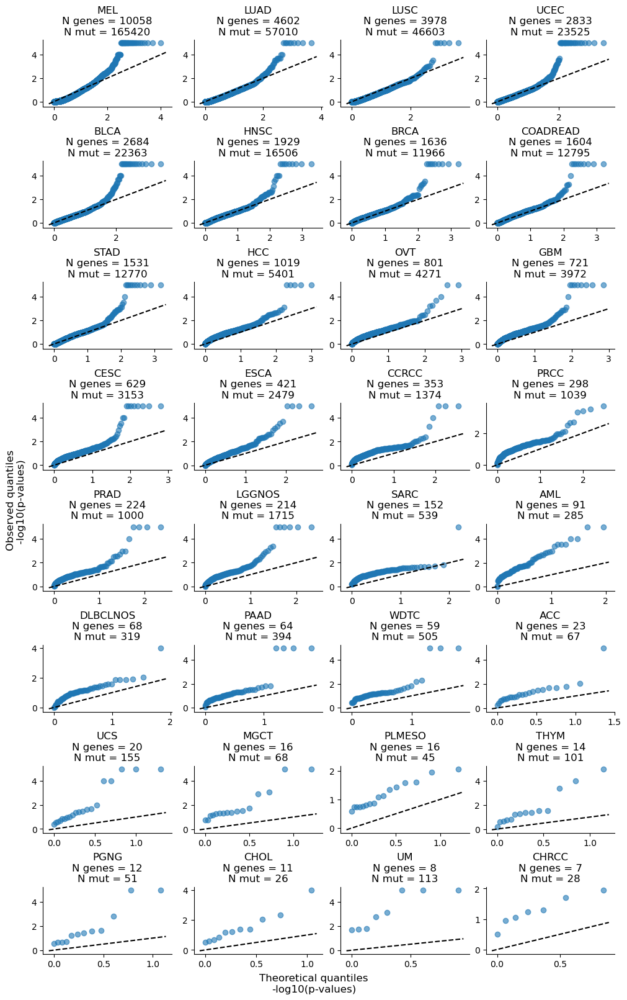

In [13]:
qq_plot(df_results, filename=False)

## Filter by sample size (processed genes)

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


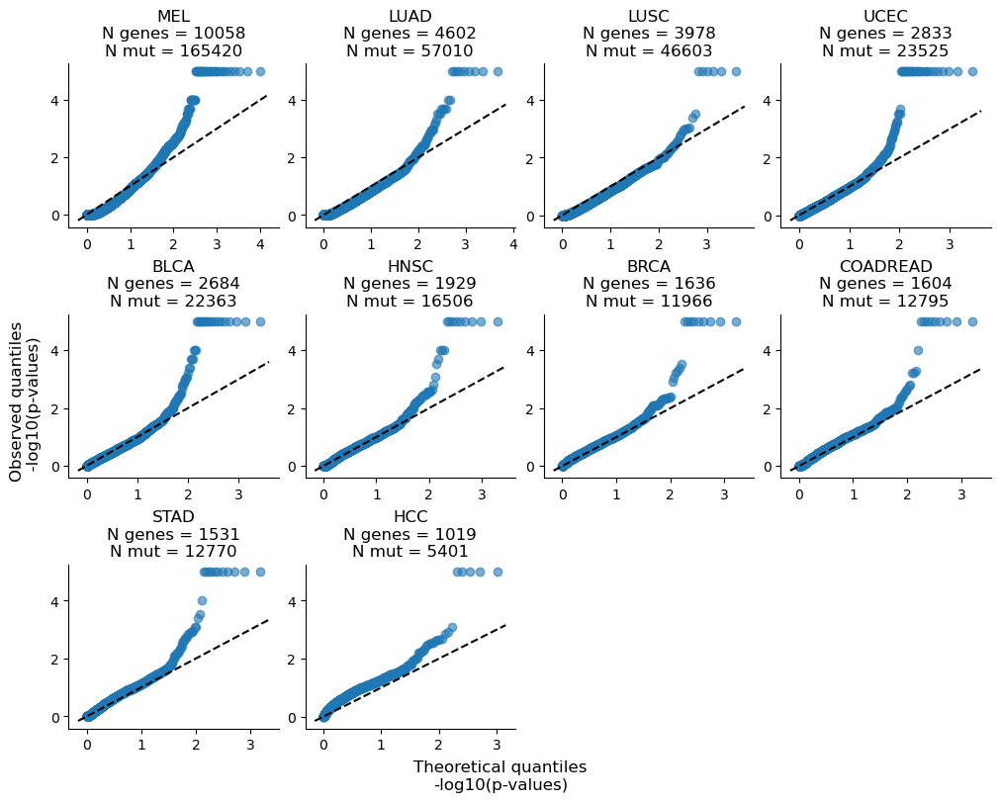

In [14]:
df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=1000)
df_results = df_results[df_results.Cohort.str.startswith("TCGA")].reset_index(drop=True)
qq_plot(df_results, filename=False, figsize=(10, 8))

In [15]:
df_results.reset_index()[["index", "pval", "Mut_in_gene", "Mut_in_top_vol"]].corr()

,index,pval,Mut_in_gene,Mut_in_top_vol
index,1.000000,-0.107111,-0.223352,-0.078333
pval,-0.107111,1.000000,0.204944,-0.122765
Mut_in_gene,-0.223352,0.204944,1.000000,0.411816
Mut_in_top_vol,-0.078333,-0.122765,0.411816,1.000000


Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


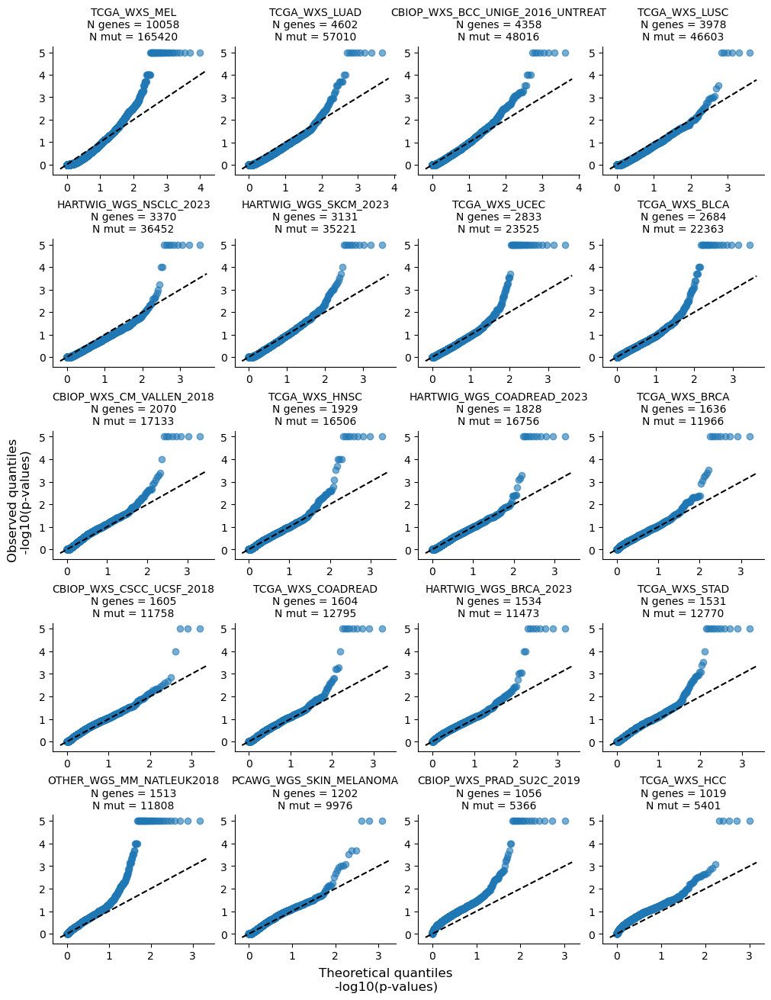

In [16]:
df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=1000)
qq_plot(df_results, filename=False, figsize=(10, 13), tcga=False, title_fontsize=10)

## We compute the score at the level of gene-cohort: so a sample size that might affect the score is the number of number of mutations in the gene


Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


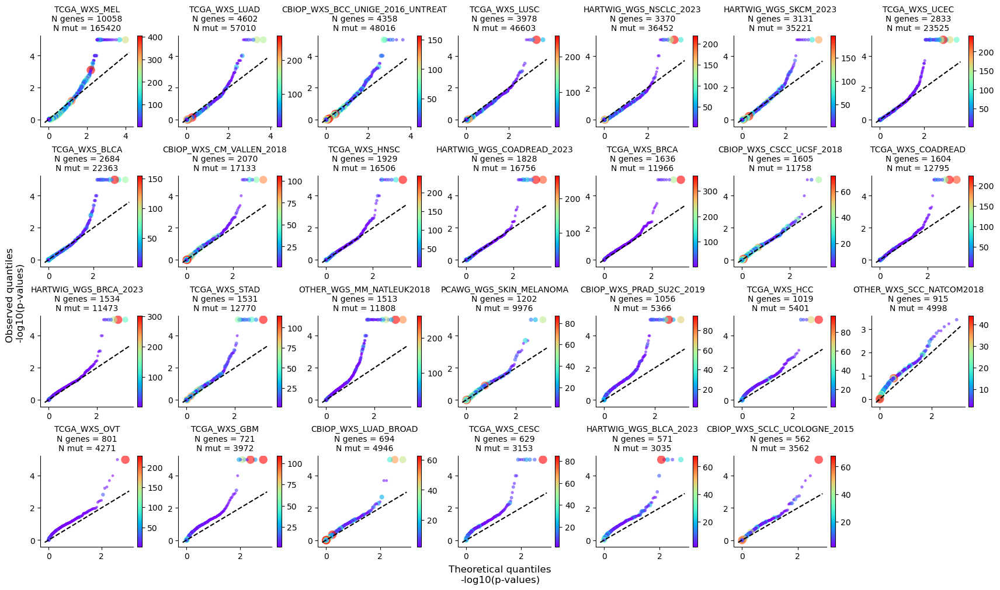

In [17]:
def qq_plot(df_results, filename=None, figsize=(10, 16), tcga=True, title_fontsize=12, cols=4):
    
    rows = math.ceil(len(df_results.Cohort.unique()) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=figsize, constrained_layout=True)
    axes = axes.flatten()

    cmap = plt.cm.rainbow  # Using the rainbow colormap

    for i, (cohort, df) in enumerate(df_results.groupby("Cohort", sort=False)):

        # Compute observed p-values and theoretical quantiles
        pvals = -np.log10(df.pval.values)
        n = len(pvals)
        expected = -np.log10(np.linspace(1/n, 1, n))
        ax = axes[i]
        
        # Normalize colors and sizes based on Mut_in_gene
        norm = plt.Normalize(df["Mut_in_gene"].min(), df["Mut_in_gene"].max())
        size_scale = (df["Mut_in_gene"] - df["Mut_in_gene"].min()) / (df["Mut_in_gene"].max() - df["Mut_in_gene"].min())
        marker_sizes = 10 + (size_scale * 100)  # Scale marker sizes between 10 and 100

        # Scatter plot with size and color based on "Mut_in_gene"
        scatter = ax.scatter(expected, pvals, c=df["Mut_in_gene"], cmap=cmap, norm=norm, s=marker_sizes, alpha=0.6, lw=0)
        
        # Expected line (y=x)
        x = np.linspace(*ax.get_xlim())
        ax.plot(x, x, color='black', linestyle='--', label='Expected Line (y=x)')

        # Add labels and title for each subplot
        cohort = cohort.replace("TCGA_WXS_SOFT_TISSUE", "TCGA_WXS_SARC")
        cohort_name = cohort.split("_")[-1] if tcga else cohort
        ax.set_title(f'{cohort_name}\nN genes = {df["n_genes"].unique()[0]}\nN mut = {df["n_mut"].unique()[0]}', fontsize=title_fontsize)
        ax.set_xlabel(None)
        ax.set_ylabel(None)
    
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        # Add color bar next to each subplot
        cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical', 
                            fraction=1, pad=0.04)
        # cbar.set_label("Mutations in Gene")

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Common x and y labels
    fig.supxlabel(f"Theoretical quantiles\n-log10(p-values)")
    fig.supylabel(f"Observed quantiles\n-log10(p-values)")

    # Save the figure if filename is provided
    if filename:
        plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()

df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=500)
qq_plot(df_results, filename=False, figsize=(17, 10), tcga=False, title_fontsize=10, cols=7)

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


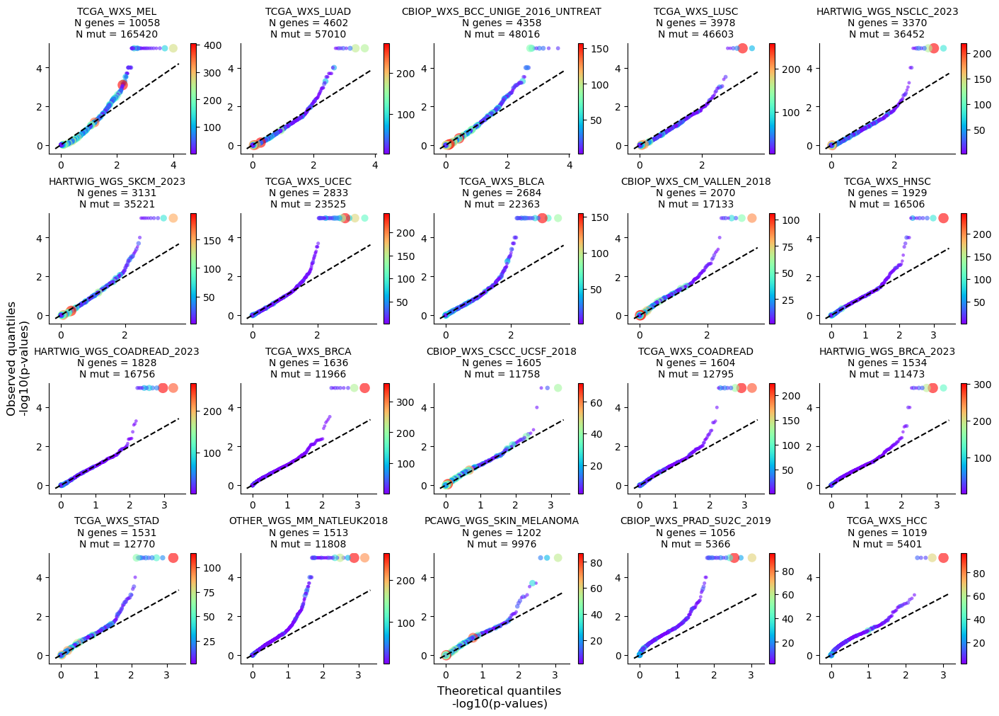

In [18]:
df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=1000)  
qq_plot(df_results, filename=False, figsize=(14, 10), tcga=False, title_fontsize=10, cols=5)

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


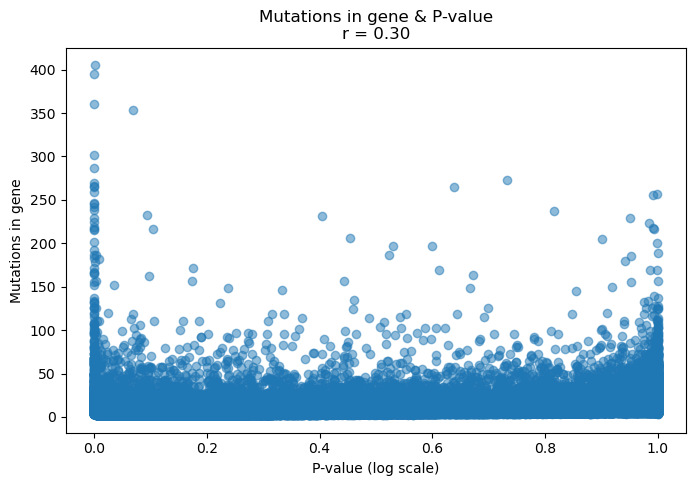

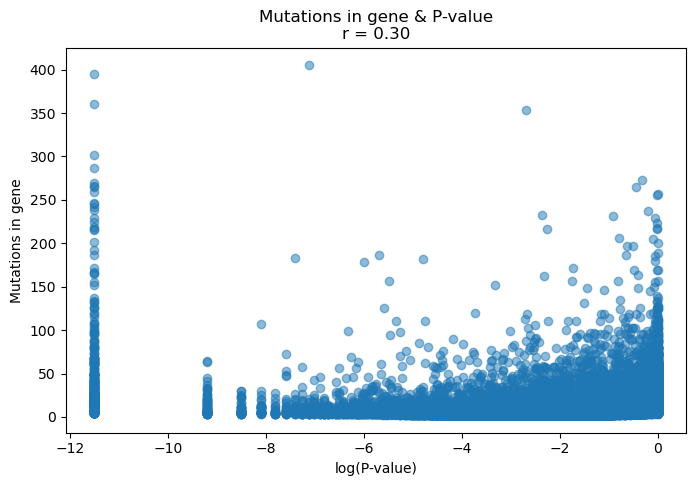

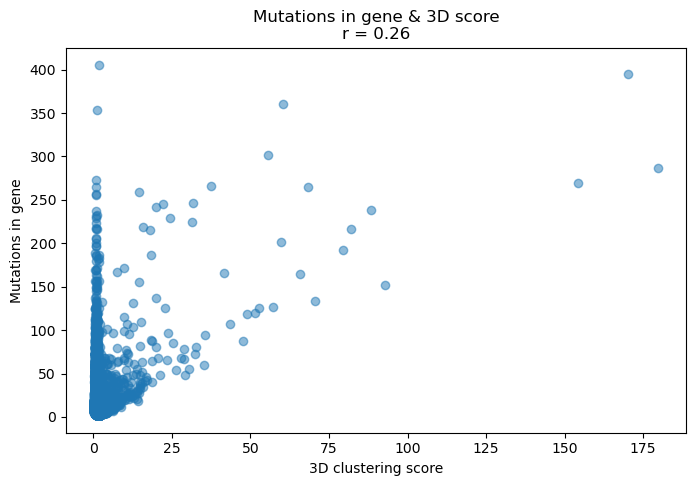

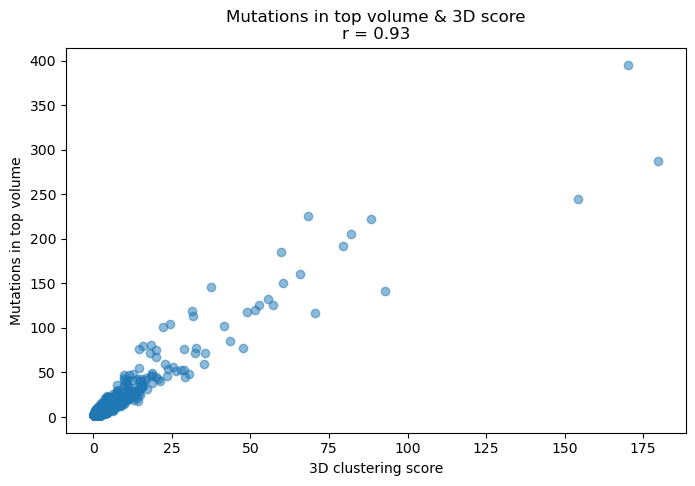

In [19]:
# Associations between N (number of mutations in the gene) and p-value or 3D score

df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir)

# Create DataFrame
df = df_results

plt.figure(figsize=(8, 5))
plt.scatter(df["pval"], df["Mut_in_gene"], alpha=0.5)
plt.xlabel("P-value (log scale)")
plt.ylabel("Mutations in gene")
plt.title(f'Mutations in gene & P-value\nr = {df["pval"].corr(df["Mut_in_gene"]):.2f}')
plt.show()


# Create DataFrame
df = df_results

plt.figure(figsize=(8, 5))
plt.scatter(np.log(df["pval"]), df["Mut_in_gene"], alpha=0.5)
plt.xlabel("log(P-value)")
plt.ylabel("Mutations in gene")
plt.title(f'Mutations in gene & P-value\nr = {df["pval"].corr(df["Mut_in_gene"]):.2f}')
plt.show()


# Create DataFrame
df = df_results

plt.figure(figsize=(8, 5))
plt.scatter(df["Score_obs_sim_top_vol"], df["Mut_in_gene"], alpha=0.5)
plt.xlabel("3D clustering score")
plt.ylabel("Mutations in gene")
plt.title(f'Mutations in gene & 3D score\nr = {df["Score_obs_sim_top_vol"].corr(df["Mut_in_gene"]):.2f}')
plt.show()


# Create DataFrame
df = df_results

plt.figure(figsize=(8, 5))
plt.scatter(df["Score_obs_sim_top_vol"], df["Mut_in_top_vol"], alpha=0.5)
plt.xlabel("3D clustering score")
plt.ylabel("Mutations in top volume")
plt.title(f'Mutations in top volume & 3D score\nr = {df["Score_obs_sim_top_vol"].corr(df["Mut_in_top_vol"]):.2f}')
plt.show()



In [20]:
# Detected genes and score distribution
df_results_norm = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=False)
df_results_norm = df_results_norm[df_results_norm["qval"] < 0.01]
print("Detected gene-cancer:", len(df_results_norm))
print("Detected gene:", len(df_results_norm.Gene.unique()))

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv
Detected gene-cancer: 619
Detected gene: 273


# Not-normalized 3D clustering score

## Oncodrive3D result

In [21]:
SUBDIR = "review"
RUN = "run_notnorm_2025-03-26_10-58-45"

In [22]:
datasets = f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/"
input_path = f"{datasets}/input/cancer_202404"
maf_input_dir = f"{input_path}/maf"
o3d_output_dir = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}"

cohort_df = pd.read_csv(f"{input_path}/cohorts.tsv", sep="\t")
cohort_df = cohort_df[~cohort_df.COHORT.str.startswith("ICGC")].reset_index(drop=True)

df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir)
df_results = df_results[df_results.Cohort.str.startswith("TCGA")].reset_index(drop=True)
df_results

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/review/run_notnorm_2025-03-26_10-58-45/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


,Gene,Uniprot_ID,Cohort,pval,qval,Score_obs_sim_top_vol,Mut_in_top_vol,Mut_in_gene,n_genes,n_mut
0,BRAF,P15056,TCGA_WXS_MEL,0.00001,0.0,161.396484,243.0,269,10058,165420
1,NRAS,P01111,TCGA_WXS_MEL,0.00001,0.0,66.875076,122.0,127,10058,165420
2,MAP2K1,A4QPA9,TCGA_WXS_MEL,0.00001,0.0,8.509448,20.0,27,10058,165420
3,RAC1,A4D2P1,TCGA_WXS_MEL,0.00001,0.0,8.464008,18.0,22,10058,165420
4,CNOT9,D5MQE1,TCGA_WXS_MEL,0.00001,0.0,7.297280,14.0,15,10058,165420
...,...,...,...,...,...,...,...,...,...,...
36089,SCAPER,Q9BY12,TCGA_WXS_CHRCC,0.01930,1.0,1.491021,2.0,2,7,28
36090,UBE3C,Q15386,TCGA_WXS_CHRCC,0.04940,1.0,1.517692,2.0,2,7,28
36091,ATP6V0A4,A0A024R791,TCGA_WXS_CHRCC,0.05770,1.0,1.371249,2.0,2,7,28
36092,CREG2,Q8IUH2,TCGA_WXS_CHRCC,0.08770,1.0,1.188918,2.0,2,7,28


In [23]:
path = f"{datasets}/output/cancer_202404/o3d_output/review/{RUN}/TCGA_WXS_BLCA/TCGA_WXS_BLCA.3d_clustering_pos.csv"
df = pd.read_csv(path)
df

,Gene,Uniprot_ID,Pos,Mut_in_gene,Mut_in_res,Mut_in_vol,Score,Score_obs_sim,pval,C,...,Clump,Rank,Mut_in_cl_vol,Res_in_cl,PAE_vol,pLDDT_res,pLDDT_vol,pLDDT_cl_vol,Cancer,Cohort
0,AADAT,Q4W5N8,66,4,1,2,4.105037,0.725810,0.8473,0,...,NaN,0,NaN,NaN,0.5,97.56,98.03,NaN,NaN,TCGA_WXS_BLCA
1,AADAT,Q4W5N8,68,4,1,2,3.809423,0.742222,0.8784,0,...,NaN,1,NaN,NaN,0.5,98.50,98.03,NaN,NaN,TCGA_WXS_BLCA
2,AADAT,Q4W5N8,105,4,1,1,2.628673,0.549844,1.0000,0,...,NaN,2,NaN,NaN,0.0,97.38,97.38,NaN,NaN,TCGA_WXS_BLCA
3,AADAT,Q4W5N8,313,4,1,1,2.005367,0.444036,1.0000,0,...,NaN,3,NaN,NaN,0.0,98.12,98.12,NaN,NaN,TCGA_WXS_BLCA
4,AAR2,Q9Y312,237,3,1,2,6.073210,1.154828,0.3088,0,...,NaN,0,NaN,NaN,0.5,96.77,96.34,NaN,NaN,TCGA_WXS_BLCA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21153,ZZEF1,O43149,736,17,1,1,2.199094,0.409601,1.0000,0,...,NaN,9,NaN,NaN,NaN,94.53,94.53,NaN,NaN,TCGA_WXS_BLCA
21154,ZZEF1,O43149,77,17,1,1,1.998549,0.404507,1.0000,0,...,NaN,13,NaN,NaN,NaN,76.78,76.78,NaN,NaN,TCGA_WXS_BLCA
21155,ZZEF1,O43149,1347,17,1,1,1.921324,0.403404,1.0000,0,...,NaN,15,NaN,NaN,NaN,68.42,68.42,NaN,NaN,TCGA_WXS_BLCA
21156,ZZEF1,O43149,935,17,1,1,1.938244,0.399616,1.0000,0,...,NaN,14,NaN,NaN,NaN,90.86,90.86,NaN,NaN,TCGA_WXS_BLCA


Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/review/run_notnorm_2025-03-26_10-58-45/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


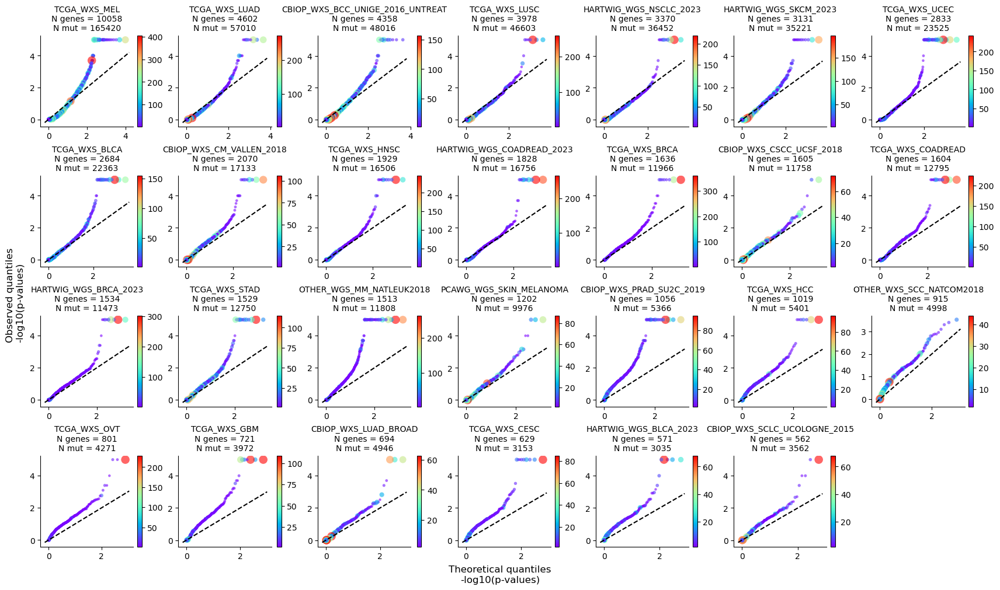

In [24]:
df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=500)
qq_plot(df_results, filename=False, figsize=(17, 10), tcga=False, title_fontsize=10, cols=7)

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/review/run_notnorm_2025-03-26_10-58-45/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


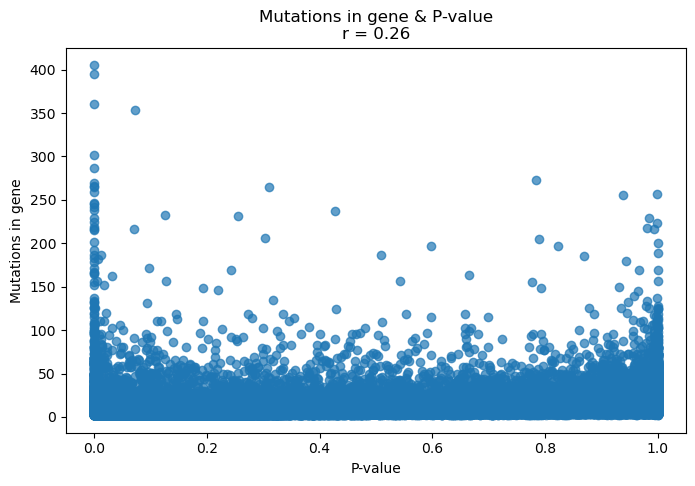

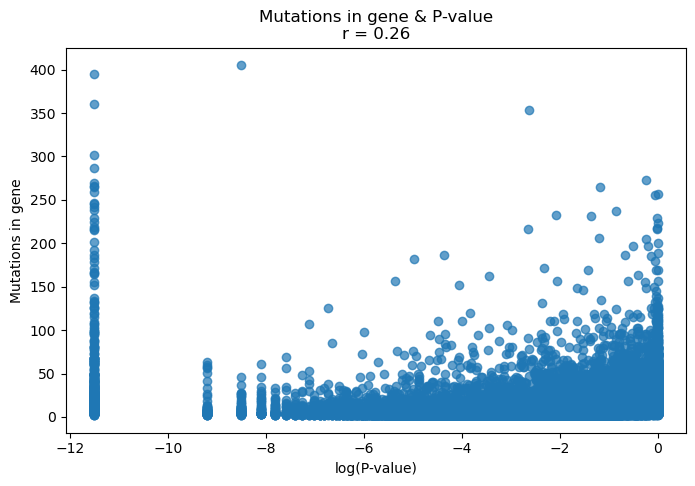

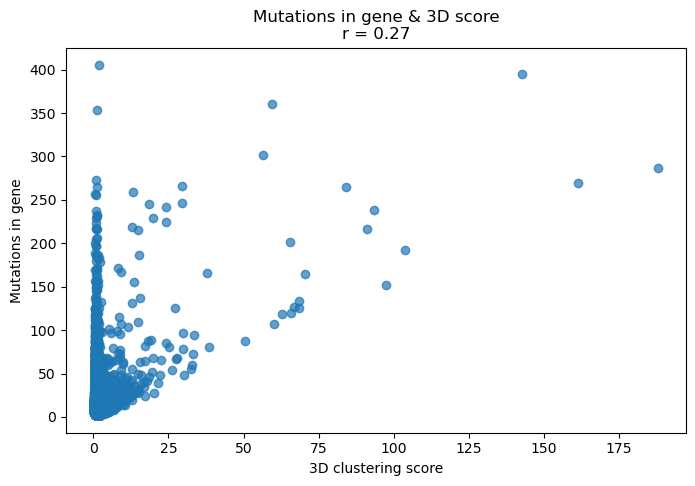

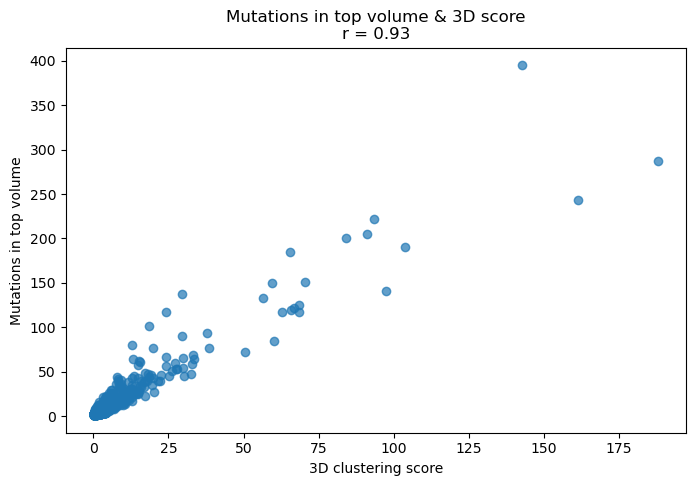

In [25]:
# Associations between N (number of mutations in the gene) and p-value or 3D score

df_results = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir)

# Create DataFrame
df = df_results

plt.figure(figsize=(8, 5))
plt.scatter(df["pval"], df["Mut_in_gene"], alpha=0.7)
plt.xlabel("P-value")
plt.ylabel("Mutations in gene")
plt.title(f'Mutations in gene & P-value\nr = {df["pval"].corr(df["Mut_in_gene"]):.2f}')
plt.show()


# Create DataFrame
df = df_results

plt.figure(figsize=(8, 5))
plt.scatter(np.log(df["pval"]), df["Mut_in_gene"], alpha=0.7)
plt.xlabel("log(P-value)")
plt.ylabel("Mutations in gene")
plt.title(f'Mutations in gene & P-value\nr = {df["pval"].corr(df["Mut_in_gene"]):.2f}')
plt.show()


# Create DataFrame
df = df_results

plt.figure(figsize=(8, 5))
plt.scatter(df["Score_obs_sim_top_vol"], df["Mut_in_gene"], alpha=0.7)
plt.xlabel("3D clustering score")
plt.ylabel("Mutations in gene")
plt.title(f'Mutations in gene & 3D score\nr = {df["Score_obs_sim_top_vol"].corr(df["Mut_in_gene"]):.2f}')
plt.show()


# Create DataFrame
df = df_results

plt.figure(figsize=(8, 5))
plt.scatter(df["Score_obs_sim_top_vol"], df["Mut_in_top_vol"], alpha=0.7)
plt.xlabel("3D clustering score")
plt.ylabel("Mutations in top volume")
plt.title(f'Mutations in top volume & 3D score\nr = {df["Score_obs_sim_top_vol"].corr(df["Mut_in_top_vol"]):.2f}')
plt.show()

In [26]:
# Detected genes and score distribution
df_results_notnorm = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=False)
df_results_notnorm = df_results_notnorm[df_results_notnorm["qval"] < 0.01]
print("Detected gene-cancer:", len(df_results_notnorm))
print("Detected gene:", len(df_results_notnorm.Gene.unique()))

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/review/run_notnorm_2025-03-26_10-58-45/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv
Detected gene-cancer: 740
Detected gene: 363


<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


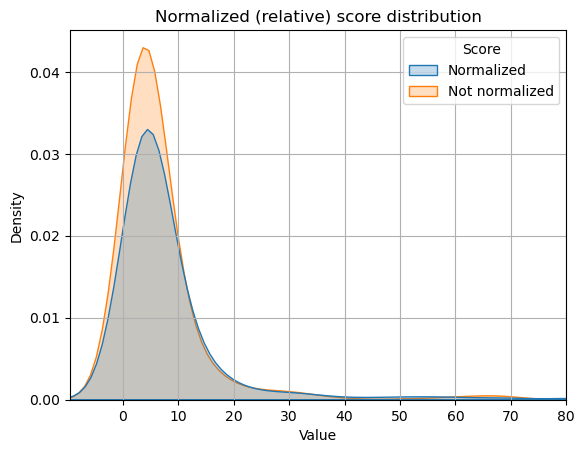

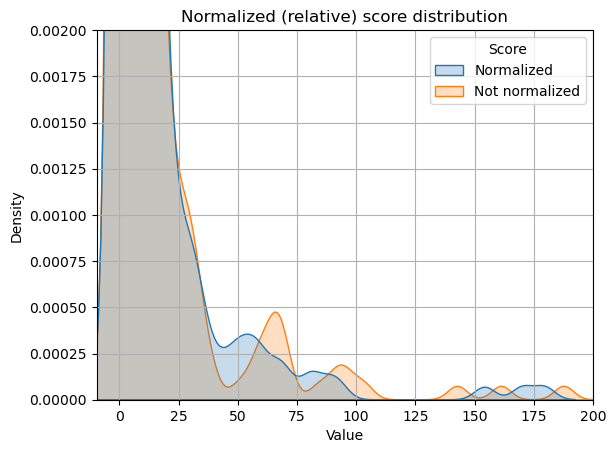

In [27]:
import seaborn as sns

# Score distribution

df_results_norm["Score"] = "Normalized"
df_results_notnorm["Score"] = "Not normalized"
df_results_plot = pd.concat((df_results_norm[["Score", "Score_obs_sim_top_vol"]], df_results_notnorm[["Score", "Score_obs_sim_top_vol"]]))

sns.kdeplot(data = df_results_plot, x="Score_obs_sim_top_vol", fill=True, hue="Score")
plt.title("Normalized (relative) score distribution")
plt.xlabel("Value")
plt.ylabel("Density")
plt.xlim(-9.5, 80)
plt.grid(True)
plt.show()

sns.kdeplot(data = df_results_plot, x="Score_obs_sim_top_vol", fill=True, hue="Score")
plt.title("Normalized (relative) score distribution")
plt.xlabel("Value")
plt.ylabel("Density")
plt.xlim(-9.5, 200)
plt.ylim(0, 0.002)
plt.grid(True)
plt.show()

## Analysis of the 3D clustering score

In [28]:
from functools import reduce
import operator
from decimal import Decimal, getcontext
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np


def dcm_factorial(n):
    """
    Compute factorial.
    """
    return reduce(operator.mul, [Decimal(i) for i in range(1, int(n)+1)], Decimal(1))


def dcm_binom_coeff(n, k):
    """
    Compute binomial coefficient.
    """
    
    return dcm_factorial(n) / (dcm_factorial(k) * dcm_factorial(n - k))


def dcm_binom_cdf(k, n, p):
    """
    Compute binomial cumulative distribution function (CDF).
    """
    
    p = Decimal(p)
    q = Decimal(1) - p
    cdf = Decimal(0)
    for i in range(int(k) + 1):
        cdf += dcm_binom_coeff(n, i) * (p ** i) * (q ** (n - i))
        
    return cdf


def dcm_binom_sf(k, n, p):
    """
    Compute binomial survival function (SF).
    """
    
    return Decimal('1') - dcm_binom_cdf(k, n, p)


def dcm_binom_logsf(k, n, p):
    """
    Compute log binomial survival function.
    """
    
    sf = dcm_binom_sf(k, n, p)
    if sf <= 0:
        return np.inf
    return sf.ln()


def get_dcm_anomaly_score(k, n, p, decimal=600):          
    """
    Use the decimal package to compute the anomaly score 
    with high precision to avoid approximation of the 
    numerator.
    
    Score: loglik equal or larger mut_count / loglik(N)
    """

    getcontext().prec = decimal
    num = dcm_binom_logsf(k-1, n, p)
    den = stats.binom.logpmf(k=n, n=n, p=p)

    return float(num / Decimal(den))


def get_anomaly_score(vec_mut_in_vol, gene_mut, vec_vol_miss_mut_prob):          
    """
    Compute a metric that scores the anomaly of observing a certain 
    number of mutations in the volume of a residue.
    It takes into account the volume and the mutation rate of the codon 
    of each residue within that volume.
    
    Score: loglik equal or larger mut_count / loglik(N)
    """
    
    den = stats.binom.logpmf(k=gene_mut, n=gene_mut, p=vec_vol_miss_mut_prob)
    score = stats.binom.logsf(k=vec_mut_in_vol-1, n=gene_mut, p=vec_vol_miss_mut_prob) / den

    return score if not np.isinf(score) else get_dcm_anomaly_score(vec_mut_in_vol, gene_mut, vec_vol_miss_mut_prob)



def get_dcm_anomaly_score_notnorm(k, n, p, decimal=600):          
    """
    Use the decimal package to compute the anomaly score 
    with high precision to avoid approximation of the 
    numerator.
    
    Score: loglik equal or larger mut_count / loglik(N)
    """

    return dcm_binom_logsf(k-1, n, p)


def get_anomaly_score_notnorm(vec_mut_in_vol, gene_mut, vec_vol_miss_mut_prob):          
    """
    Compute a metric that scores the anomaly of observing a certain 
    number of mutations in the volume of a residue.
    It takes into account the volume and the mutation rate of the codon 
    of each residue within that volume.
    
    Score: loglik equal or larger mut_count / loglik(N)
    """
    

    score = -stats.binom.logsf(k=vec_mut_in_vol-1, n=gene_mut, p=vec_vol_miss_mut_prob)

    return score if not np.isinf(score) else -get_dcm_anomaly_score_notnorm(vec_mut_in_vol, gene_mut, vec_vol_miss_mut_prob)

In [29]:
def plot_score_comparison(n_points=30, n_fixed=30, p_fixed=1e-8, figsize=(12, 10), annot=False):

    # 1. Vary x and y, fix p
    k_vals = np.arange(1, n_points+1)
    n_vals = np.arange(1, n_points+1)
    K, N = np.meshgrid(k_vals, n_vals)
    P1 = np.array([[get_anomaly_score(k, n, p_fixed) if k <= n else np.nan for k in k_vals] for n in n_vals])

    # 2. Vary x and p, fix y
    p_vals = np.logspace(-0.5, -7, n_points)
    K2, P2 = np.meshgrid(k_vals, p_vals)
    N2 = np.array([[get_anomaly_score(k, n_fixed, p) for k in k_vals] for p in p_vals])


    # Plotting
    fig = plt.figure(figsize=figsize)

    # Plot 1
    ax1 = fig.add_subplot(2, 2, 1) 
    df_heatmap1 = pd.DataFrame(np.flipud(P1), index=[str(n) for n in n_vals[::-1]], columns=[str(k) for k in k_vals])
    sns.heatmap(df_heatmap1, ax=ax1, annot=annot, cmap="rainbow", cbar=True, vmin=0, vmax=np.nanmax(P1), cbar_kws={"label": "Score"}, )
    ax1.set_title(f"Score vs k and n (p = {p_fixed})")
    ax1.set_xlabel("k (mutations in volume)")
    ax1.set_ylabel("n (mutations in gene)")

    # Plot 2
    ax2 = fig.add_subplot(2, 2, 2)  
    df_heatmap2 = pd.DataFrame(np.flipud(N2), index=[f"{p:.0e}" for p in p_vals[::-1]], columns=[str(k) for k in k_vals])
    sns.heatmap(df_heatmap2, ax=ax2, annot=annot, cmap="rainbow", cbar=True, vmin=0, vmax=np.nanmax(N2), cbar_kws={"label": "Score"}, )
    ax2.set_title(f"Score vs k and p (n = {n_fixed})")
    ax2.set_xlabel("k (mutations in volume)")
    ax2.set_ylabel("p (volume mutation prob)")


    # 3. Vary x and y, fix p
    p_fixed = 1e-8
    n_points = n_points
    k_vals = np.arange(1, n_points+1)
    n_vals = np.arange(1, n_points+1)
    K, N = np.meshgrid(k_vals, n_vals)
    P1 = np.array([[get_anomaly_score_notnorm(k, n, p_fixed) if k <= n else np.nan for k in k_vals] for n in n_vals])

    # 4. Vary x and p, fix y
    p_vals = np.logspace(-0.5, -10, n_points)
    K2, P2 = np.meshgrid(k_vals, p_vals)
    N2 = np.array([[get_anomaly_score_notnorm(k, n_fixed, p) for k in k_vals] for p in p_vals])


    # Plot 3
    ax3 = fig.add_subplot(2, 2, 3)

    df_heatmap1 = pd.DataFrame(np.flipud(P1), index=[str(n) for n in n_vals[::-1]], columns=[str(k) for k in k_vals])
    sns.heatmap(df_heatmap1, ax=ax3, annot=annot, cbar_kws={"label": "Score"}, #fmt=".2e", 
                cmap="rainbow", cbar=True, vmin=0, vmax=np.nanmax(P1))
    ax3.set_title(f"Score vs k and n (p = {p_fixed})")
    ax3.set_xlabel("k (mutations in volume)")
    ax3.set_ylabel("n (mutations in gene)")


    # Plot 4
    ax4 = fig.add_subplot(2, 2, 4)

    df_heatmap2 = pd.DataFrame(np.flipud(N2), index=[f"{p:.0e}" for p in p_vals[::-1]], columns=[str(k) for k in k_vals])
    sns.heatmap(df_heatmap2, ax=ax4, annot=annot, cbar_kws={"label": "Score"}, #fmt=".2e", 
                cmap="rainbow", cbar=True, vmin=0, vmax=np.nanmax(N2))
    ax4.set_title(f"Score vs k and p (n = {n_fixed})")
    ax4.set_xlabel("k (mutations in volume)")
    ax4.set_ylabel("p (volume mutation prob)")

    fig.text(0.5, 1.005, "Normalized score", ha='center', va='center', fontsize=14)
    fig.text(0.5, 0.505, "Not normalized score", ha='center', va='center', fontsize=14)

    plt.tight_layout()
    plt.show()

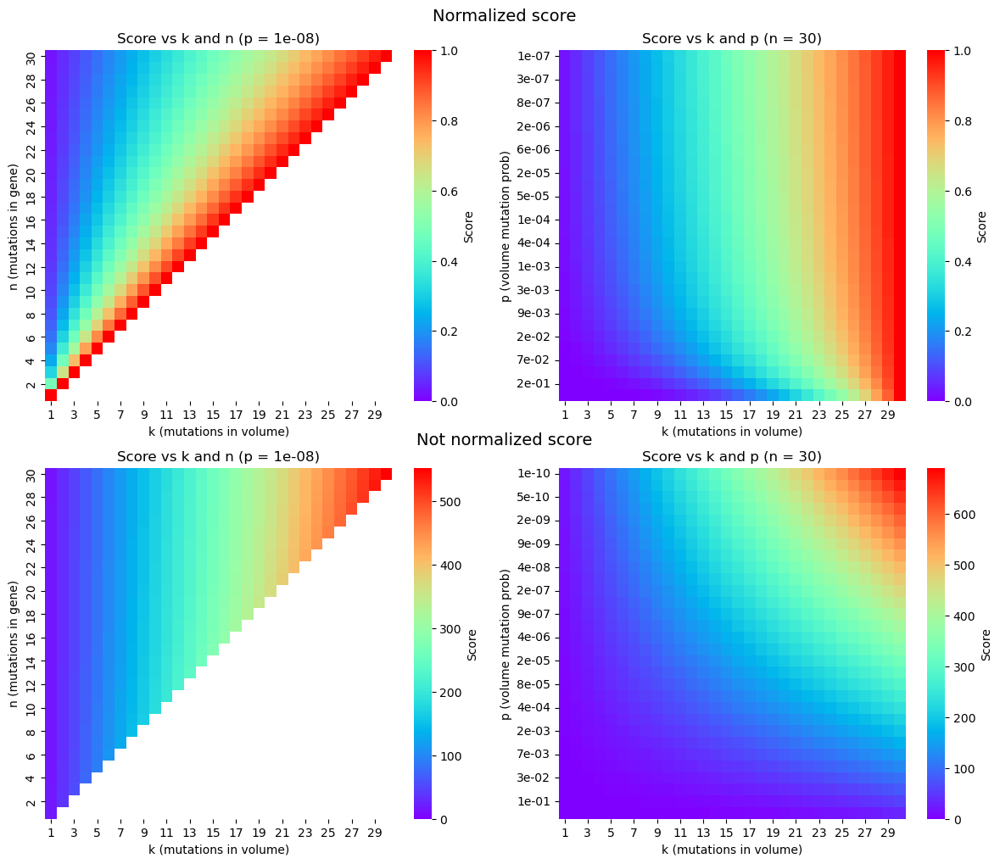

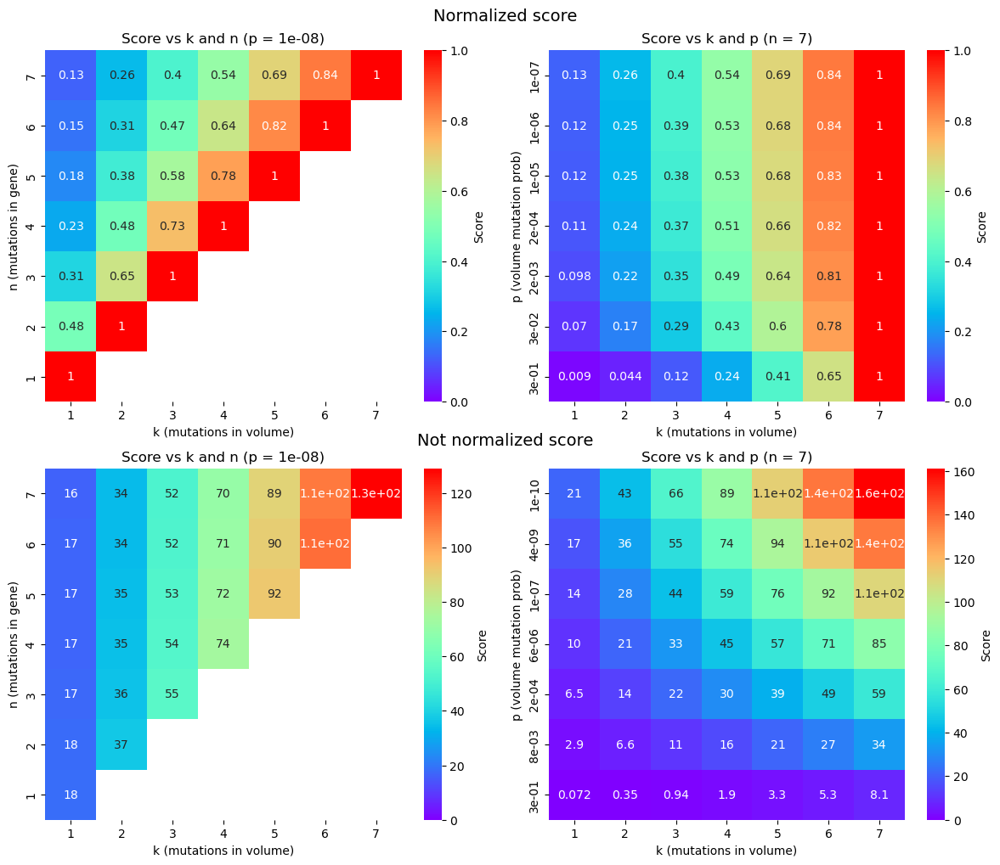

In [30]:
plot_score_comparison(n_points=30, n_fixed=30, p_fixed=1e-8, figsize=(12, 10))
plot_score_comparison(n_points=7, n_fixed=7, p_fixed=1e-8, figsize=(12, 10), annot=True)

### Same exercise but rescaling the two scores to the same scale

In [31]:
def plot_score_rescaled_comparison(n_points=30, n_fixed=30, figsize=(12, 10), annot=False):


    # Vary x and p, fix y

    n_points = n_points
    k_vals = np.arange(1, n_points+1)
    p_vals = np.logspace(-0.9, -4, n_points)
    score = np.array([[get_anomaly_score(k, n_fixed, p) for k in k_vals] for p in p_vals])
    score = score / sum(score)
    score_notnorm = np.array([[get_anomaly_score_notnorm(k, n_fixed, p) for k in k_vals] for p in p_vals])
    score_notnorm = score_notnorm / sum(score_notnorm)
    score_diff = score - score_notnorm
    
    max_score = np.max(np.abs(score_diff))
    min_score = -max_score

    # Plot 
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(2, 2, 1) 

    df_heatmap2 = pd.DataFrame(np.flipud(score_diff), index=[f"{p:.0e}" for p in p_vals[::-1]], columns=[str(k) for k in k_vals])
    sns.heatmap(df_heatmap2, ax=ax, annot=annot, cbar_kws={"label": "Score - Score NotNorm\n+Score                                                                           +Score NotNorm"}, #fmt=".2e", 
                cmap="coolwarm_r", cbar=True, vmin=min_score, vmax=max_score)
    ax.set_title(f"Score (Normalized - Not Normalized)\nvs\nk and p\n(n = {n_fixed})")
    ax.set_xlabel("k (mutations in volume)")
    ax.set_ylabel("p (volume mutation prob)")

    # fig.text(0.5, 1.005, "Normalized score", ha='center', va='center', fontsize=14)
    # fig.text(0.5, 0.505, "Not normalized score", ha='center', va='center', fontsize=14)

    plt.tight_layout()
    plt.show()

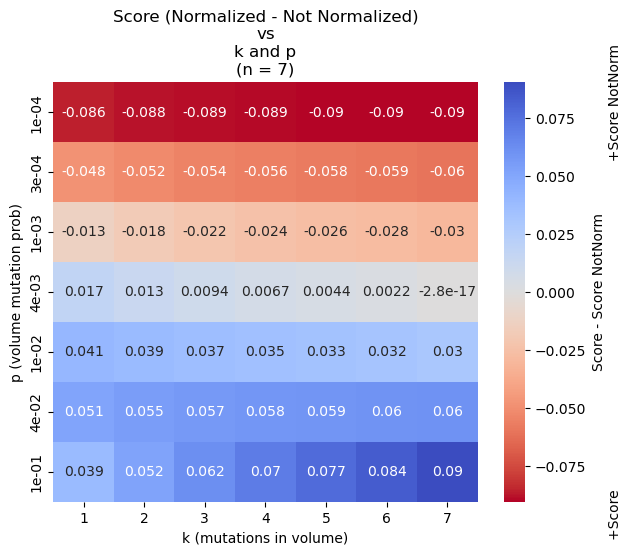

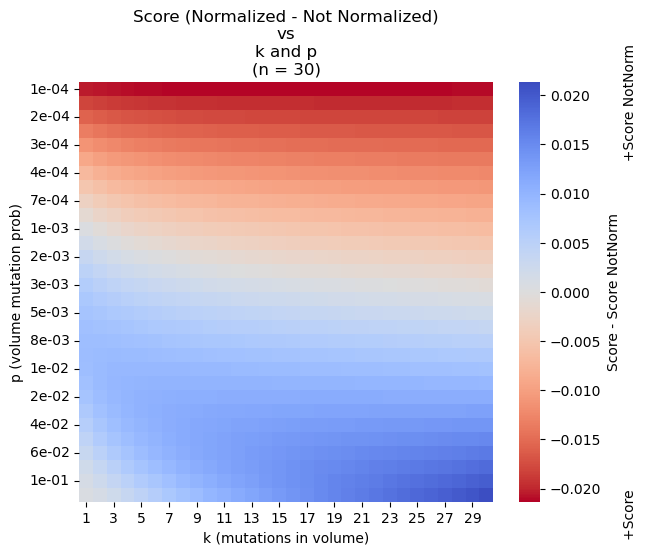

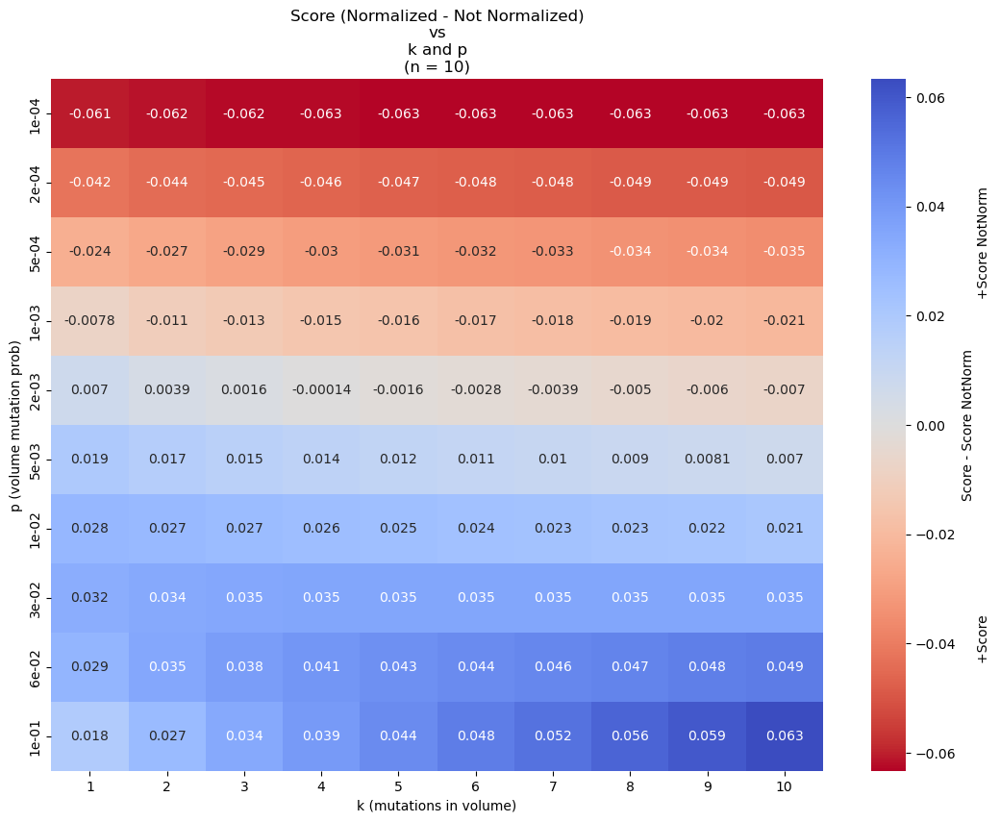

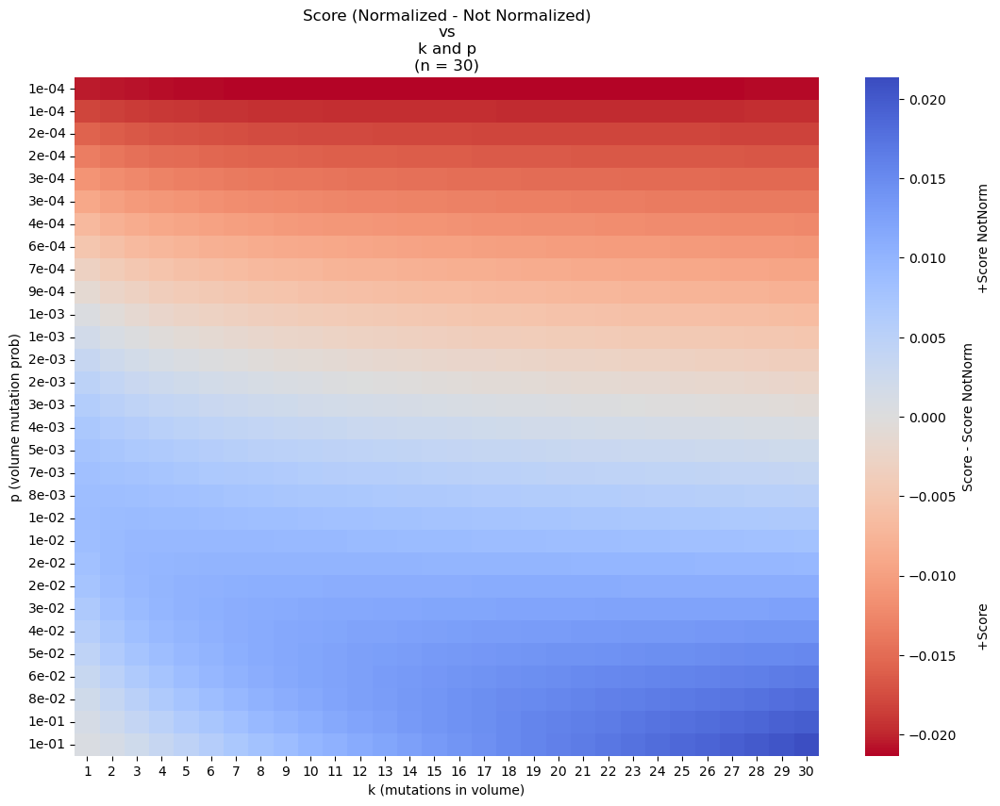

In [32]:
n=7
plot_score_rescaled_comparison(n_points=n, n_fixed=n, figsize=(12, 10), annot=True)
n=30
plot_score_rescaled_comparison(n_points=n, n_fixed=n, figsize=(12, 10), annot=False)
n=10
plot_score_rescaled_comparison(n_points=n, n_fixed=n, figsize=(21, 16), annot=True)
n=30
plot_score_rescaled_comparison(n_points=n, n_fixed=n, figsize=(21, 16), annot=False)

## Plot functions curves

In [33]:
import matplotlib.pyplot as plt

In [34]:
# score_diff = score - score_notnorm
# max_score = np.max((np.max(np.abs(score)), np.max(np.abs(score_notnorm))))
# min_score = -max_score
# max_score_diff = np.max(np.abs(score_diff))
# min_score_diff = -max_score

In [35]:
def plot_score_function_single(n=30, k_vals=[1, 3, 7, 15, 20, 25, 30], n_points=30, prob_range=(-0.9, -4), rescale=True):

    p_vals = np.logspace(prob_range[0], prob_range[1], n_points)

    score = np.array([[get_anomaly_score(k, n, p) for k in k_vals] for p in p_vals])
    score_notnorm = np.array([[get_anomaly_score_notnorm(k, n, p) for k in k_vals] for p in p_vals])

    if rescale:
        score = score / sum(score)
        score_notnorm = score_notnorm / sum(score_notnorm)


    # Plot
    # ----

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5), sharey=True)
    x_vals = np.arange(len(p_vals))

    for i, k in enumerate(k_vals):
        ax1.plot(x_vals, score[:, i], label=f'k={k}')
        ax2.plot(x_vals, score_notnorm[:, i])

    ax1.set_title('Normalized Score', fontsize=14)
    ax1.set_ylabel(f'Score{" Scaled" if rescale else ""}', fontsize=12)
    ax1.set_xlabel("p (volume mutation prob)", fontsize=12)
    ax2.set_title('Not Normalized Score', fontsize=14)
    ax2.set_xlabel("p (volume mutation prob)", fontsize=12)

    ax1.set_xticks(x_vals[::4])
    ax1.set_xticklabels([f'{v:.4f}' for v in p_vals[::4]])
    ax2.set_xticks(x_vals[::4])
    ax2.set_xticklabels([f'{v:.4f}' for v in p_vals[::4]])

    for ax in [ax1, ax2]:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    fig.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncols=2, fontsize=12)

    plt.suptitle(f"N={n}", fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Plot differences
    score_diff = score - score_notnorm
    max_score = np.max((np.max(np.abs(score)), np.max(np.abs(score_notnorm))))
    min_score = -max_score
    max_score_diff = np.max(np.abs(score_diff))
    min_score_diff = -max_score
    
    fig, ax = plt.subplots(figsize=(6.5, 5))
    ax.plot(x_vals, score_diff)
    ax.axhline(y=0, color='gray', linestyle='--')
    ax.set_xticks(x_vals[::4])
    ax.set_xticklabels([f'{v:.4f}' for v in p_vals[::4]])
    ax.set_xlabel("p (volume mutation prob)", fontsize=12)
    ax.set_ylabel("Scaled Scores Difference\n(Normalized - Not Normalized)", fontsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.show()
    

def plot_score_function(n=30, k_vals=[1, 3, 7, 15, 20, 25, 30], n_points=30, prob_range=(-0.9, -4)):

    p_vals = np.logspace(prob_range[0], prob_range[1], n_points)

    score = np.array([[get_anomaly_score(k, n, p) for k in k_vals] for p in p_vals])
    score_notnorm = np.array([[get_anomaly_score_notnorm(k, n, p) for k in k_vals] for p in p_vals])


    rescaled_score = score / sum(score)
    rescaled_score_notnorm = score_notnorm / sum(score_notnorm)


    # Plot
    # ----

    fig, axes = plt.subplots(2, 2, figsize=(11, 10), sharey=False, sharex=True)
    x_vals = np.arange(len(p_vals))
    tick_indices = x_vals[::5]
    tick_labels = [f'{p:.1e}' for p in p_vals[::5]]

    for i, k in enumerate(k_vals):
 
        axes[0, 0].plot(x_vals, score[:, i], label=f'k={k}')
        axes[0, 1].plot(x_vals, score_notnorm[:, i])
        axes[1, 0].plot(x_vals, rescaled_score[:, i])
        axes[1, 1].plot(x_vals, rescaled_score_notnorm[:, i])


    axes[0, 0].set_title('Normalized', fontsize=14)
    axes[0, 1].set_title('Not Normalized', fontsize=14)
    axes[1, 0].set_title('Normalized Scaled', fontsize=14)
    axes[1, 1].set_title('Not Normalized Scaled', fontsize=14)

    axes[0, 0].set_ylabel('Score', fontsize=12)
    axes[1, 0].set_ylabel('Score Scaled', fontsize=12)

    for ax in axes[-1]:
        ax.set_xlabel("p (volume mutation prob)", fontsize=12)

    # X-tick formatting
    for row in axes:
        for ax in row:
            ax.set_xticks(x_vals[::4])
            ax.set_xticklabels([f'{v:.4f}' for v in p_vals[::4]])
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

    # External legend
    fig.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=12)

    plt.suptitle(f"N = {n}", fontsize=16)
    plt.tight_layout()
    plt.show()

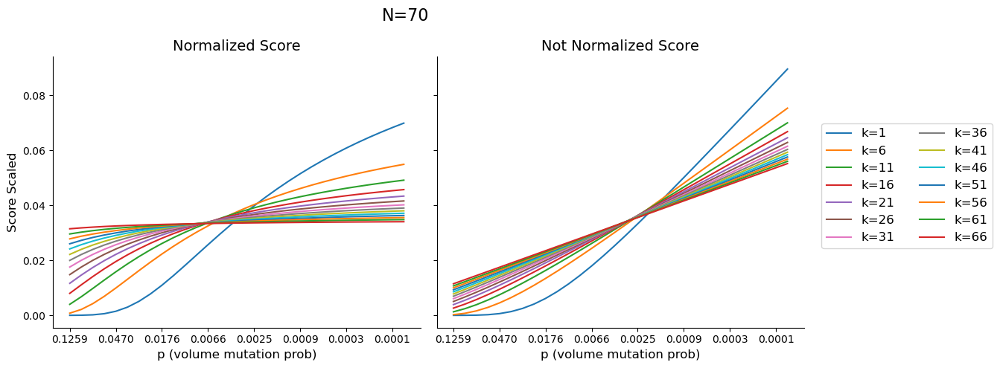

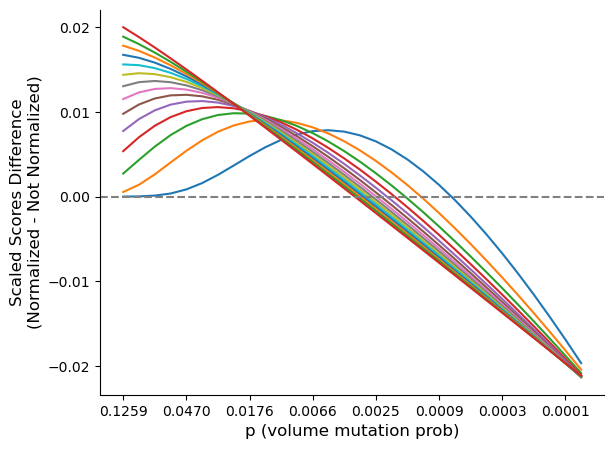

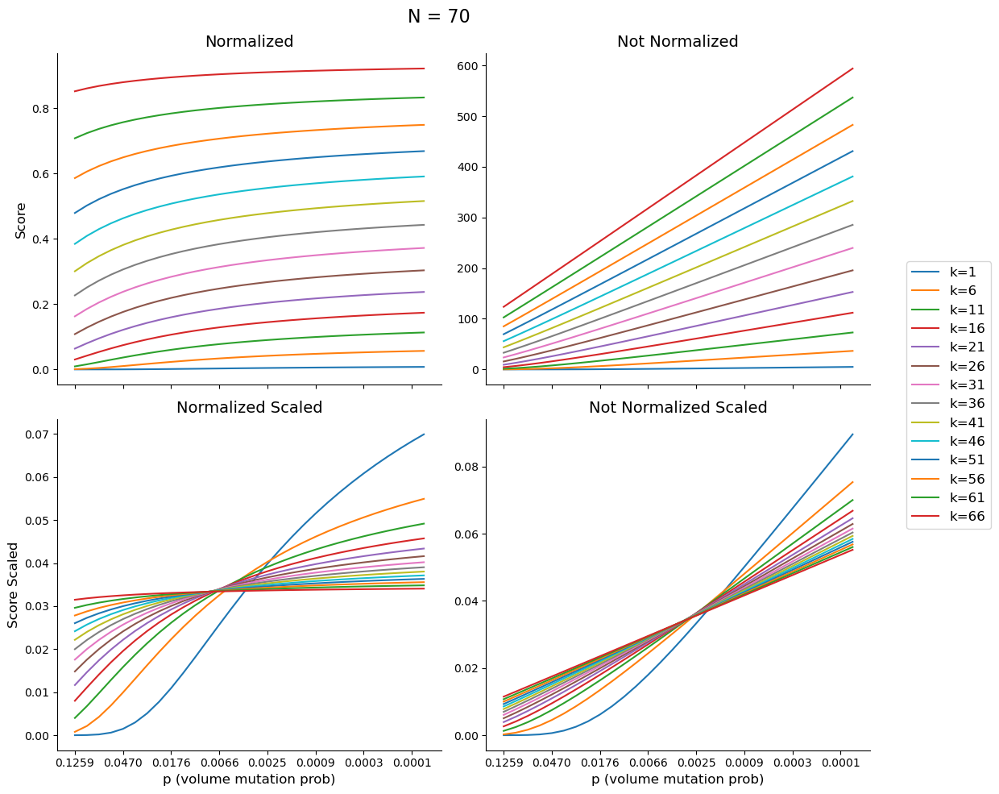

In [36]:
n = 70
plot_score_function_single(n=n, k_vals=np.arange(1, n+1)[::5])
plot_score_function(n=n, k_vals=np.arange(1, n+1)[::5])

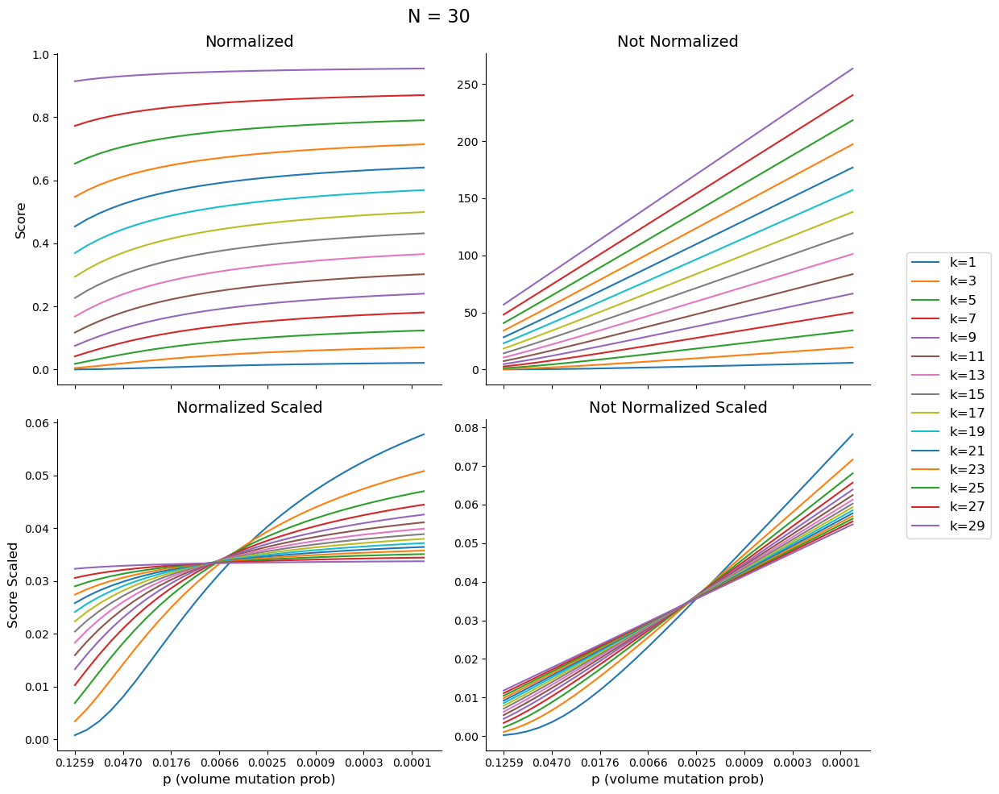

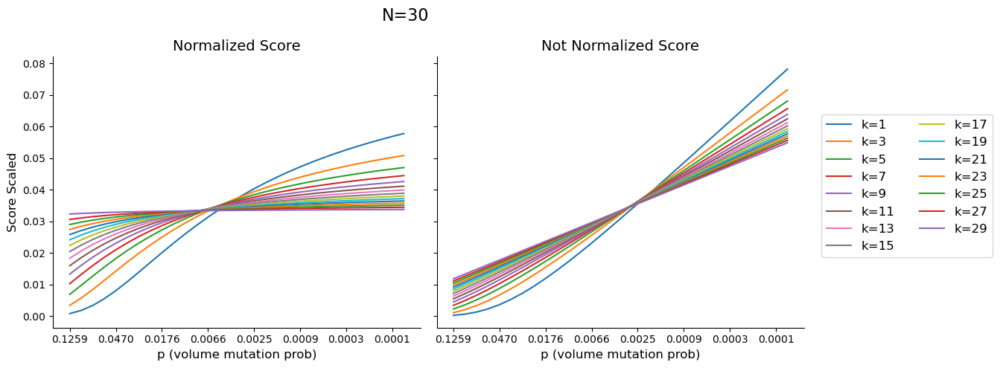

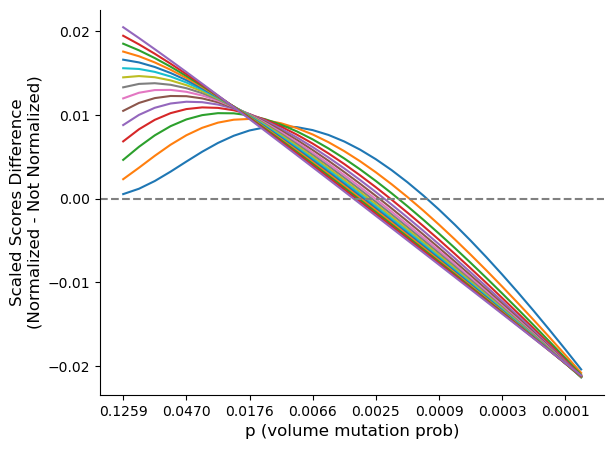

In [37]:
n = 30
plot_score_function(n=n, k_vals=np.arange(1, n+1)[::2])
plot_score_function_single(n=n, k_vals=np.arange(1, n+1)[::2])

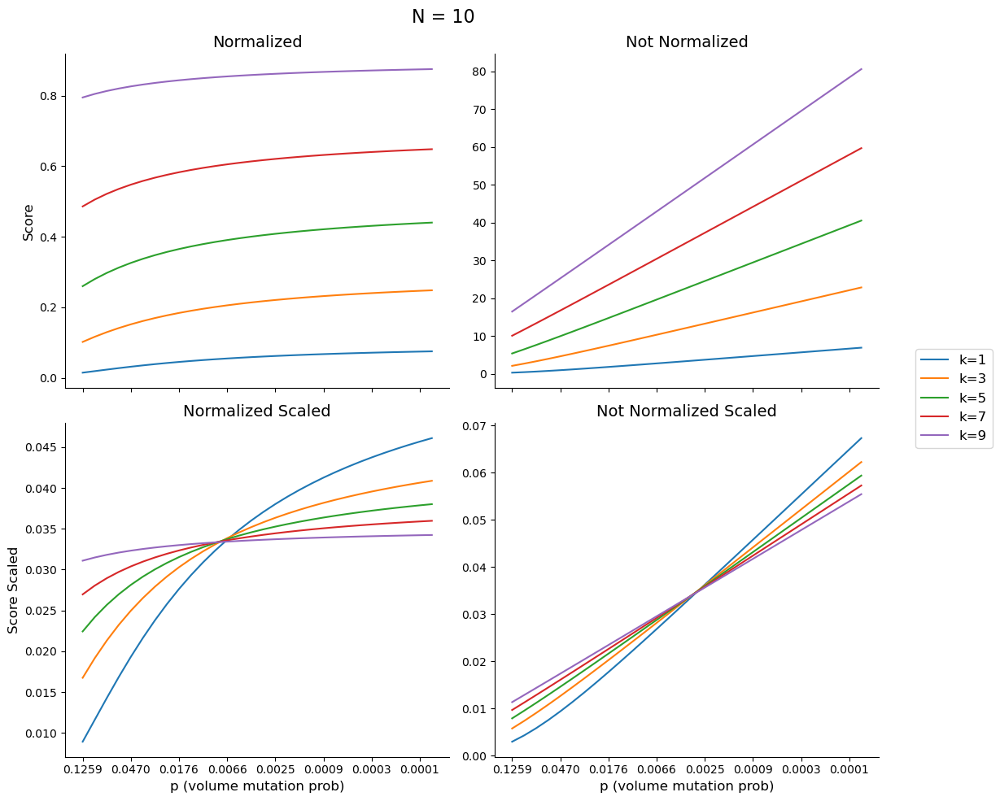

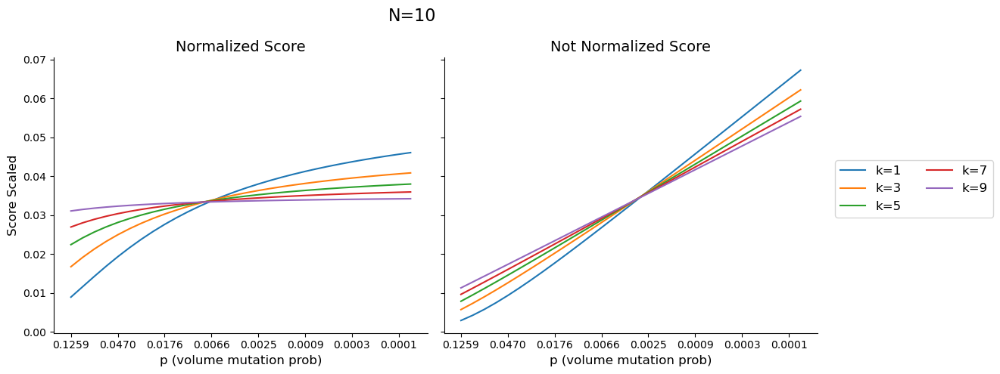

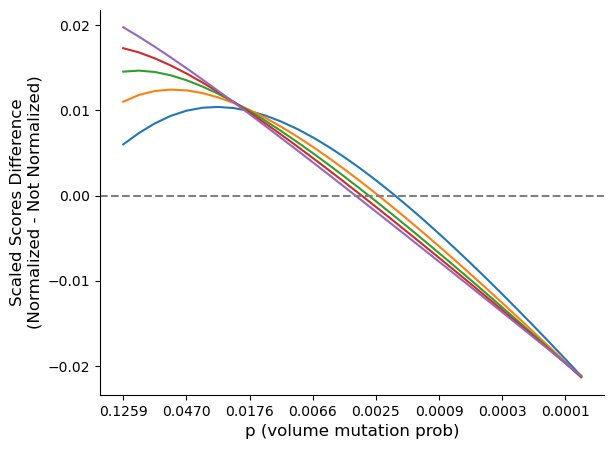

In [38]:
n = 10
plot_score_function(n=n, k_vals=np.arange(1, n+1)[::2])
plot_score_function_single(n=n, k_vals=np.arange(1, n+1)[::2])

In [39]:
# I could draw some lines showing average missense mutations probability for j contacts, across different genes in one cohort
# for example, get the average prob for residues with only 2 contacts. Do it for every gene, lets look at min, max, and average.
# do the same for different contacts values, and see what these probability might correspond to.

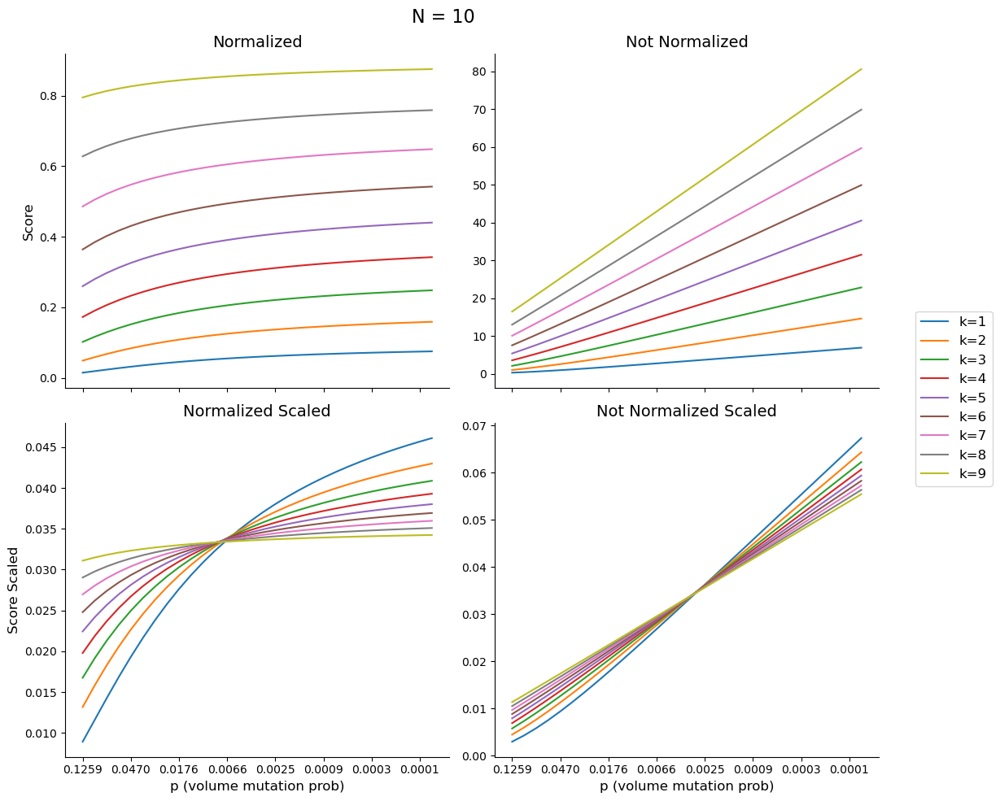

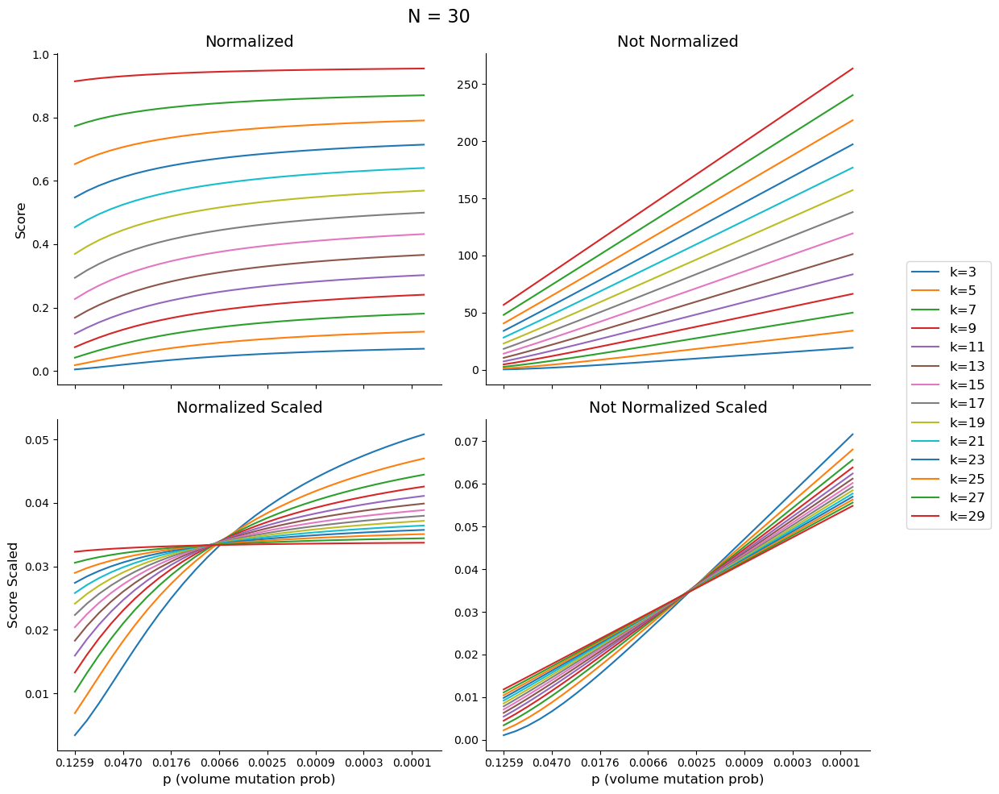

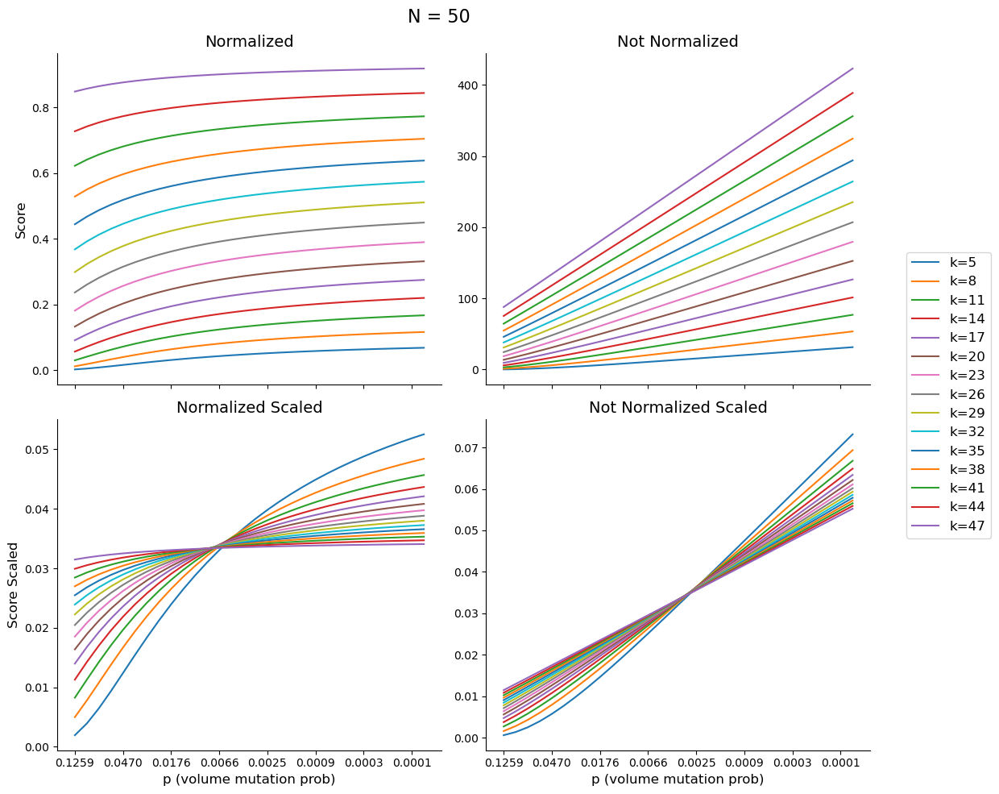

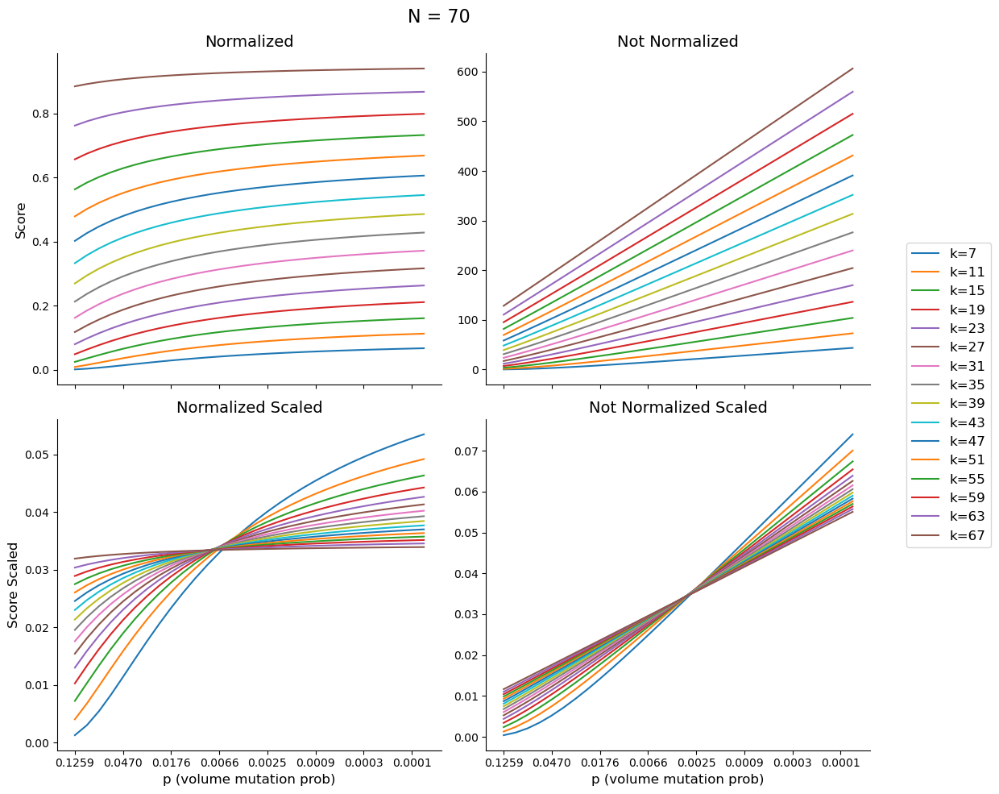

In [40]:
for n in np.arange(80)[10::20]:
    plot_score_function(n=n, k_vals=np.arange(n)[int(n/10)::int(n/20)+1])

## Other comparison

In [41]:
def get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=False):

    lst_df = []
    n_dict = {}
    for cohort in cohort_df["COHORT"].values:
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        path_csv = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv"
        path_input_mut = f"{maf_input_dir}/{cohort}.in.maf"
        if os.path.exists(path_csv):
            df_o3d = pd.read_csv(path_csv, low_memory=False)
            df_o3d = df_o3d[["Gene", "Uniprot_ID", "Cohort", "pval", "qval", "Score_obs_sim_top_vol", "Mut_in_top_vol", "Mut_in_gene", "Pos_top_vol"]].dropna(subset=["pval"]).reset_index(drop=True)
            df_o3d = df_o3d.reset_index().rename(columns={"index": "Rank"})
            
            df_o3d.pval = df_o3d.pval.replace(0, 0.00001)
            df_mut = pd.read_table(path_input_mut, low_memory=False)
            df_mut = df_mut[df_mut["Variant_Classification"] == "Missense_Mutation"].reset_index(drop=True)
            df_mut = df_mut[df_mut.Hugo_Symbol.isin(df_o3d.Gene.unique())]
            
            if min_n != False:
                if len(df_o3d) > min_n:
                    lst_df.append(df_o3d)
            else:
                lst_df.append(df_o3d)
                
            n_dict[cohort] = {}
            n_dict[cohort]["genes"] = len(df_o3d)
            n_dict[cohort]["mut"] = len(df_mut)
        else:
            print(f"Path doesn't exist: {path_csv}")
            
    df = pd.concat(lst_df)
    df["n_genes"] = df.Cohort.map(lambda x: n_dict[x]["genes"])
    df["n_mut"] = df.Cohort.map(lambda x: n_dict[x]["mut"])
    df = df.sort_values(["n_genes", "pval"], ascending=[False, True])

    return df.reset_index(drop=True)

In [42]:
SUBDIR = "review"
datasets = f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/"


RUN = "run_control_2025-03-21_11-24-24"
input_path = f"{datasets}/input/cancer_202404"
maf_input_dir = f"{input_path}/maf"
o3d_output_dir = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}"

cohort_df = pd.read_csv(f"{input_path}/cohorts.tsv", sep="\t")
cohort_df = cohort_df[~cohort_df.COHORT.str.startswith("ICGC")].reset_index(drop=True)

df_norm = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir)


RUN = "run_notnorm_2025-03-26_10-58-45"
input_path = f"{datasets}/input/cancer_202404"
maf_input_dir = f"{input_path}/maf"
o3d_output_dir = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}"

cohort_df = pd.read_csv(f"{input_path}/cohorts.tsv", sep="\t")
cohort_df = cohort_df[~cohort_df.COHORT.str.startswith("ICGC")].reset_index(drop=True)

df_notnorm = get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir)

Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/review/run_control_2025-03-21_11-24-24/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv
Path doesn't exist: /data/bbg/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/review/run_notnorm_2025-03-26_10-58-45/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


In [43]:
seq_df = pd.read_table(f"{WORKSPACE}/nobackup/scratch/oncodrive3d/datasets_mane_240506/seq_for_mut_prob.tsv")

gene_to_seq = seq_df.set_index('Gene')['Seq'].to_dict()
df_norm['Seq_Length'] = df_norm['Gene'].map(lambda x: len(gene_to_seq[x]) if x in gene_to_seq else np.nan)
df_notnorm['Seq_Length'] = df_notnorm['Gene'].map(lambda x: len(gene_to_seq[x]) if x in gene_to_seq else np.nan)

In [44]:
cols = ["Gene", "Cohort", "index", "pval", "qval", "Score_obs_sim_top_vol", "Mut_in_gene", "Mut_in_top_vol", "Pos_top_vol", "Seq_Length"]
df_norm = df_norm.rename(columns={col:f"{col}_1" for col in df_norm.columns if col not in ["Cohort", "Gene"]})
df_notnorm = df_notnorm.rename(columns={col:f"{col}_0" for col in df_notnorm.columns if col not in ["Cohort", "Gene"]})
df = df_norm.merge(df_notnorm, on=["Cohort", "Gene"], how="outer")
df = df.rename(columns={
    "Seq_Length_1":"Seq_Length",
    "Mut_in_gene_1":"Mut_in_gene",
    "Score_obs_sim_top_vol_1":"Score_1",
    "Score_obs_sim_top_vol_0":"Score_0"})

print(df["pval_1"].corr(df["Mut_in_gene"]))
print(df["pval_0"].corr(df["Mut_in_gene"]))

0.3039247133446716
0.25926810224200164


In [45]:
df.corr()[["Rank_1", "pval_1", "Score_1", "Rank_0", "pval_0", "Score_0"]].iloc[[0,1,3,4,10,11,13,14,5,9]]

,Rank_1,pval_1,Score_1,Rank_0,pval_0,Score_0
Rank_1,1.000000,0.719438,-0.175228,0.952911,0.638143,-0.148386
pval_1,0.719438,1.000000,-0.263474,0.670827,0.903112,-0.224964
Score_1,-0.175228,-0.263474,1.000000,-0.172022,-0.254600,0.987747
Mut_in_top_vol_1,-0.032633,-0.090684,0.931941,-0.029755,-0.082111,0.923753
Rank_0,0.952911,0.670827,-0.172022,1.000000,0.682648,-0.156527
pval_0,0.638143,0.903112,-0.254600,0.682648,1.000000,-0.238267
Score_0,-0.148386,-0.224964,0.987747,-0.156527,-0.238267,1.000000
Mut_in_top_vol_0,-0.038645,-0.096134,0.935521,-0.036245,-0.087971,0.928159
Mut_in_gene,0.312854,0.303925,0.264778,0.277379,0.259268,0.274495
Seq_Length,-0.049225,0.059171,-0.015803,-0.067848,0.030184,-0.012833


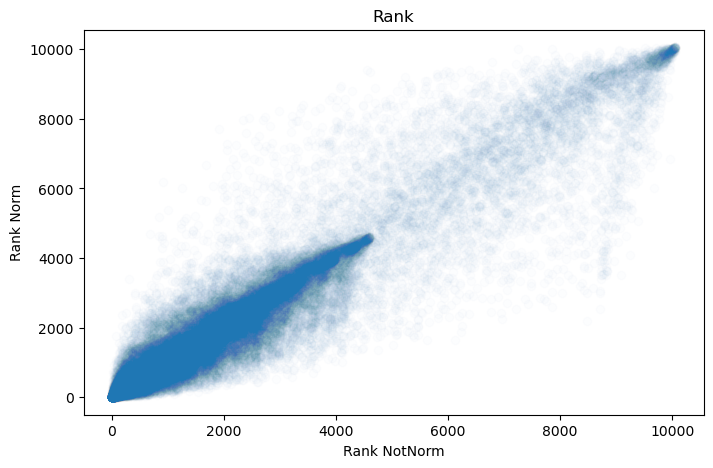

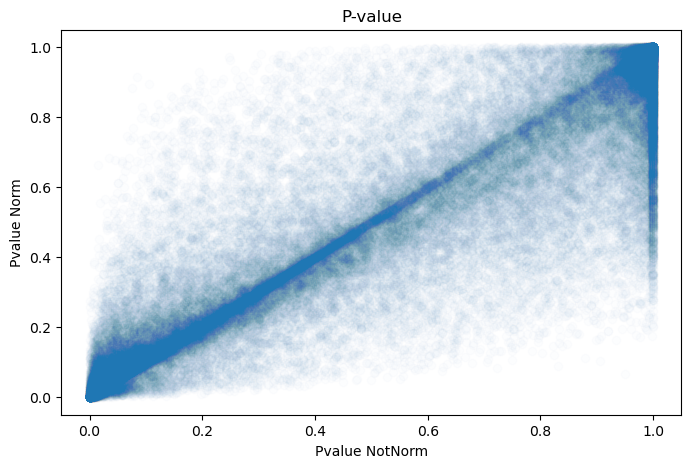

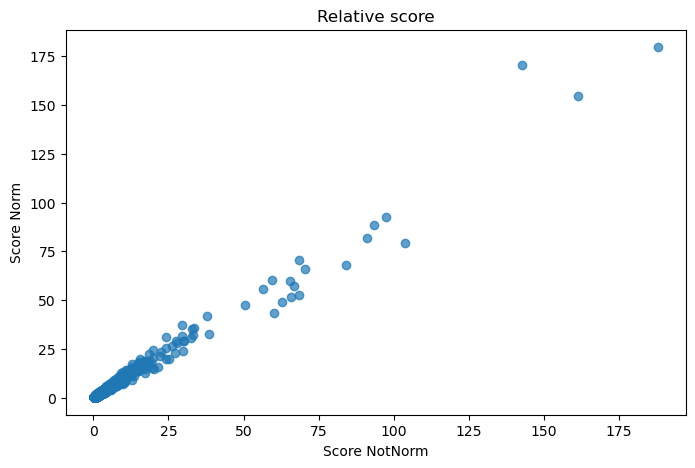

In [46]:
# Create DataFrame
df_plot = df.copy()
df_plot.pval_1 = df.pval_1.replace(0, 1e-5)
df_plot.pval_0 = df.pval_0.replace(0, 1e-5)

plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Rank_0"], df_plot["Rank_1"], alpha=0.01)
plt.xlabel("Rank NotNorm")
plt.ylabel("Rank Norm")
plt.title("Rank")
plt.show()

df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["pval_0"], df_plot["pval_1"], alpha=0.01)
plt.xlabel("Pvalue NotNorm")
plt.ylabel("Pvalue Norm")
plt.title("P-value")
plt.show()


df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.title("Relative score")
plt.xlabel("Score NotNorm")
plt.ylabel("Score Norm")
plt.scatter(df_plot["Score_0"], df_plot["Score_1"], alpha=0.7)
plt.show()

## Comparison in one cohort

In [47]:
cohort = "TCGA_WXS_BLCA"

from itertools import product

import daiquiri
import numpy as np
import json
from tqdm import tqdm


def get_unif_gene_miss_prob(size):
    """
    Get a uniformly distributed gene missense mutation 
    probability vector.
    """
    
    vector = np.ones(size)
    vector[0] = 0
    
    return vector / sum(vector)


def mut_rate_vec_to_dict(mut_rate):
    """
    Convert the vector of mut mut_rate of 96 channels to a dictionary of 192 
    items: the keys are mutations in trinucleotide context (e.g., "ACA>A") 
    and values are the corresponding mut rate (frequency of mut normalized 
    for the nucleotide content).
    """
    
    cb  = dict(zip('ACGT', 'TGCA'))
    mut_rate_dict = {}
    i = 0
    for ref in ['C', 'T']:
        for alt in cb.keys():
            if ref == alt:
                continue
            else:
                for p in product(cb.keys(), repeat=2):
                    mut = f"{p[0]}{ref}{p[1]}>{alt}"
                    cmut = f"{cb[p[1]]}{cb[ref]}{cb[p[0]]}>{cb[alt]}"
                    mut_rate_dict[mut] = mut_rate[i]
                    mut_rate_dict[cmut] = mut_rate[i]
                    i +=1
                    
    return mut_rate_dict


def get_codons(dna_seq):
    """
    Get the list of codons from a DNA sequence.
    """
    
    return [dna_seq[i:i+3] for i in [n*3 for n in range(int(len(dna_seq) / 3))]]


def translate_dna_to_prot(dna_seq, gencode):
    """
    Translate a DNA sequence into amino acid sequence.
    """
    
    return "".join([gencode[codon] for codon in get_codons(dna_seq)])


def codons_trinucleotide_context(lst_contexts):
    
    return list(zip(lst_contexts[::3], lst_contexts[1::3], lst_contexts[2::3]))


# TODO: doc function

def get_miss_mut_prob(dna_seq, 
                      dna_tricontext, 
                      mut_rate_dict, 
                      mutability=False, 
                      get_probability=True, 
                      mut_start_codon=False):
    """
    Generate a list including the probabilities that the 
    codons can mutate resulting into a missense mutations.
    
    Arguments
    ---------
    dna_seq: str
        Sequence of DNA
    mut_rate_dict: dict
        Mutation rate probability as values and the 96 possible
        trinucleotide contexts as keys
    gencode: dict
        Nucleotide as values and codons as keys
        
    Returns
    -------
    missense_prob_vec: list
        List of probabilities (one for each codon or prot res) 
        of a missense mutation  
    """

    # Initialize
    gencode = {
        'ATA':'I', 'ATC':'I', 'ATT':'I', 'ATG':'M',
        'ACA':'T', 'ACC':'T', 'ACG':'T', 'ACT':'T',
        'AAC':'N', 'AAT':'N', 'AAA':'K', 'AAG':'K',
        'AGC':'S', 'AGT':'S', 'AGA':'R', 'AGG':'R',
        'CTA':'L', 'CTC':'L', 'CTG':'L', 'CTT':'L',
        'CCA':'P', 'CCC':'P', 'CCG':'P', 'CCT':'P',
        'CAC':'H', 'CAT':'H', 'CAA':'Q', 'CAG':'Q',
        'CGA':'R', 'CGC':'R', 'CGG':'R', 'CGT':'R',
        'GTA':'V', 'GTC':'V', 'GTG':'V', 'GTT':'V',
        'GCA':'A', 'GCC':'A', 'GCG':'A', 'GCT':'A',
        'GAC':'D', 'GAT':'D', 'GAA':'E', 'GAG':'E',
        'GGA':'G', 'GGC':'G', 'GGG':'G', 'GGT':'G',
        'TCA':'S', 'TCC':'S', 'TCG':'S', 'TCT':'S',
        'TTC':'F', 'TTT':'F', 'TTA':'L', 'TTG':'L',
        'TAC':'Y', 'TAT':'Y', 'TAA':'_', 'TAG':'_',
        'TGC':'C', 'TGT':'C', 'TGA':'_', 'TGG':'W'}

    # Get all codons of the seq
    #logger.debug("Getting codons of seq..")
    codons = get_codons(dna_seq)
    missense_prob_vec = []
    
    # Get the trinucleotide context as list of tuples of 3 elements corresponding to each codon   
    #logger.debug("Getting tri context seq..")                               
    tricontext = codons_trinucleotide_context(dna_tricontext.split(","))
    
    # Iterate through codons and get prob of missense based on context
    for c in range(len(codons)):
        missense_prob = 0
        codon = codons[c]
        aa = gencode[codon]         
        trinucl0, trinucl1, trinucl2  = tricontext[c]

        # Iterate through the possible contexts of a missense mut
        for i, trinucl in enumerate([trinucl0, trinucl1, trinucl2]):
            ref = trinucl[1]
            aa = gencode[codon]

            # Iterate through the possible alt 
            for alt in "ACGT":
                if alt != ref:         
                    alt_codon = [n for n in codon]
                    alt_codon[i] = alt
                    alt_codon = "".join(alt_codon)
                    alt_aa = gencode[alt_codon]  
                    # If there is a missense mut, get prob from context and sum it
                    if alt_aa != aa and alt_aa != "_":
                        if not mutability:
                            mut = f"{trinucl}>{alt}"    # query using only the trinucleotide change
                            mut_prob = mut_rate_dict[mut] if mut in mut_rate_dict else 0                                                                 
                            missense_prob += mut_prob

                        else:
                            # TODO this has not been tested
                            cdna_pos = (c * 3) + i  # compute the cDNA position of the residue
                            if cdna_pos in mut_rate_dict:
                                missense_prob += mut_rate_dict[cdna_pos].get(alt, 0)
                            else:
                                missense_prob += 0

        missense_prob_vec.append(missense_prob)

    # Assign 0 prob to the first residue
    if mut_start_codon == False:
        missense_prob_vec[0] = 0
        
    # Convert into probabilities
    if get_probability:
        missense_prob_vec = np.array(missense_prob_vec) / sum(missense_prob_vec)
    
    return list(missense_prob_vec)


def get_miss_mut_prob_dict(mut_rate_dict, seq_df, mutability=False, mutability_config=None):
    """
    Given a dictionary of mut rate in 96 contexts (mut profile) and a 
    dataframe including Uniprot ID, HUGO symbol and DNA sequences, 
    get a dictionary with UniprotID-Fragment as keys and corresponding 
    vectors of missense mutation probabilities as values.
    """

    miss_prob_dict = {}

    if mutability:
        # TODO if the execution time of this step is too long we could
        # parallelize all these loops so that each gene is done in parallel

        # Process any Protein/fragment in the sequence df
        for _, row in seq_df.iterrows():
            # Mutabilities
            mutability_dict = Mutabilities(row.Uniprot_ID, row.Chr, row.Exons_coord, len(row.Seq_dna), row.Reverse_strand, mutability_config).mutabilities_by_pos
            miss_prob_dict[f"{row.Uniprot_ID}-F{row.F}"] = get_miss_mut_prob(row.Seq_dna, row.Tri_context, mutability_dict, mutability=True)

    else:
        # Process any Protein/fragment in the sequence df
        for _, row in seq_df.iterrows():
            miss_prob_dict[f"{row.Uniprot_ID}-F{row.F}"] = get_miss_mut_prob(row.Seq_dna, row.Tri_context, mut_rate_dict)
    
    return miss_prob_dict


def get_cmap(cmap_path, uniprot_id, af_f, cmap_prob_thr=0.5):
    
    cmap_complete_path = f"{cmap_path}/{uniprot_id}-F{af_f}.npy"
    cmap = np.load(cmap_complete_path) 
    cmap = cmap > cmap_prob_thr
    cmap = cmap.astype(int)
    
    return cmap


def get_vol_miss_prob(gene, cmap_path, miss_prob_dict, seq_df):
    
    seq_df_gene = seq_df[seq_df["Gene"] == gene]
    uniprot_id = seq_df_gene['Uniprot_ID'].values[0]
    af_f = seq_df_gene['F'].values[0]
    
    cmap = get_cmap(cmap_path, uniprot_id, af_f)
    gene_miss_prob = np.array(miss_prob_dict[f"{uniprot_id}-F{af_f}"])
    vol_missense_mut_prob = np.dot(cmap, gene_miss_prob)
    
    return vol_missense_mut_prob
    

cmap_path = "/workspace/nobackup/scratch/oncodrive3d/datasets_mane_240506/prob_cmaps"
mut_profile_path = f"/workspace/projects/clustering_3d/o3d_analysys/datasets/input/cancer_202404/mut_profile/{cohort}.sig.json"
mut_profile = json.load(open(mut_profile_path, encoding="utf-8"))
miss_prob_dict = get_miss_mut_prob_dict(mut_rate_dict=mut_profile, seq_df=seq_df)

vol_miss_prob_dict = {}
for gene in tqdm(df.Gene.unique()):
    vol_miss_prob_dict[gene] =  get_vol_miss_prob(gene, cmap_path, miss_prob_dict, seq_df)

FileNotFoundError: [Errno 2] No such file or directory: '/workspace/projects/clustering_3d/o3d_analysys/datasets/input/cancer_202404/mut_profile/TCGA_WXS_BLCA.sig.json'

In [ ]:
cohort = "TCGA_WXS_BLCA"
SUBDIR = "review"
datasets = f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/"

RUN = "run_control_2025-03-21_11-24-24"
path = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}/{cohort}/{cohort}.3d_clustering_genes.csv"
df_norm = pd.read_csv(path)

RUN = "run_notnorm_2025-03-26_10-58-45"
path = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}/{cohort}/{cohort}.3d_clustering_genes.csv"
df_notnorm = pd.read_csv(path)

In [ ]:
seq_df = pd.read_table(f"{WORKSPACE}/nobackup/scratch/oncodrive3d/datasets_mane_240506/seq_for_mut_prob.tsv")

gene_to_seq = seq_df.set_index('Gene')['Seq'].to_dict()
df_norm['Seq_Length'] = df_norm['Gene'].map(lambda x: len(gene_to_seq[x]) if x in gene_to_seq else np.nan)
df_notnorm['Seq_Length'] = df_notnorm['Gene'].map(lambda x: len(gene_to_seq[x]) if x in gene_to_seq else np.nan)

In [ ]:
cols = ["Gene", "index", "pval", "qval", "Score_obs_sim_top_vol", "Mut_in_gene", "Mut_in_top_vol", "Pos_top_vol", "Seq_Length"]

df_norm = df_norm.reset_index()[cols].rename(columns={"index": "Rank"}).dropna(subset="pval")
df_norm = df_norm.rename(columns={col:f"{col}_1" for col in df_norm.columns if col != "Gene"})

df_notnorm = df_notnorm.reset_index()[cols].rename(columns={"index": "Rank"}).dropna(subset="pval")
df_notnorm = df_notnorm.rename(columns={col:f"{col}_0" for col in df_notnorm.columns if col != "Gene"})

df = df_norm.merge(df_notnorm, on="Gene", how="outer")
df

,Gene,Rank_1,pval_1,qval_1,Score_obs_sim_top_vol_1,Mut_in_gene_1,Mut_in_top_vol_1,Pos_top_vol_1,Seq_Length_1,Rank_0,pval_0,qval_0,Score_obs_sim_top_vol_0,Mut_in_gene_0,Mut_in_top_vol_0,Pos_top_vol_0,Seq_Length_0
0,PIK3CA,0,0.0,0.0,18.554445,87,45.0,542.0,1068.0,0,0.0,0.0,18.348227,87,47.0,545.0,1068.0
1,FGFR3,1,0.0,0.0,15.401595,63,34.0,249.0,806.0,1,0.0,0.0,15.576814,63,34.0,249.0,806.0
2,TP53,2,0.0,0.0,14.570084,155,49.0,245.0,393.0,2,0.0,0.0,13.527937,155,45.0,249.0,393.0
3,FBXW7,3,0.0,0.0,7.222402,20,15.0,505.0,707.0,5,0.0,0.0,6.211048,20,15.0,505.0,707.0
4,ERBB2,4,0.0,0.0,7.057737,50,19.0,310.0,1255.0,4,0.0,0.0,6.738814,50,19.0,310.0,1255.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2679,KLHDC2,2679,1.0,1.0,0.459673,7,2.0,241.0,406.0,2682,1.0,1.0,0.363414,7,1.0,347.0,406.0
2680,CYP11B2,2680,1.0,1.0,0.441947,11,2.0,317.0,503.0,2677,1.0,1.0,0.421241,11,2.0,317.0,503.0
2681,FABP9,2681,1.0,1.0,0.441689,5,2.0,127.0,132.0,2673,1.0,1.0,0.456938,5,2.0,127.0,132.0
2682,OR4K5,2682,1.0,1.0,0.429416,11,2.0,159.0,323.0,2679,1.0,1.0,0.409751,11,2.0,159.0,323.0


In [ ]:
def detected_norm_notnorm(x):
    
    if (x["qval_1"] < 0.01) & (x["qval_0"] < 0.01):
        return "C_01"
    
    elif (x["qval_1"] > 0.01) & (x["qval_0"] < 0.01):
        return "C_0"

    elif (x["qval_0"] > 0.01) & (x["qval_1"] < 0.01):
        return "C_1"
    
    else:
        return "None"
    
df["Detected"] = df.apply(lambda x: detected_norm_notnorm(x), axis=1)
top_genes = df.Gene.values[:30]
df

,Gene,Rank_1,pval_1,qval_1,Score_obs_sim_top_vol_1,Mut_in_gene_1,Mut_in_top_vol_1,Pos_top_vol_1,Seq_Length_1,Rank_0,pval_0,qval_0,Score_obs_sim_top_vol_0,Mut_in_gene_0,Mut_in_top_vol_0,Pos_top_vol_0,Seq_Length_0,Detected
0,PIK3CA,0,0.0,0.0,18.554445,87,45.0,542.0,1068.0,0,0.0,0.0,18.348227,87,47.0,545.0,1068.0,C_01
1,FGFR3,1,0.0,0.0,15.401595,63,34.0,249.0,806.0,1,0.0,0.0,15.576814,63,34.0,249.0,806.0,C_01
2,TP53,2,0.0,0.0,14.570084,155,49.0,245.0,393.0,2,0.0,0.0,13.527937,155,45.0,249.0,393.0,C_01
3,FBXW7,3,0.0,0.0,7.222402,20,15.0,505.0,707.0,5,0.0,0.0,6.211048,20,15.0,505.0,707.0,C_01
4,ERBB2,4,0.0,0.0,7.057737,50,19.0,310.0,1255.0,4,0.0,0.0,6.738814,50,19.0,310.0,1255.0,C_01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2679,KLHDC2,2679,1.0,1.0,0.459673,7,2.0,241.0,406.0,2682,1.0,1.0,0.363414,7,1.0,347.0,406.0,None
2680,CYP11B2,2680,1.0,1.0,0.441947,11,2.0,317.0,503.0,2677,1.0,1.0,0.421241,11,2.0,317.0,503.0,None
2681,FABP9,2681,1.0,1.0,0.441689,5,2.0,127.0,132.0,2673,1.0,1.0,0.456938,5,2.0,127.0,132.0,None
2682,OR4K5,2682,1.0,1.0,0.429416,11,2.0,159.0,323.0,2679,1.0,1.0,0.409751,11,2.0,159.0,323.0,None


In [ ]:
df = df.rename(columns={
    "Score_obs_sim_top_vol_1":"Score_1",
    "Score_obs_sim_top_vol_0":"Score_0"})
df.corr()[["Rank_1", "pval_1", "Score_1", "Rank_0", "pval_0", "Score_0"]].iloc[[0,1,3,5,8,9,11,13,7,5]]

,Rank_1,pval_1,Score_1,Rank_0,pval_0,Score_0
Rank_1,1.000000,0.999615,-0.494315,0.830976,0.828957,-0.433369
pval_1,0.999615,1.000000,-0.500064,0.832312,0.829751,-0.438755
Score_1,-0.494315,-0.500064,1.000000,-0.474467,-0.467602,0.976891
Mut_in_top_vol_1,-0.202959,-0.208683,0.900253,-0.182207,-0.176369,0.890075
Rank_0,0.830976,0.832312,-0.474467,1.000000,0.995538,-0.501110
pval_0,0.828957,0.829751,-0.467602,0.995538,1.000000,-0.493218
Score_0,-0.433369,-0.438755,0.976891,-0.501110,-0.493218,1.000000
Mut_in_top_vol_0,-0.211882,-0.217623,0.907255,-0.195071,-0.187374,0.899584
Seq_Length_1,0.220891,0.220981,-0.078565,0.146499,0.148682,-0.058563
Mut_in_top_vol_1,-0.202959,-0.208683,0.900253,-0.182207,-0.176369,0.890075


In [ ]:
df[:20]

,Gene,Rank_1,pval_1,qval_1,Score_1,Mut_in_gene_1,Mut_in_top_vol_1,Pos_top_vol_1,Seq_Length_1,Rank_0,pval_0,qval_0,Score_0,Mut_in_gene_0,Mut_in_top_vol_0,Pos_top_vol_0,Seq_Length_0,Detected
0,PIK3CA,0,0.0000,0.000000,18.554445,87,45.0,542.0,1068.0,0,0.0000,0.000000,18.348227,87,47.0,545.0,1068.0,C_01
1,FGFR3,1,0.0000,0.000000,15.401595,63,34.0,249.0,806.0,1,0.0000,0.000000,15.576814,63,34.0,249.0,806.0,C_01
2,TP53,2,0.0000,0.000000,14.570084,155,49.0,245.0,393.0,2,0.0000,0.000000,13.527937,155,45.0,249.0,393.0,C_01
3,FBXW7,3,0.0000,0.000000,7.222402,20,15.0,505.0,707.0,5,0.0000,0.000000,6.211048,20,15.0,505.0,707.0,C_01
4,ERBB2,4,0.0000,0.000000,7.057737,50,19.0,310.0,1255.0,4,0.0000,0.000000,6.738814,50,19.0,310.0,1255.0,C_01
5,KRAS,5,0.0000,0.000000,6.159702,16,13.0,59.0,188.0,3,0.0000,0.000000,6.801527,16,14.0,12.0,188.0,C_01
6,RXRA,6,0.0000,0.000000,5.875343,18,13.0,427.0,462.0,6,0.0000,0.000000,5.842422,18,13.0,427.0,462.0,C_01
7,HRAS,7,0.0000,0.000000,5.498907,15,13.0,13.0,189.0,7,0.0000,0.000000,5.213877,15,13.0,13.0,189.0,C_01
8,SF3B1,8,0.0000,0.000000,4.859567,20,10.0,902.0,1304.0,8,0.0000,0.000000,4.804373,20,10.0,902.0,1304.0,C_01
9,NFE2L2,9,0.0000,0.000000,4.738798,25,11.0,31.0,605.0,9,0.0000,0.000000,4.299217,25,11.0,31.0,605.0,C_01


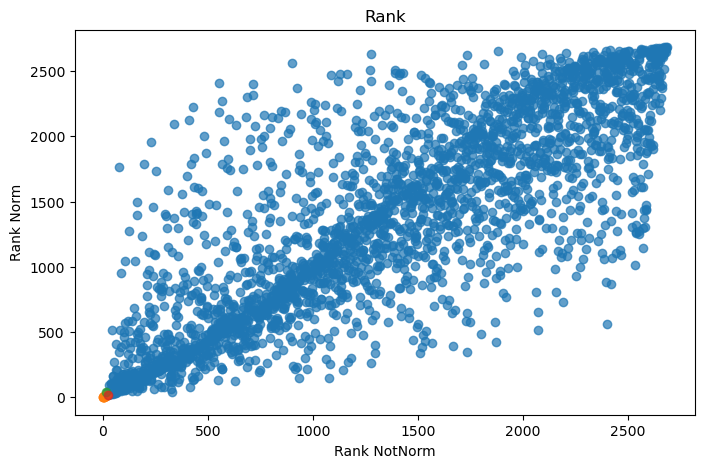

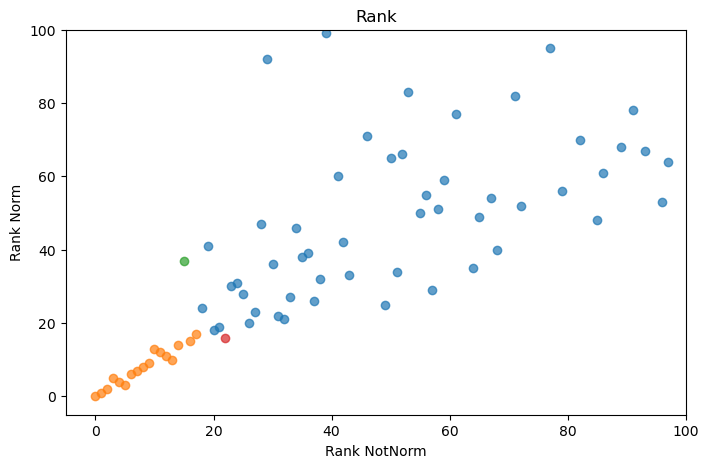

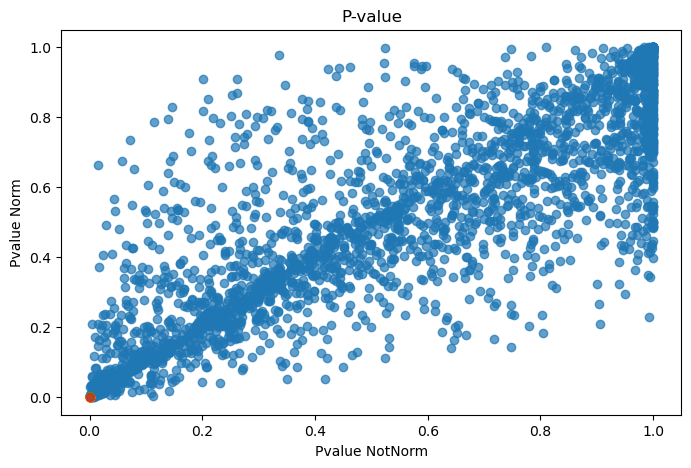

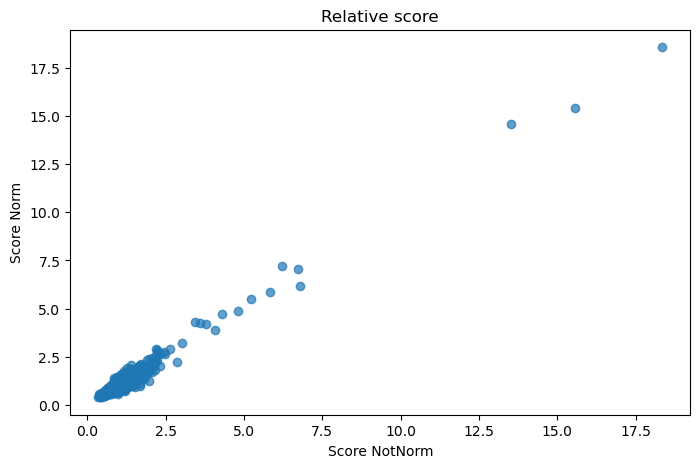

In [ ]:
# Create DataFrame
df_plot = df.copy()
df_plot.pval_1 = df.pval_1.replace(0, 1e-5)
df_plot.pval_0 = df.pval_0.replace(0, 1e-5)

plt.figure(figsize=(8, 5))
for name in ["None", "C_01", "C_0", "C_1"]:
    df_detect = df_plot[df_plot["Detected"] == name]
    plt.scatter(df_detect["Rank_0"], df_detect["Rank_1"], alpha=0.7, label=name)
plt.xlabel("Rank NotNorm")
plt.ylabel("Rank Norm")
plt.title("Rank")
plt.show()

plt.figure(figsize=(8, 5))
for name in ["None", "C_01", "C_0", "C_1"]:
    df_detect = df_plot[df_plot["Detected"] == name]
    plt.scatter(df_detect["Rank_0"], df_detect["Rank_1"], alpha=0.7, label=name)
plt.xlabel("Rank NotNorm")
plt.ylabel("Rank Norm")
plt.ylim(-5, 100)
plt.xlim(-5, 100)
plt.title("Rank")
plt.show()


df_plot = df.copy()
plt.figure(figsize=(8, 5))
for name in ["None", "C_01", "C_0", "C_1"]:
    df_detect = df_plot[df_plot["Detected"] == name]
    plt.scatter(df_detect["pval_0"], df_detect["pval_1"], alpha=0.7, label=name)
plt.xlabel("Pvalue NotNorm")
plt.ylabel("Pvalue Norm")
plt.title("P-value")
plt.show()


df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.title("Relative score")
plt.xlabel("Score NotNorm")
plt.ylabel("Score Norm")
plt.scatter(df_plot["Score_0"], df_plot["Score_1"], alpha=0.7)
plt.show()

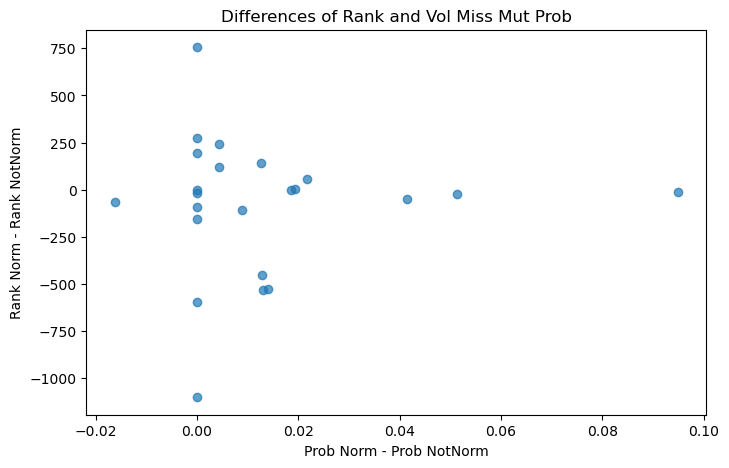

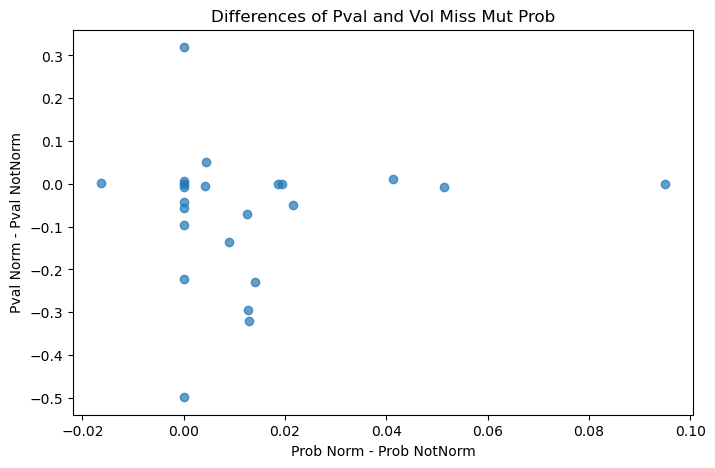

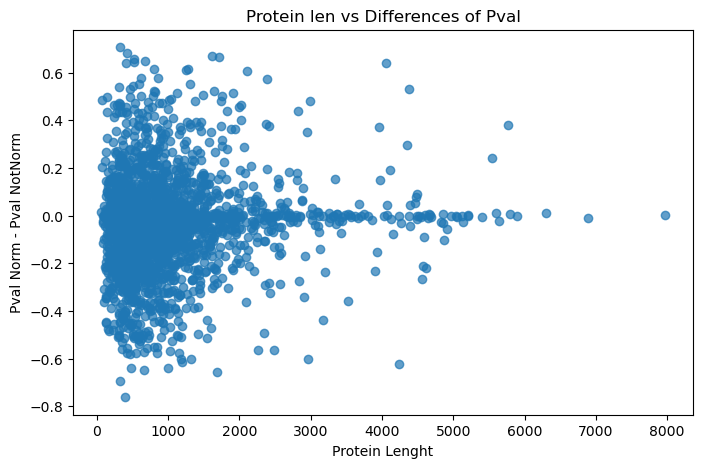

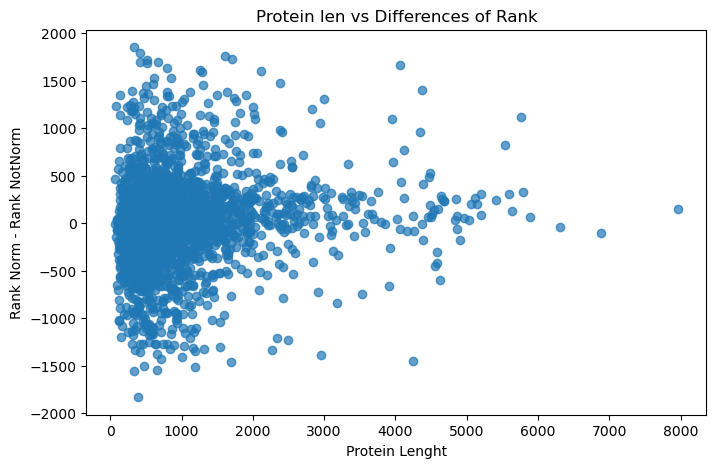

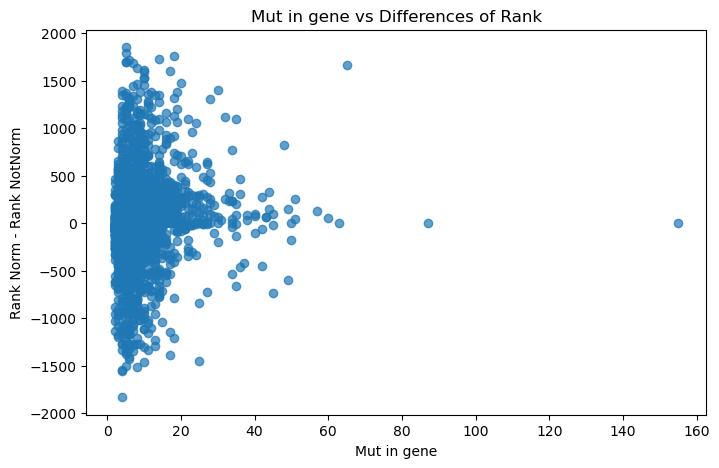

In [ ]:
df["Prob_1"] = lookup_prob(df["Gene"], df["Pos_top_vol_1"], vol_miss_prob_dict)
df["Prob_0"] = lookup_prob(df["Gene"], df["Pos_top_vol_0"], vol_miss_prob_dict)
df["Pval_diff"] = df["pval_1"] - df["pval_0"]
df["Score_diff"] = df["Score_1"] - df["Score_0"]
df["Mut_diff"] = df["Mut_in_top_vol_1"] - df["Mut_in_top_vol_0"]
df["Prob_diff"] = df["Prob_1"] - df["Prob_0"]
df["Rank_diff"] = df["Rank_1"] - df["Rank_0"]
df["Pos_dif"] = df["Pos_top_vol_1"] - df["Pos_top_vol_0"]
df["Pos_dif"] = (df["Pos_dif"] != 0).astype(int)
df["Mut_top_vol_diff"] = df["Mut_in_top_vol_1"] - df["Mut_in_top_vol_0"]


df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Prob_diff"], df_plot["Rank_diff"], alpha=0.7)
plt.xlabel("Prob Norm - Prob NotNorm")
plt.ylabel("Rank Norm - Rank NotNorm")
plt.title("Differences of Rank and Vol Miss Mut Prob")
plt.show()

df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Prob_diff"], df_plot["Pval_diff"], alpha=0.7)
plt.xlabel("Prob Norm - Prob NotNorm")
plt.ylabel("Pval Norm - Pval NotNorm")
plt.title("Differences of Pval and Vol Miss Mut Prob")
plt.show()

df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Seq_Length_1"], df_plot["Pval_diff"], alpha=0.7)
plt.xlabel("Protein Lenght")
plt.ylabel("Pval Norm - Pval NotNorm")
plt.title("Protein len vs Differences of Pval")
plt.show()

df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Seq_Length_1"], df_plot["Rank_diff"], alpha=0.7)
plt.xlabel("Protein Lenght")
plt.ylabel("Rank Norm - Rank NotNorm")
plt.title("Protein len vs Differences of Rank")
plt.show()

df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Mut_in_gene_0"], df_plot["Rank_diff"], alpha=0.7)
plt.xlabel("Mut in gene")
plt.ylabel("Rank Norm - Rank NotNorm")
plt.title("Mut in gene vs Differences of Rank")
plt.show()

# When there is a difference in pvalue and two different residues are selected as top, the Normalized Score has almost always preference for the one with higher probability to mutate (likely buried ones)

In [ ]:
def lookup_prob(gene_series, pos_series, vol_dict):
    result = []
    for gene, pos in zip(gene_series, pos_series):
        if gene in vol_dict and pd.notna(pos):
            try:
                prob_list = vol_dict[gene]
                index = int(pos) - 1
                if 0 <= index < len(prob_list):
                    result.append(prob_list[index])
                else:
                    result.append(np.nan)
            except (TypeError, IndexError):
                result.append(np.nan)
        else:
            result.append(np.nan)
    return result

In [ ]:
df[["Pval_diff", "Score_diff", "Prob_diff", "Rank_diff", "Pos_dif", "Mut_top_vol_diff", "Mut_in_gene_0", "Seq_Length_0"]].corr()

,Pval_diff,Score_diff,Prob_diff,Rank_diff,Pos_dif,Mut_top_vol_diff,Mut_in_gene_0,Seq_Length_0
Pval_diff,1.000000,-0.628281,0.090301,0.957815,-0.075231,-0.056885,0.061558,0.076375
Score_diff,-0.628281,1.000000,0.327236,-0.687222,-0.073633,0.116933,-0.066414,-0.102096
Prob_diff,0.090301,0.327236,1.000000,0.031536,0.465333,0.495796,0.016587,-0.338699
Rank_diff,0.957815,-0.687222,0.031536,1.000000,-0.031752,-0.068749,0.134767,0.127967
Pos_dif,-0.075231,-0.073633,0.465333,-0.031752,1.000000,0.132298,0.101720,0.043024
Mut_top_vol_diff,-0.056885,0.116933,0.495796,-0.068749,0.132298,1.000000,0.182080,0.015331
Mut_in_gene_0,0.061558,-0.066414,0.016587,0.134767,0.101720,0.182080,1.000000,0.718544
Seq_Length_0,0.076375,-0.102096,-0.338699,0.127967,0.043024,0.015331,0.718544,1.000000


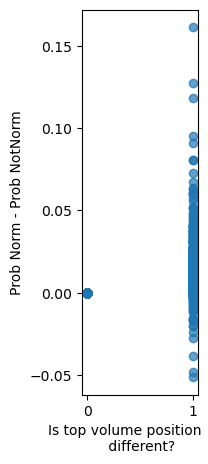

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(1.5, 5))
plt.scatter(df_plot["Pos_dif"], df_plot["Prob_diff"], alpha=0.7)
plt.xlabel("Is top volume position       \n different?")
plt.ylabel("Prob Norm - Prob NotNorm")
plt.show()

# As expected, the probability for equal res are the same

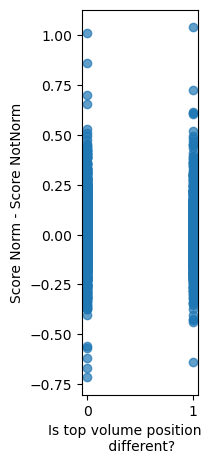

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(1.5, 5))
plt.scatter(df_plot["Pos_dif"], df_plot["Score_diff"], alpha=0.7)
plt.xlabel("Is top volume position       \n different?")
plt.ylabel("Score Norm - Score NotNorm")
# plt.title("Top volume position vs Differences of Pval\nbetween Genes Top Residues")
plt.show()

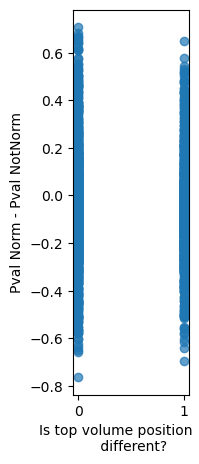

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(1.5, 5))
plt.scatter(df_plot["Pos_dif"], df_plot["Pval_diff"], alpha=0.7)
plt.xlabel("Is top volume position       \n different?")
plt.ylabel("Pval Norm - Pval NotNorm")
# plt.title("Top volume position vs Differences of Pval\nbetween Genes Top Residues")
plt.show()

# There seem to be large differences even on pvalues from the same volume

In [ ]:
cols = ["Gene",	"Rank_1", "Rank_0", "pval_1", "pval_0", "Score_1", "Score_0", "Prob_1", "Prob_0", "Rank_diff", "Pval_diff",	"Score_diff", "Prob_diff", "Mut_diff", "Pos_dif", "Mut_in_gene_0", "Seq_Length_0"]
df = df[cols].rename(columns={"Mut_in_gene_0":"Mut_in_gene", "Seq_Length_0":"Protein_len"})
df[:50]

,Gene,Rank_1,Rank_0,pval_1,pval_0,Score_1,Score_0,Prob_1,Prob_0,Rank_diff,Pval_diff,Score_diff,Prob_diff,Mut_diff,Pos_dif,Mut_in_gene,Protein_len
0,PIK3CA,0,0,0.0000,0.0000,18.554445,18.348227,0.020614,0.016234,0,0.0000,0.206218,0.004380,-2.0,1,87,1068.0
1,FGFR3,1,1,0.0000,0.0000,15.401595,15.576814,0.016933,0.016933,0,0.0000,-0.175220,0.000000,0.0,0,63,806.0
2,TP53,2,2,0.0000,0.0000,14.570084,13.527937,0.052401,0.033857,0,0.0000,1.042146,0.018544,4.0,1,155,393.0
3,FBXW7,3,5,0.0000,0.0000,7.222402,6.211048,0.035411,0.035411,-2,0.0000,1.011354,0.000000,0.0,0,20,707.0
4,ERBB2,4,4,0.0000,0.0000,7.057737,6.738814,0.015131,0.015131,0,0.0000,0.318923,0.000000,0.0,0,50,1255.0
5,KRAS,5,3,0.0000,0.0000,6.159702,6.801527,0.085815,0.066476,2,0.0000,-0.641826,0.019339,-1.0,1,16,188.0
6,RXRA,6,6,0.0000,0.0000,5.875343,5.842422,0.030653,0.030653,0,0.0000,0.032921,0.000000,0.0,0,18,462.0
7,HRAS,7,7,0.0000,0.0000,5.498907,5.213877,0.100183,0.100183,0,0.0000,0.285030,0.000000,0.0,0,15,189.0
8,SF3B1,8,8,0.0000,0.0000,4.859567,4.804373,0.010659,0.010659,0,0.0000,0.055194,0.000000,0.0,0,20,1304.0
9,NFE2L2,9,9,0.0000,0.0000,4.738798,4.299217,0.021244,0.021244,0,0.0000,0.439581,0.000000,0.0,0,25,605.0


### Use pos result

In [ ]:
RUN = "run_control_2025-03-21_11-24-24"
path = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}/{cohort}/{cohort}.3d_clustering_pos.csv"
df_norm_pos = pd.read_csv(path).dropna(subset="pval")

RUN = "run_notnorm_2025-03-26_10-58-45"
path = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}/{cohort}/{cohort}.3d_clustering_pos.csv"
df_notnorm_pos = pd.read_csv(path).dropna(subset="pval")


cols = ["Gene", "Pos", "Mut_in_gene", "Score", "Score_obs_sim", "pval", "Rank"]
df_norm_pos = df_norm_pos[cols].rename(columns={col:f"{col}_1" for col in df_norm_pos.columns if col not in ["Gene", "Pos", "Mut_in_gene"]})

df_notnorm_pos = df_notnorm_pos[cols].rename(columns={col:f"{col}_0" for col in df_notnorm_pos.columns if col not in ["Gene", "Pos", "Mut_in_gene"]})

df = df_norm_pos.merge(df_notnorm_pos, on=["Gene", "Pos", "Mut_in_gene"], how="outer")
df

,Gene,Pos,Mut_in_gene,Score_1,Score_obs_sim_1,pval_1,Rank_1,Score_0,Score_obs_sim_0,pval_0,Rank_0
0,AADAT,68,4,0.345370,0.859617,0.5473,1,3.809423,0.742222,0.8784,1
1,AADAT,66,4,0.352478,0.810230,0.6471,0,4.105037,0.725810,0.8473,0
2,AADAT,105,4,0.164824,0.435667,1.0000,2,2.628673,0.549844,1.0000,2
3,AADAT,313,4,0.150180,0.417316,1.0000,3,2.005367,0.444036,1.0000,3
4,AAR2,284,3,0.531982,1.088755,0.2936,1,4.137143,0.858847,0.5674,1
...,...,...,...,...,...,...,...,...,...,...,...
21153,ZZEF1,924,17,0.025884,0.395318,1.0000,10,2.182656,0.415832,1.0000,10
21154,ZZEF1,196,17,0.026703,0.393374,1.0000,8,2.314997,0.421468,1.0000,8
21155,ZZEF1,736,17,0.025988,0.389893,1.0000,9,2.199094,0.409601,1.0000,9
21156,ZZEF1,333,17,0.028864,0.389542,1.0000,4,2.698241,0.438574,1.0000,4


In [ ]:
df["Mis_mut_prob"] = lookup_prob(df["Gene"], df["Pos"], vol_miss_prob_dict)
df["Pval_diff"] = df["pval_1"] - df["pval_0"]
df["Score_diff"] = df["Score_obs_sim_1"] - df["Score_obs_sim_0"]
df["Rank_diff"] = df["Rank_1"] - df["Rank_0"]
df

,Gene,Pos,Mut_in_gene,Score_1,Score_obs_sim_1,pval_1,Rank_1,Score_0,Score_obs_sim_0,pval_0,Rank_0,Mis_mut_prob,Pval_diff,Score_diff,Rank_diff
0,AADAT,68,4,0.345370,0.859617,0.5473,1,3.809423,0.742222,0.8784,1,NaN,-0.3311,0.117395,0
1,AADAT,66,4,0.352478,0.810230,0.6471,0,4.105037,0.725810,0.8473,0,NaN,-0.2002,0.084420,0
2,AADAT,105,4,0.164824,0.435667,1.0000,2,2.628673,0.549844,1.0000,2,NaN,0.0000,-0.114176,0
3,AADAT,313,4,0.150180,0.417316,1.0000,3,2.005367,0.444036,1.0000,3,NaN,0.0000,-0.026720,0
4,AAR2,284,3,0.531982,1.088755,0.2936,1,4.137143,0.858847,0.5674,1,NaN,-0.2738,0.229907,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21153,ZZEF1,924,17,0.025884,0.395318,1.0000,10,2.182656,0.415832,1.0000,10,NaN,0.0000,-0.020514,0
21154,ZZEF1,196,17,0.026703,0.393374,1.0000,8,2.314997,0.421468,1.0000,8,NaN,0.0000,-0.028094,0
21155,ZZEF1,736,17,0.025988,0.389893,1.0000,9,2.199094,0.409601,1.0000,9,NaN,0.0000,-0.019708,0
21156,ZZEF1,333,17,0.028864,0.389542,1.0000,4,2.698241,0.438574,1.0000,4,NaN,0.0000,-0.049032,0


In [ ]:
df.sort_values("Score_0", ascending=False)[:60]

,Gene,Pos,Mut_in_gene,Score_1,Score_obs_sim_1,pval_1,Rank_1,Score_0,Score_obs_sim_0,pval_0,Rank_0
13993,PIK3CA,545,87,0.381449,18.137633,0.0,0,136.748597,18.348227,0.0,0
13992,PIK3CA,542,87,0.348651,18.554445,0.0,1,117.744719,17.660717,0.0,1
6880,FGFR3,248,63,0.386692,13.979033,0.0,0,103.018708,14.731037,0.0,0
6879,FGFR3,249,63,0.381320,15.401595,0.0,1,97.978318,15.576814,0.0,1
18899,TP53,241,155,0.151702,11.947984,0.0,0,78.559516,11.765649,0.0,0
13994,PIK3CA,546,87,0.206456,11.793035,0.0,2,73.462792,11.813458,0.0,2
18897,TP53,242,155,0.135561,13.009087,0.0,2,69.571931,11.681004,0.0,1
18896,TP53,273,155,0.150665,13.338605,0.0,1,68.422578,12.485082,0.0,2
18895,TP53,248,155,0.125179,13.554702,0.0,4,66.011381,12.894228,0.0,3
18893,TP53,249,155,0.124490,14.154236,0.0,5,65.328388,13.527937,0.0,4


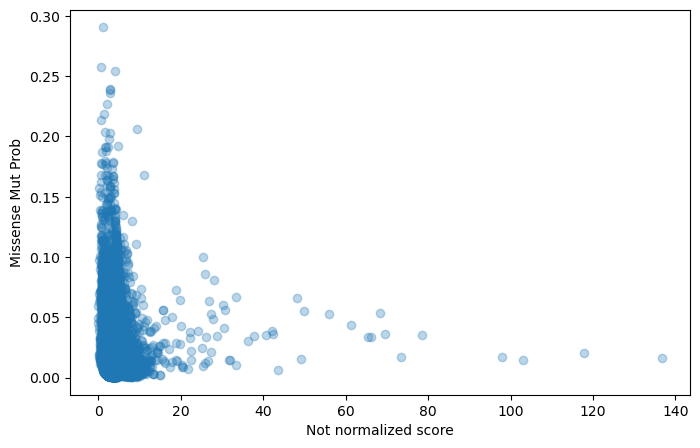

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Score_0"], df_plot["Mis_mut_prob"], alpha=0.3)
plt.xlabel("Not normalized score")
plt.ylabel("Missense Mut Prob")
plt.show()

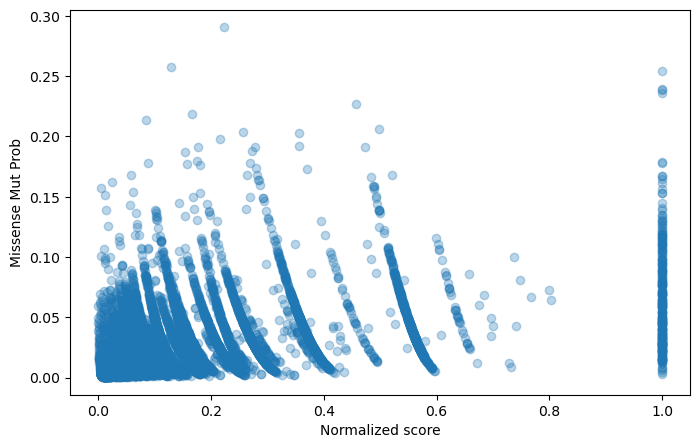

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Score_1"], df_plot["Mis_mut_prob"], alpha=0.3)
plt.xlabel("Normalized score")
plt.ylabel("Missense Mut Prob")
plt.show()

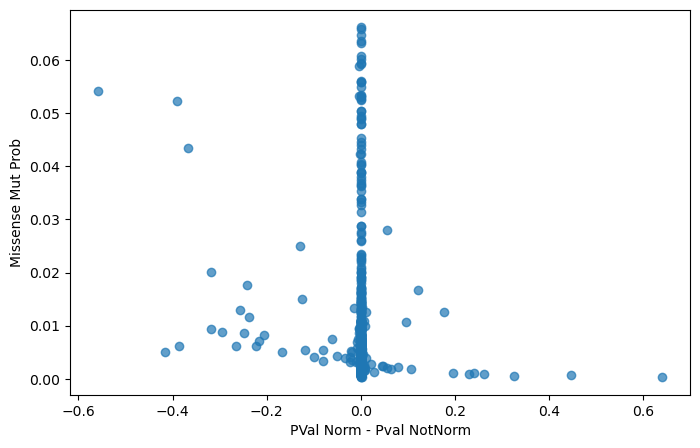

In [ ]:
df_plot = df[df["Mut_in_gene"] > 40].copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Pval_diff"], df_plot["Mis_mut_prob"], alpha=0.7)
plt.xlabel("PVal Norm - Pval NotNorm")
plt.ylabel("Missense Mut Prob")
plt.show()

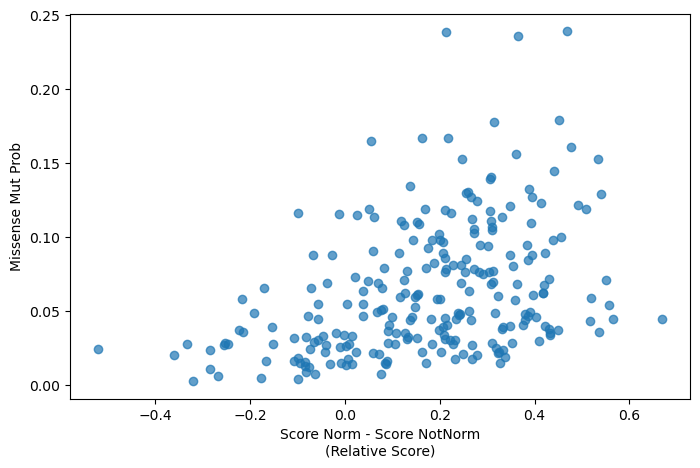

In [ ]:
df_plot = df[df["Mut_in_gene"] == 2].copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Score_diff"], df_plot["Mis_mut_prob"], alpha=0.7)
plt.xlabel("Score Norm - Score NotNorm\n(Relative Score)")
plt.ylabel("Missense Mut Prob")
plt.show()

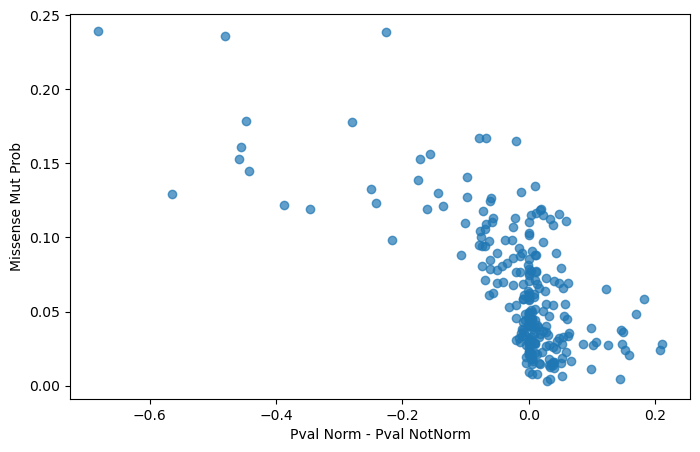

In [ ]:
df_plot = df[df["Mut_in_gene"] == 2].copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Pval_diff"], df_plot["Mis_mut_prob"], alpha=0.7)
plt.xlabel("Pval Norm - Pval NotNorm")
plt.ylabel("Missense Mut Prob")
plt.show()

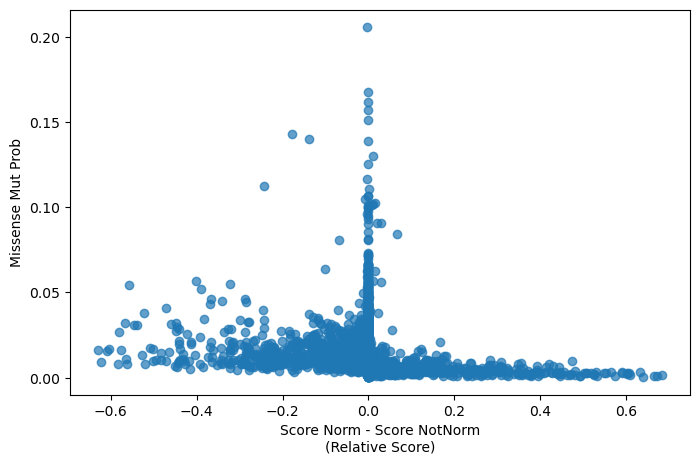

In [ ]:
df_plot = df[df["Mut_in_gene"] > 10].copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Pval_diff"], df_plot["Mis_mut_prob"], alpha=0.7)
plt.xlabel("Score Norm - Score NotNorm\n(Relative Score)")
plt.ylabel("Missense Mut Prob")
plt.show()

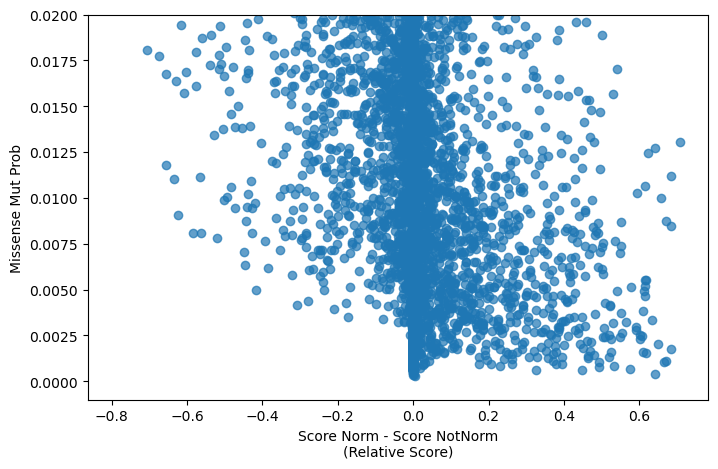

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Pval_diff"], df_plot["Mis_mut_prob"], alpha=0.7)
plt.xlabel("Score Norm - Score NotNorm\n(Relative Score)")
plt.ylabel("Missense Mut Prob")
plt.ylim(-0.001, 0.02)
plt.show()

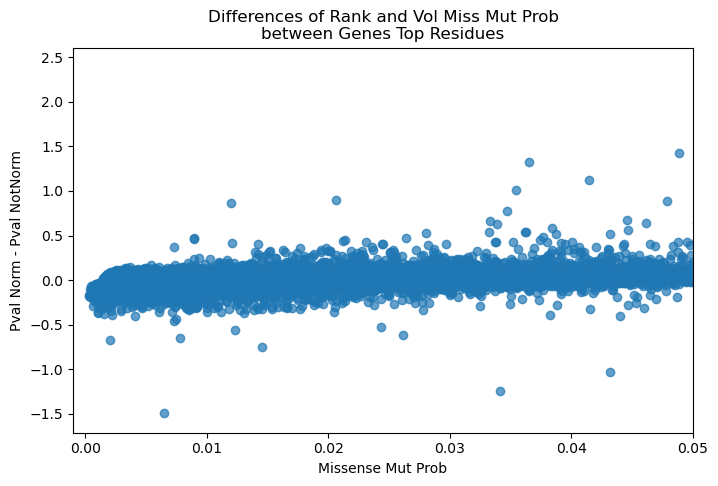

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Mis_mut_prob"], df_plot["Score_diff"], alpha=0.7)
plt.ylabel("Pval Norm - Pval NotNorm")
plt.xlabel("Missense Mut Prob")
plt.xlim(-0.001, 0.05)
plt.title("Differences of Rank and Vol Miss Mut Prob\nbetween Genes Top Residues")
plt.show()

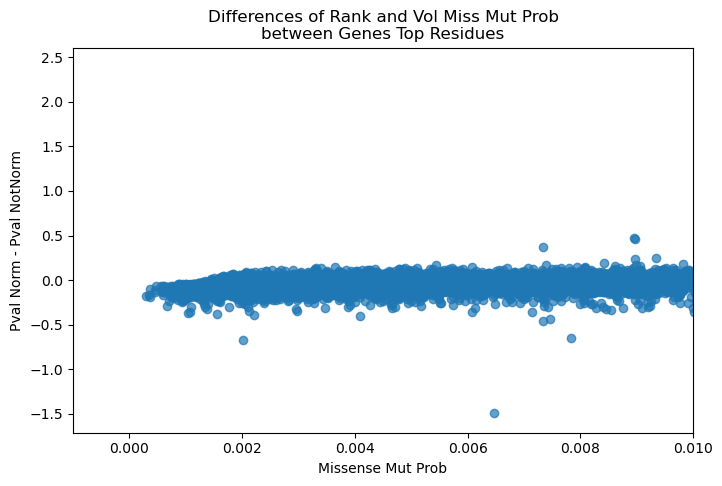

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Mis_mut_prob"], df_plot["Score_diff"], alpha=0.7)
plt.ylabel("Pval Norm - Pval NotNorm")
plt.xlabel("Missense Mut Prob")
plt.xlim(-0.001, 0.01)

plt.title("Differences of Rank and Vol Miss Mut Prob\nbetween Genes Top Residues")
plt.show()

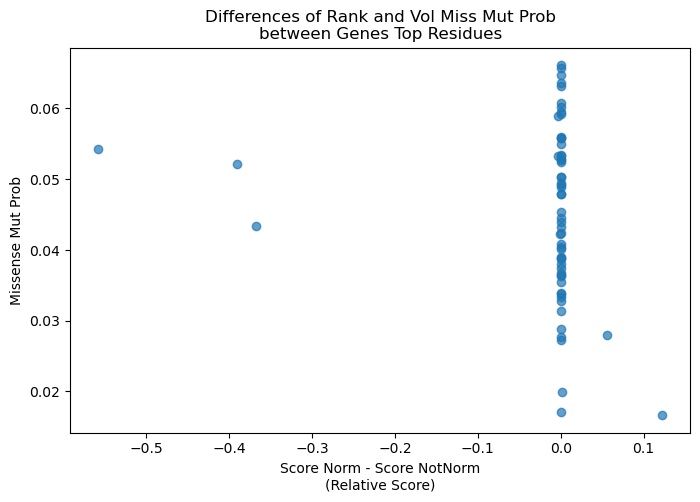

In [ ]:
df_gene = df[df["Gene"] == "TP53"]
df_gene.corr()

df_plot = df_gene.copy()
plt.figure(figsize=(8, 5))
plt.scatter(df_plot["Pval_diff"], df_plot["Mis_mut_prob"], alpha=0.7)
plt.xlabel("Score Norm - Score NotNorm\n(Relative Score)")
plt.ylabel("Missense Mut Prob")
plt.title("Differences of Rank and Vol Miss Mut Prob\nbetween Genes Top Residues")
plt.show()

In [ ]:
cols = ["Rank_1", "Rank_0", "pval_1", "pval_0", "Score_1", "Score_0", "Score_obs_sim_1", "Score_obs_sim_0", "Mis_mut_prob", "Mut_in_vol_1", "Mut_in_gene", "Rank_diff", "Pval_diff", "Score_diff"]
df_corr = df[cols].corr()
df_corr

,Rank_1,Rank_0,pval_1,pval_0,Score_1,Score_0,Score_obs_sim_1,Score_obs_sim_0,Mis_mut_prob,Mut_in_vol_1,Mut_in_gene,Rank_diff,Pval_diff,Score_diff
Rank_1,1.000000,0.999350,0.325597,0.299226,-0.394459,-0.275872,-0.189369,-0.204825,-0.260680,-0.100888,6.771531e-01,1.802167e-02,0.067774,0.022984
Rank_0,0.999350,1.000000,0.325181,0.299263,-0.394232,-0.276198,-0.189071,-0.204859,-0.258065,-0.099511,6.771531e-01,-1.802167e-02,0.066629,0.024839
pval_1,0.325597,0.325181,1.000000,0.922027,-0.754511,-0.584799,-0.631879,-0.594897,-0.295040,-0.446367,1.401877e-01,1.153001e-02,0.200510,-0.394983
pval_0,0.299226,0.299263,0.922027,1.000000,-0.721912,-0.604770,-0.614230,-0.613530,-0.182460,-0.422265,1.191507e-01,-1.013461e-03,-0.194387,-0.196204
Score_1,-0.394459,-0.394232,-0.754511,-0.721912,1.000000,0.362094,0.430861,0.401775,0.493062,0.198267,-3.775734e-01,-6.316112e-03,-0.084901,0.289939
Score_0,-0.275872,-0.276198,-0.584799,-0.604770,0.362094,1.000000,0.934299,0.960228,-0.001794,0.813988,1.076549e-01,9.032499e-03,0.048676,0.154670
Score_obs_sim_1,-0.189369,-0.189071,-0.631879,-0.614230,0.430861,0.934299,1.000000,0.984989,0.131626,0.908235,1.626045e-01,-8.250407e-03,-0.046677,0.393316
Score_obs_sim_0,-0.204825,-0.204859,-0.594897,-0.613530,0.401775,0.960228,0.984989,1.000000,0.063042,0.889956,1.611609e-01,9.249267e-04,0.045260,0.228707
Mis_mut_prob,-0.260680,-0.258065,-0.295040,-0.182460,0.493062,-0.001794,0.131626,0.063042,1.000000,0.168036,-2.993269e-01,-7.254297e-02,-0.285826,0.406633
Mut_in_vol_1,-0.100888,-0.099511,-0.446367,-0.422265,0.198267,0.813988,0.908235,0.889956,0.168036,1.000000,3.562437e-01,-3.820108e-02,-0.062416,0.381966


In [ ]:
df_gene = df[df["Gene"] == "TP53"]
df_corr = df_gene[cols].corr()
df_corr

,Rank_1,Rank_0,pval_1,pval_0,Score_1,Score_0,Score_obs_sim_1,Score_obs_sim_0,Mis_mut_prob,Mut_in_vol_1,Mut_in_gene,Rank_diff,Pval_diff,Score_diff
Rank_1,1.000000,0.998444,0.826040,0.838051,-0.861459,-0.852485,-0.924166,-0.920728,-0.245361,-0.955563,NaN,0.027893,-0.120087,-0.634882
Rank_0,0.998444,1.000000,0.826041,0.838060,-0.860633,-0.853321,-0.924409,-0.920581,-0.225027,-0.951837,NaN,-0.027893,-0.120126,-0.638022
pval_1,0.826040,0.826041,1.000000,0.976240,-0.516619,-0.506292,-0.622943,-0.611150,-0.369606,-0.693098,NaN,-0.000008,0.031285,-0.500196
pval_0,0.838051,0.838060,0.976240,1.000000,-0.535502,-0.525218,-0.642492,-0.631384,-0.328189,-0.702941,NaN,-0.000158,-0.186042,-0.507856
Score_1,-0.861459,-0.860633,-0.516619,-0.535502,1.000000,0.995821,0.965470,0.972507,0.090383,0.955051,NaN,-0.014814,0.127559,0.582215
Score_0,-0.852485,-0.853321,-0.506292,-0.525218,0.995821,1.000000,0.953368,0.966230,0.037645,0.938949,NaN,0.014989,0.126948,0.529840
Score_obs_sim_1,-0.924166,-0.924409,-0.622943,-0.642492,0.965470,0.953368,1.000000,0.995517,0.176729,0.979820,NaN,0.004356,0.138957,0.692798
Score_obs_sim_0,-0.920728,-0.920581,-0.611150,-0.631384,0.972507,0.966230,0.995517,1.000000,0.124042,0.972608,NaN,-0.002650,0.141189,0.621488
Mis_mut_prob,-0.245361,-0.225027,-0.369606,-0.328189,0.090383,0.037645,0.176729,0.124042,1.000000,0.291637,NaN,-0.364500,-0.162097,0.518122
Mut_in_vol_1,-0.955563,-0.951837,-0.693098,-0.702941,0.955051,0.938949,0.979820,0.972608,0.291637,1.000000,NaN,-0.066796,0.099675,0.700313


In [ ]:
df_gene.sort_values("Rank_1").reset_index(drop=True)[cols]

,Rank_1,Rank_0,pval_1,pval_0,Score_1,Score_0,Score_obs_sim_1,Score_obs_sim_0,Mis_mut_prob,Mut_in_vol_1,Mut_in_gene,Rank_diff,Pval_diff,Score_diff
0,0,0,0.0000,0.0000,1.517018e-01,78.559516,11.947984,11.765649,0.035402,51,155,0,0.0000,0.182335
1,1,2,0.0000,0.0000,1.506648e-01,68.422578,13.338605,12.485082,0.053401,55,155,-1,0.0000,0.853522
2,2,1,0.0000,0.0000,1.355608e-01,69.571931,13.009087,11.681004,0.036477,48,155,1,0.0000,1.328083
3,3,5,0.0000,0.0000,1.267943e-01,61.385118,12.996948,13.393938,0.044006,48,155,-2,0.0000,-0.396990
4,4,3,0.0000,0.0000,1.251795e-01,66.011381,13.554702,12.894228,0.033301,45,155,1,0.0000,0.660475
5,5,4,0.0000,0.0000,1.244898e-01,65.328388,14.154236,13.527937,0.033857,45,155,1,0.0000,0.626299
6,6,6,0.0000,0.0000,1.226147e-01,56.043275,14.570084,12.790346,0.052401,49,155,0,0.0000,1.779738
7,7,8,0.0000,0.0000,1.141351e-01,48.050209,14.133929,11.860283,0.066133,50,155,-1,0.0000,2.273646
8,8,7,0.0000,0.0000,1.109642e-01,49.910636,14.277052,11.867599,0.054920,47,155,1,0.0000,2.409452
9,9,10,0.0000,0.0000,8.367545e-02,42.127411,11.168047,11.123057,0.038846,37,155,-1,0.0000,0.044990


## All residues result

In [ ]:
def get_all_o3d_res_result(cohort_df, o3d_output_dir):

    lst_df = []

    for cohort in cohort_df["COHORT"].values:
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        path_csv = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_pos.csv"
        if os.path.exists(path_csv):
            df_o3d = pd.read_csv(path_csv, low_memory=False)
            cols = ["Cohort", "Gene", "Pos", "Mut_in_gene", "Score", "Score_obs_sim", "pval", "Rank"]
            df_o3d = df_o3d[cols].dropna(subset=["pval"]).reset_index(drop=True)
            #df_o3d = df_o3d.reset_index().rename(columns={"index": "Rank"})
            df_o3d.pval = df_o3d.pval.replace(0, 0.00001)
            lst_df.append(df_o3d)
        else:
            print(f"Path doesn't exist: {path_csv}")
            
    df = pd.concat(lst_df).reset_index(drop=True)

    return df


def get_all_o3d_gene_result(cohort_df, o3d_output_dir, maf_input_dir, min_n=False):

    lst_df = []
    n_dict = {}
    for cohort in cohort_df["COHORT"].values:
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        path_csv = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv"
        path_input_mut = f"{maf_input_dir}/{cohort}.in.maf"
        if os.path.exists(path_csv):
            df_o3d = pd.read_csv(path_csv, low_memory=False)
            df_o3d = df_o3d[["Gene", "Uniprot_ID", "Cohort", "pval", "qval", "Score_obs_sim_top_vol", "Mut_in_top_vol", "Mut_in_gene"]].dropna(subset=["pval"]).reset_index(drop=True)
            
            df_o3d.pval = df_o3d.pval.replace(0, 0.00001)
            df_mut = pd.read_table(path_input_mut, low_memory=False)
            df_mut = df_mut[df_mut["Variant_Classification"] == "Missense_Mutation"].reset_index(drop=True)
            df_mut = df_mut[df_mut.Hugo_Symbol.isin(df_o3d.Gene.unique())]
            
            if min_n != False:
                if len(df_o3d) > min_n:
                    lst_df.append(df_o3d)
            else:
                lst_df.append(df_o3d)
                
            n_dict[cohort] = {}
            n_dict[cohort]["genes"] = len(df_o3d)
            n_dict[cohort]["mut"] = len(df_mut)
        else:
            print(f"Path doesn't exist: {path_csv}")
            
    df = pd.concat(lst_df)
    df["n_genes"] = df.Cohort.map(lambda x: n_dict[x]["genes"])
    df["n_mut"] = df.Cohort.map(lambda x: n_dict[x]["mut"])
    df = df.sort_values(["n_genes", "pval"], ascending=[False, True])

    return df.reset_index(drop=True)

In [ ]:
SUBDIR = "review"
datasets = f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/"
input_path = f"{datasets}/input/cancer_202404"
cohort_df = pd.read_csv(f"{input_path}/cohorts.tsv", sep="\t")
cohort_df = cohort_df[~cohort_df.COHORT.str.startswith("ICGC")].reset_index(drop=True)

RUN = "run_control_2025-03-21_11-24-24"
o3d_output_dir = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}"
df_norm = get_all_o3d_res_result(cohort_df, o3d_output_dir)


RUN = "run_notnorm_2025-03-26_10-58-45"
o3d_output_dir = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}"
df_notnorm = get_all_o3d_res_result(cohort_df, o3d_output_dir)

Path doesn't exist: /workspace/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/review/run_control_2025-03-21_11-24-24/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_pos.csv
Path doesn't exist: /workspace/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/review/run_notnorm_2025-03-26_10-58-45/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_pos.csv


In [ ]:
# cols = ["Gene", "index", "pval", "qval", "Score_obs_sim_top_vol", "Mut_in_gene", "Mut_in_top_vol", "Pos_top_vol", "Seq_Length"]
df_norm = df_norm.rename(columns={col:f"{col}_1" for col in df_norm.columns if col not in ["Cohort", "Gene", "Pos"]})
df_notnorm = df_notnorm.rename(columns={col:f"{col}_0" for col in df_notnorm.columns if col not in ["Cohort", "Gene", "Pos"]})
df = df_norm.merge(df_notnorm, on=["Cohort", "Gene", "Pos"], how="outer")
df

,Cohort,Gene,Pos,Mut_in_gene_1,Score_1,Score_obs_sim_1,pval_1,Rank_1,Mut_in_gene_0,Score_0,Score_obs_sim_0,pval_0,Rank_0
0,HARTWIG_WGS_BLCA_2023,AADACL4,125,2,1.0,1.430101,0.1433,1,2,6.28387,1.394335,0.135,1
1,HARTWIG_WGS_BLCA_2023,AADACL4,73,2,1.0,1.337113,0.1851,0,2,6.518757,1.327149,0.1758,0
2,HARTWIG_WGS_BLCA_2023,AASS,280,5,0.278982,0.976166,0.4438,1,5,5.196341,0.909303,0.483,1
3,HARTWIG_WGS_BLCA_2023,AASS,283,5,0.285179,0.933392,0.5203,0,5,5.622089,0.905672,0.5329,0
4,HARTWIG_WGS_BLCA_2023,AASS,663,5,0.124849,0.459892,1.0,2,5,2.62412,0.486967,1.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
616627,TCGA_WXS_PGNG,RET,515,7,0.080308,0.446074,1.0,3,7,2.449131,0.458074,1.0,3
616628,TCGA_WXS_PGNG,SIX4,14,2,1.0,1.852138,0.0268,0,2,9.111088,1.714995,0.009,0
616629,TCGA_WXS_PGNG,SPON1,675,2,1.0,1.791595,0.0387,1,2,8.019134,1.635836,0.0302,1
616630,TCGA_WXS_PGNG,SPON1,674,2,1.0,1.745673,0.0458,0,2,8.148442,1.586689,0.0375,0


In [ ]:
df.drop(columns=["Cohort", "Gene", "Pos"]).astype(float).corr()[["Score_1", "Score_0", "Rank_1", "Rank_0", "pval_1", "pval_0"]]

,Score_1,Score_0,Rank_1,Rank_0,pval_1,pval_0
Mut_in_gene_1,-0.282408,0.033815,0.780348,0.780348,0.149711,0.136201
Score_1,1.000000,0.250585,-0.271987,-0.271871,-0.778607,-0.762859
Score_obs_sim_1,0.299423,0.957147,-0.105267,-0.105071,-0.397722,-0.391994
pval_1,-0.778607,-0.338385,0.227538,0.227386,1.000000,0.950950
Rank_1,-0.271987,-0.129200,1.000000,0.997978,0.227538,0.214974
Mut_in_gene_0,-0.282408,0.033815,0.780348,0.780348,0.149711,0.136201
Score_0,0.250585,1.000000,-0.129200,-0.129528,-0.338385,-0.344631
Score_obs_sim_0,0.268969,0.976504,-0.103229,-0.103357,-0.355941,-0.362545
pval_0,-0.762859,-0.344631,0.214974,0.215011,0.950950,1.000000
Rank_0,-0.271871,-0.129528,0.997978,1.000000,0.227386,0.215011


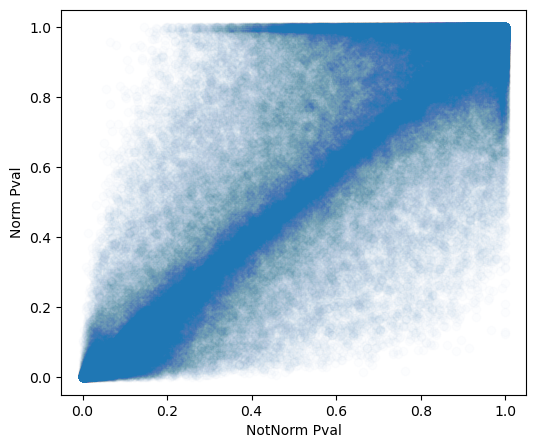

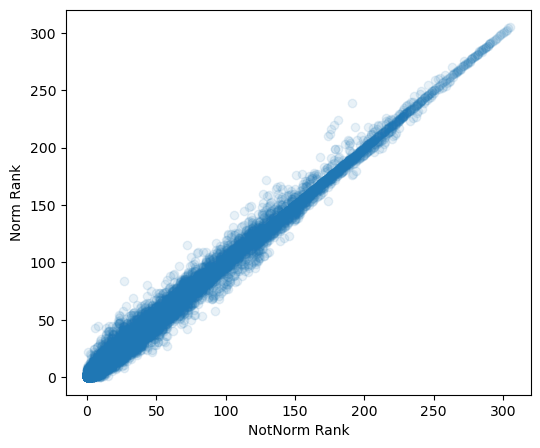

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(6, 5))
plt.scatter(df_plot["pval_1"], df_plot["pval_0"], alpha=0.01)
plt.xlabel("NotNorm Pval")
plt.ylabel("Norm Pval")
plt.show()

df_plot = df.copy()
plt.figure(figsize=(6, 5))
plt.scatter(df_plot["Rank_1"], df_plot["Rank_0"], alpha=0.1)
plt.xlabel("NotNorm Rank")
plt.ylabel("Norm Rank")
plt.show()

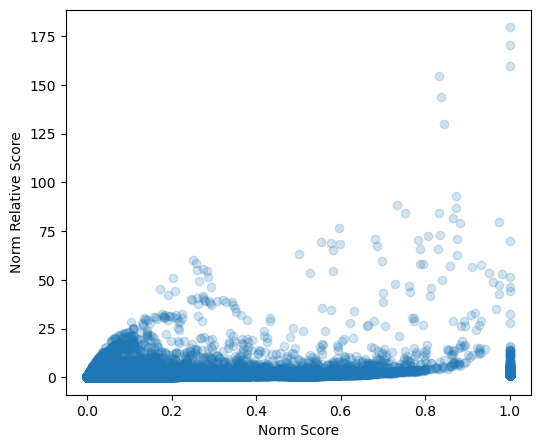

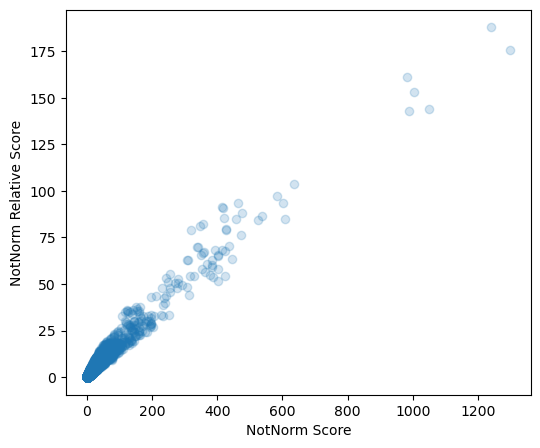

In [ ]:
df_plot = df.copy()
plt.figure(figsize=(6, 5))
plt.scatter(df_plot["Score_1"], df_plot["Score_obs_sim_1"], alpha=0.2)
plt.xlabel("Norm Score")
plt.ylabel("Norm Relative Score")
plt.show()


df_plot = df.copy()
plt.figure(figsize=(6, 5))
plt.scatter(df_plot["Score_0"], df_plot["Score_obs_sim_0"], alpha=0.2)
plt.xlabel("NotNorm Score")
plt.ylabel("NotNorm Relative Score")
plt.show()

In [ ]:
df.sort_values("Score_obs_sim_1", ascending=False)[:60]

,Cohort,Gene,Pos,Mut_in_gene_1,Score_1,Score_obs_sim_1,pval_1,Rank_1,Mut_in_gene_0,Score_0,Score_obs_sim_0,pval_0,Rank_0
568579,TCGA_WXS_WDTC,BRAF,600,287,1.0,179.618281,0.00001,1,287,1240.188552,187.845924,0.00001,1
436263,TCGA_WXS_LGGNOS,IDH1,132,395,1.0,170.296501,0.00001,0,395,989.812649,142.837694,0.00001,0
568580,TCGA_WXS_WDTC,BRAF,601,287,1.0,159.730994,0.00001,0,287,1298.036156,175.426388,0.00001,0
300683,TCGA_WXS_MEL,BRAF,600,269,0.833223,154.37433,0.00001,2,269,981.795936,161.396484,0.00001,2
300684,TCGA_WXS_MEL,BRAF,601,269,0.83739,143.941887,0.00001,1,269,1050.057239,143.701326,0.00001,0
300685,TCGA_WXS_MEL,BRAF,597,269,0.845096,130.079162,0.00001,0,269,1005.375908,153.155074,0.00001,1
77380,HARTWIG_WGS_SKCM_2023,BRAF,600,152,0.871862,92.770037,0.00001,2,152,582.411179,97.388678,0.00001,2
27459,HARTWIG_WGS_COADREAD_2023,KRAS,14,238,0.733995,88.347831,0.00001,3,238,355.775388,82.400831,0.00001,4
77381,HARTWIG_WGS_SKCM_2023,BRAF,601,152,0.873916,86.712898,0.00001,1,152,606.452324,85.06353,0.00001,0
27460,HARTWIG_WGS_COADREAD_2023,KRAS,60,238,0.831414,84.483115,0.00001,1,238,538.694629,86.496288,0.00001,0


### Notes
* We only compute p-values for genes with at least 2 mutations in the volume of any residue
* The pvalues of cohorts with 1000+ processed genes (N) seem to be well calibrated 
* There isn't an apparent correlation between sample size (number of processed genes and mutations) and deviation from neutrality

# Look at examples

In [ ]:
from itertools import product

import daiquiri
import numpy as np
import json
from tqdm import tqdm


def get_unif_gene_miss_prob(size):
    """
    Get a uniformly distributed gene missense mutation 
    probability vector.
    """
    
    vector = np.ones(size)
    vector[0] = 0
    
    return vector / sum(vector)


def mut_rate_vec_to_dict(mut_rate):
    """
    Convert the vector of mut mut_rate of 96 channels to a dictionary of 192 
    items: the keys are mutations in trinucleotide context (e.g., "ACA>A") 
    and values are the corresponding mut rate (frequency of mut normalized 
    for the nucleotide content).
    """
    
    cb  = dict(zip('ACGT', 'TGCA'))
    mut_rate_dict = {}
    i = 0
    for ref in ['C', 'T']:
        for alt in cb.keys():
            if ref == alt:
                continue
            else:
                for p in product(cb.keys(), repeat=2):
                    mut = f"{p[0]}{ref}{p[1]}>{alt}"
                    cmut = f"{cb[p[1]]}{cb[ref]}{cb[p[0]]}>{cb[alt]}"
                    mut_rate_dict[mut] = mut_rate[i]
                    mut_rate_dict[cmut] = mut_rate[i]
                    i +=1
                    
    return mut_rate_dict


def get_codons(dna_seq):
    """
    Get the list of codons from a DNA sequence.
    """
    
    return [dna_seq[i:i+3] for i in [n*3 for n in range(int(len(dna_seq) / 3))]]


def translate_dna_to_prot(dna_seq, gencode):
    """
    Translate a DNA sequence into amino acid sequence.
    """
    
    return "".join([gencode[codon] for codon in get_codons(dna_seq)])


def codons_trinucleotide_context(lst_contexts):
    
    return list(zip(lst_contexts[::3], lst_contexts[1::3], lst_contexts[2::3]))


# TODO: doc function

def get_miss_mut_prob(dna_seq, 
                      dna_tricontext, 
                      mut_rate_dict, 
                      mutability=False, 
                      get_probability=True, 
                      mut_start_codon=False):
    """
    Generate a list including the probabilities that the 
    codons can mutate resulting into a missense mutations.
    
    Arguments
    ---------
    dna_seq: str
        Sequence of DNA
    mut_rate_dict: dict
        Mutation rate probability as values and the 96 possible
        trinucleotide contexts as keys
    gencode: dict
        Nucleotide as values and codons as keys
        
    Returns
    -------
    missense_prob_vec: list
        List of probabilities (one for each codon or prot res) 
        of a missense mutation  
    """

    # Initialize
    gencode = {
        'ATA':'I', 'ATC':'I', 'ATT':'I', 'ATG':'M',
        'ACA':'T', 'ACC':'T', 'ACG':'T', 'ACT':'T',
        'AAC':'N', 'AAT':'N', 'AAA':'K', 'AAG':'K',
        'AGC':'S', 'AGT':'S', 'AGA':'R', 'AGG':'R',
        'CTA':'L', 'CTC':'L', 'CTG':'L', 'CTT':'L',
        'CCA':'P', 'CCC':'P', 'CCG':'P', 'CCT':'P',
        'CAC':'H', 'CAT':'H', 'CAA':'Q', 'CAG':'Q',
        'CGA':'R', 'CGC':'R', 'CGG':'R', 'CGT':'R',
        'GTA':'V', 'GTC':'V', 'GTG':'V', 'GTT':'V',
        'GCA':'A', 'GCC':'A', 'GCG':'A', 'GCT':'A',
        'GAC':'D', 'GAT':'D', 'GAA':'E', 'GAG':'E',
        'GGA':'G', 'GGC':'G', 'GGG':'G', 'GGT':'G',
        'TCA':'S', 'TCC':'S', 'TCG':'S', 'TCT':'S',
        'TTC':'F', 'TTT':'F', 'TTA':'L', 'TTG':'L',
        'TAC':'Y', 'TAT':'Y', 'TAA':'_', 'TAG':'_',
        'TGC':'C', 'TGT':'C', 'TGA':'_', 'TGG':'W'}

    # Get all codons of the seq
    #logger.debug("Getting codons of seq..")
    codons = get_codons(dna_seq)
    missense_prob_vec = []
    
    # Get the trinucleotide context as list of tuples of 3 elements corresponding to each codon   
    #logger.debug("Getting tri context seq..")                               
    tricontext = codons_trinucleotide_context(dna_tricontext.split(","))
    
    # Iterate through codons and get prob of missense based on context
    for c in range(len(codons)):
        missense_prob = 0
        codon = codons[c]
        aa = gencode[codon]         
        trinucl0, trinucl1, trinucl2  = tricontext[c]

        # Iterate through the possible contexts of a missense mut
        for i, trinucl in enumerate([trinucl0, trinucl1, trinucl2]):
            ref = trinucl[1]
            aa = gencode[codon]

            # Iterate through the possible alt 
            for alt in "ACGT":
                if alt != ref:         
                    alt_codon = [n for n in codon]
                    alt_codon[i] = alt
                    alt_codon = "".join(alt_codon)
                    alt_aa = gencode[alt_codon]  
                    # If there is a missense mut, get prob from context and sum it
                    if alt_aa != aa and alt_aa != "_":
                        if not mutability:
                            mut = f"{trinucl}>{alt}"    # query using only the trinucleotide change
                            mut_prob = mut_rate_dict[mut] if mut in mut_rate_dict else 0                                                                 
                            missense_prob += mut_prob

                        else:
                            # TODO this has not been tested
                            cdna_pos = (c * 3) + i  # compute the cDNA position of the residue
                            if cdna_pos in mut_rate_dict:
                                missense_prob += mut_rate_dict[cdna_pos].get(alt, 0)
                            else:
                                missense_prob += 0

        missense_prob_vec.append(missense_prob)

    # Assign 0 prob to the first residue
    if mut_start_codon == False:
        missense_prob_vec[0] = 0
        
    # Convert into probabilities
    if get_probability:
        missense_prob_vec = np.array(missense_prob_vec) / sum(missense_prob_vec)
    
    return list(missense_prob_vec)


def get_miss_mut_prob_dict(mut_rate_dict, seq_df, mutability=False, mutability_config=None):
    """
    Given a dictionary of mut rate in 96 contexts (mut profile) and a 
    dataframe including Uniprot ID, HUGO symbol and DNA sequences, 
    get a dictionary with UniprotID-Fragment as keys and corresponding 
    vectors of missense mutation probabilities as values.
    """

    miss_prob_dict = {}

    if mutability:
        # TODO if the execution time of this step is too long we could
        # parallelize all these loops so that each gene is done in parallel

        # Process any Protein/fragment in the sequence df
        for _, row in seq_df.iterrows():
            # Mutabilities
            mutability_dict = Mutabilities(row.Uniprot_ID, row.Chr, row.Exons_coord, len(row.Seq_dna), row.Reverse_strand, mutability_config).mutabilities_by_pos
            miss_prob_dict[f"{row.Uniprot_ID}-F{row.F}"] = get_miss_mut_prob(row.Seq_dna, row.Tri_context, mutability_dict, mutability=True)

    else:
        # Process any Protein/fragment in the sequence df
        for _, row in seq_df.iterrows():
            miss_prob_dict[f"{row.Uniprot_ID}-F{row.F}"] = get_miss_mut_prob(row.Seq_dna, row.Tri_context, mut_rate_dict)
    
    return miss_prob_dict


def get_cmap(cmap_path, uniprot_id, af_f, cmap_prob_thr=0.5):
    
    cmap_complete_path = f"{cmap_path}/{uniprot_id}-F{af_f}.npy"
    cmap = np.load(cmap_complete_path) 
    cmap = cmap > cmap_prob_thr
    cmap = cmap.astype(int)
    
    return cmap


def get_vol_miss_prob(gene, cmap_path, miss_prob_dict, seq_df):
    
    seq_df_gene = seq_df[seq_df["Gene"] == gene]
    uniprot_id = seq_df_gene['Uniprot_ID'].values[0]
    af_f = seq_df_gene['F'].values[0]
    
    cmap = get_cmap(cmap_path, uniprot_id, af_f)
    gene_miss_prob = np.array(miss_prob_dict[f"{uniprot_id}-F{af_f}"])
    vol_missense_mut_prob = np.dot(cmap, gene_miss_prob)
    
    return vol_missense_mut_prob, gene_miss_prob

In [ ]:
def get_all_o3d_res_result(cohort_df, o3d_output_dir):

    lst_df = []

    for cohort in cohort_df["COHORT"].values:
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        path_csv = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_pos.csv"
        if os.path.exists(path_csv):
            df_o3d = pd.read_csv(path_csv, low_memory=False)
            cols = ["Cohort", "Gene", "Pos", "Mut_in_gene", "Mut_in_vol", "Score", "Score_obs_sim", "Rank", "pval", 'C', 'C_ext']
            df_o3d = df_o3d[cols].dropna(subset=["pval"]).reset_index(drop=True)
            df_o3d.pval = df_o3d.pval.replace(0, 0.00001)
            lst_df.append(df_o3d)
        # else:
        #     print(f"Path doesn't exist: {path_csv}")
            
    df = pd.concat(lst_df).reset_index(drop=True)

    return df


def get_all_o3d_gene_result(cohort_df, o3d_output_dir):

    lst_df = []
    for cohort in cohort_df["COHORT"].values:
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        path_csv = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv"
        if os.path.exists(path_csv):
            df_o3d = pd.read_csv(path_csv, low_memory=False)
            df_o3d = df_o3d[["Gene", "Uniprot_ID", "Cohort", "pval", "qval", "Score_obs_sim_top_vol", "Mut_in_top_vol", "Mut_in_gene", 'C_gene', 'C_pos']].dropna(subset=["pval"]).reset_index(drop=True)
            df_o3d.pval = df_o3d.pval.replace(0, 0.00001)
            lst_df.append(df_o3d)
        # else:
        #     print(f"Path doesn't exist: {path_csv}")
            
    df = pd.concat(lst_df)

    return df.reset_index(drop=True)


In [ ]:
SUBDIR = "review"
datasets = f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/"
output_path = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}"
input_path = f"{datasets}/input/cancer_202404"
cohort_df = pd.read_csv(f"{input_path}/cohorts.tsv", sep="\t")
cohort_df = cohort_df[~cohort_df.COHORT.str.startswith("ICGC")].reset_index(drop=True)

o3d_path = f"{output_path}/run_control_2025-03-21_11-24-24"
o3d_path_notnorm = f"{output_path}/run_notnorm_2025-03-26_10-58-45"
gene_result = get_all_o3d_gene_result(cohort_df, o3d_path)
res_result = get_all_o3d_res_result(cohort_df, o3d_path)
gene_result_notnorm = get_all_o3d_gene_result(cohort_df, o3d_path_notnorm)
res_result_notnorm = get_all_o3d_res_result(cohort_df, o3d_path_notnorm)

In [ ]:
gene_result[gene_result["Gene"] == "TP53"].sort_values("Mut_in_gene", ascending=False)[40:50]

,Gene,Uniprot_ID,Cohort,pval,qval,Score_obs_sim_top_vol,Mut_in_top_vol,Mut_in_gene,C_gene,C_pos
15398,TP53,K7PPA8,CPTAC_WXS_LUAD_2020,0.00001,0.0,3.727186,12.0,45,1.0,[248 242 249 241 245 246 173 244 193 236 179 2...
13459,TP53,K7PPA8,CBIOP_WXS_CSCC_UCSF_2018,0.00001,0.0,5.575197,19.0,42,1.0,[245 194 176 179 238 237 248 177 273 173 278 214]
66086,TP53,K7PPA8,TCGA_WXS_UCS,0.00001,0.0,8.469888,22.0,42,1.0,[241 245 242 239 248 238 249 273 243 175 193 1...
70789,TP53,K7PPA8,TCGA_WXS_PRAD,0.00001,0.0,5.109531,20.0,41,1.0,[239 245 175 248 249 273 176 135 177 237 282 2...
28253,TP53,K7PPA8,OTHER_WGS_MM_NATLEUK2018,0.00001,0.0,2.833644,9.0,41,1.0,[270 135 127 133 282 246 161 193 126 131 134 1...
47985,TP53,K7PPA8,PEDCBIOP_WXS_HGG_PRY,0.00001,0.0,7.354266,21.0,40,1.0,[248 241 249 273 245 176 272 135 175 173 179 2...
20639,TP53,K7PPA8,CBIOP_WXS_BCC_UNIGE_2016_UNTREAT,0.02200,1.0,1.566772,7.0,39,0.0,NaN
20447,TP53,K7PPA8,HARTWIG_WGS_READ_2023,0.00001,0.0,7.276681,20.0,35,1.0,[242 245 241 273 248 250 238 175 176 179 173 2...
30401,TP53,K7PPA8,OTHER_WGS_BRCA_SCANB_TNBC_2019,0.00001,0.0,4.031131,14.0,34,1.0,[134 135 194 239 274 236 176 278 125 280 193 1...
37560,TP53,K7PPA8,TCGA_WXS_MEL,0.00001,0.0,2.623695,10.0,34,1.0,[275 278 134 280 120 241 141]


In [ ]:
fishy_lst = "4C1P,LOC100130148,ANKRD30BL,OR14A16,KRT37,DEFB106A,GLYCAM1,POTEC,NEUROD2,OR2C3,SUPT20HL1,LOC148145,OR10H3,SNORD114-30,SSX4,SNORD29,ASIC5,SPAG11B,LOC650293,CIDEA,OPRPN,LOC144742,ITIH6,OR4D5,GPR148,SNORD2,LOC360030,FFAR1,SNORD114-31,CRNN,MAS1L,RGR,SCARNA1,SLC7A14,FAM170B,NEUROD1,OR51C1P,KRTAP21-1,OR2H2,SNORD43,AMBN,FAM138E,OR2A25,PRR20B,CRH,RGS21,PGA4,SPANXA2,CYLC2,DEFB107A,GPX6,SCARNA3,SFTPA1,OR7E97P,CELA2A,LINC00161,OR2A4,KRT38,OR7E14P,KRTAP6-2,C10orf113,SNORA25,SCARNA21,KRT76,DCAF4L2,SLC18A3,RNU6ATAC,GNAT1,LCN6,LOC440563,OR13J1,IL3,BMP10,SNORA38B,GML,OR14C36,ZNF705A,ALG1L2,CT47A10,OR6C5P,OR10U1P,OR5F2P,ANKRD26P1,OR5W2,GALR3,LLCFC1,ZFP42,LOC730811,OR51A7,OR10T1P,FLJ40434,CLEC4C,DSCR4,LINC00200,OR13D1,OR5AK2,PRSS38,SNORD116-24,OR10AD1,OR52R1,OR5D13,UBQLN3,OR2G6,PPP1R2C,OR5D3P,HNRNPCL1,ADIPOQ,OR5BK1P,LIPI,SBF1P1,SNORA55,OR5AP1P,P2RX6P,C9orf57,OR1C1,DAZ1,SNORD115-1,SNORD116-5,SNORD1A,H2AP,MYH2,HMX1,OR13G1,VCX,CSRP3,C17orf98,LOC100169752,ADAM29,KRTAP3-3,OR4Q2P,PWRN2,LOC642597,OR7E155P,OR1X5P,KRTAP12-3,ACSM6,UTF1,LOC285780,LINC00575,SNORD116-26,SNORD32B,SNORD46,OR5AU1,OR3D1P,MRGPRX4,OR3A3,SNORD115-20,GABRG2,LOC440040,CST11,RPL10L,OR8B7P,NMUR2,RPL29P2,OR4K17,SNORA19,DHX40P1,OR4K15,FGF20,LCE3A,SNORD31,DMRTC2,OR6C68,TEX33,TTTY20,OR9A3P,GADL1,SLC38A8,RPL13AP17,ANKRD30BP2,LOC100128811,URAD,TRIML2,ODF3,OR4F2P,GK2,C11orf94,OR2S1P,OR6C69P,OR7E136P,LCE3C,MT4,C12orf40,KRTAP12-4,OR3A2,COX8C,DKK4,LGALS13,SNORD11,KRTAP10-12,SPACA1,FOXB2,ELF5,OR10A6,TRIM60,MS4A13,GPR61,CNTN6,SCARNA11,MYCNOS,OR7E116P,CFAP97D1,CCDC144NL,PATE4,SOHLH1,BARHL1,KIR3DP1,OR6K6,PYY,OR7E145P,MAGEE2,PRM1,GP9,DCAF12L2,RBMY2FP,LOC441601,SCARNA18,MYL10,OR4G3P,FOXD4L3,LYZL4,TTTY1B,DEFA5,EPPIN-WFDC6,CDX4,NKX1-2,FSHB,KLK8,SNORD4A,TRHR,OR52J1P,LINC01565,KCNG4,OR1A2,REG1CP,XKR3,OR9M1P,LPPR5,OR2AL1P,LOC732275,CFAP47,DSCR10,OR5R1,NKX2-2,LOC100189589,GATA1,ASB17,SPANXB2,LOC283856,C6orf118,SNORD93,OR5AH1P,OR2S2,LOC284788,CDY2B,OR2AJ1,OR51A1P,VCY,RTP1,OR8K2P,ACTL6B,CT47A6,TEX43,SLC39A12,CMA1,OTOP1,OR10W1,SLC32A1,C2orf83,FLJ43950,TTTY12,OR8J3,OR52I1,SNORA22,SAA3P,TECTB,PLCZ1,HBM,OR4K7P,C1orf87,ZNF479,ZNF705D,SNORD49B,SNORD113-5,CT83,PLA2G2E,CCL27,TSPY2,PCA3,OR10T2,SPATA3,TMPRSS11A,OR1H1P,SNORA18,RYR2,GSTA3,OR11P1P,KRTAP12-2,ST7-AS2,OR10A7,MAGEA12,C12orf50,SNORA66,OR9G2P,OR52J3,CLRN1-AS1,OR4D9,ERC2-IT1,OR10C1,LINC02694,OR11L1,PLAC1,SPATA22,OR52L1,DEFB131A,OR4K5,LINC01548,SNORD45B,BPIFC,PRL,SNORA49,OR8L1P,BRS3,SNORD53,TKTL2,CDH7,GPR119,KRTAP10-6,OR4D6,H1-9P,PART1,SNORA36A,OR8U8,OR6C71P,MROH2B,RFPL4B,DEFB116,IL13,FRMD7,GYPB,OR8I4P,SSTR4,OR9N1P,PRAMEF3,NTMT2,NKX2-6,OR1M4P,CSAG2,FAM215A,PRG3,MAGEC2,ABCC12,OR5M8,OR5H6,SLC35G6,BRD7P3,OR7E109P,MAGEA1,HTN3,SPANXN1,SNORD65,OR11N1P,UCMA,OR7E11P,OR7E157P,SNORD87,H3-4,OR7E163P,LOC100271832,SSX3,NLRP5,ANKRD34C,NHEG1,SLC22A24,CATSPERD,CD300LD-AS1,PTH2,GAGE13,OR9P1P,OR6C2".split(",")

In [ ]:
gene_result[gene_result["Gene"].isin(fishy_lst)].sort_values("pval")[:10]

,Gene,Uniprot_ID,Cohort,pval,qval,Score_obs_sim_top_vol,Mut_in_top_vol,Mut_in_gene,C_gene,C_pos
31777,POTEC,B2RU33,OTHER_WXS_AML_PRY_BEAT_2018,0.00001,0.000000,3.327721,5.0,5,1.0,[477]
32115,SUPT20HL1,A0A7I2YQ69,OTHER_WGS_PRAD_CPGEA_2021,0.00001,0.000000,3.510303,4.0,4,1.0,[526]
20518,OR14C36,Q8NHC7,CBIOP_WXS_BCC_UNIGE_2016_UNTREAT,0.00030,0.347538,2.444905,7.0,11,0.0,[ 39 281 38]
37586,CFAP47,Q6ZTR5,TCGA_WXS_MEL,0.00050,0.162368,1.999458,7.0,47,0.0,[ 921 1431 134 898 865 1688 925 870 113 ...
66146,OR10T2,A0A126GV74,TCGA_WXS_UCEC,0.00060,0.284673,2.536839,4.0,4,0.0,[258 261]
68982,OR5D13,Q8NGL4,TCGA_WXS_STAD,0.00180,1.000000,2.156660,6.0,11,0.0,[73 70 45 68]
37622,C12orf40,Q86WS4,TCGA_WXS_MEL,0.00220,0.420713,1.916675,5.0,29,0.0,[522 524]
52440,CNTN6,A1LMA8,TCGA_WXS_HCC,0.00230,1.000000,2.042668,4.0,7,0.0,[426]
886,OR10A6,A0A126GVN8,CBIOP_WXS_CM_VALLEN_2018,0.00230,1.000000,2.307734,4.0,4,0.0,[167]
37690,OPRPN,Q99935,TCGA_WXS_MEL,0.00600,0.657745,1.876549,7.0,23,0.0,[128 125 131]


In [ ]:
gene_result_notnorm[gene_result_notnorm["Gene"].isin(fishy_lst)].sort_values("pval")[:10]

,Gene,Uniprot_ID,Cohort,pval,qval,Score_obs_sim_top_vol,Mut_in_top_vol,Mut_in_gene,C_gene,C_pos
28244,PTH2,Q96A98,OTHER_WGS_MM_NATLEUK2018,0.00001,0.000000,3.711543,4.0,4,1.0,[23 22]
31776,POTEC,B2RU33,OTHER_WXS_AML_PRY_BEAT_2018,0.00001,0.000000,3.201449,5.0,5,1.0,[477]
32116,SUPT20HL1,A0A7I2YQ69,OTHER_WGS_PRAD_CPGEA_2021,0.00001,0.000000,3.738289,4.0,4,1.0,[526]
5176,CNTN6,A1LMA8,CBIOP_WXS_ANGS_TREATED_2020,0.00010,0.062950,2.185256,2.0,2,0.0,[13]
884,OR10A6,A0A126GVN8,CBIOP_WXS_CM_VALLEN_2018,0.00050,0.392906,2.426313,4.0,4,0.0,[167]
13463,OR51A7,Q8NH64,CBIOP_WXS_CSCC_UCSF_2018,0.00070,1.000000,2.222355,4.0,7,0.0,[234 230 232]
66147,OR10T2,A0A126GV74,TCGA_WXS_UCEC,0.00070,0.322350,2.292823,4.0,4,0.0,[258 261]
20545,OR14C36,Q8NHC7,CBIOP_WXS_BCC_UNIGE_2016_UNTREAT,0.00200,0.734634,1.980924,7.0,11,0.0,[ 39 38 281]
20547,TRIML2,A0A804HJA0,CBIOP_WXS_BCC_UNIGE_2016_UNTREAT,0.00210,0.737633,1.906180,4.0,8,0.0,[415]
37637,C12orf40,Q86WS4,TCGA_WXS_MEL,0.00210,0.337786,1.900874,5.0,29,0.0,[522 524]


In [ ]:
gene_result[gene_result["Gene"] == "PTH2"]

,Gene,Uniprot_ID,Cohort,pval,qval,Score_obs_sim_top_vol,Mut_in_top_vol,Mut_in_gene,C_gene,C_pos
28300,PTH2,Q96A98,OTHER_WGS_MM_NATLEUK2018,0.0078,1.0,2.292782,4.0,4,0.0,[23 22]


#### Look at one gene

In [ ]:
def get_cgc_action(gene_action):

    if pd.isnull(gene_action):
        return "Ambiguous"
        
    gene_action = [action.strip() for action in gene_action.split(",")]

    if len(gene_action) == 1:
        if gene_action[0] == "oncogene":
            action = "Oncogene"
        elif gene_action[0] == "TSG":
            action = "Tumour suppressor"
        else:
            action = "Ambiguous"
        
    else:
        if "oncogene" in gene_action and "TSG" in gene_action:
            action = "Ambiguous"
        elif "oncogene" in gene_action:
            action = "Oncogene"
        elif "TSG" in gene_action:
            action = "Tumour suppressor"
        else:
            action = "Ambiguous"
    
    return action

cgc_df = pd.read_csv(f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/input/cancer_202404/CGC_list_v99.tsv", sep = "\t")
cgc_df = cgc_df[["Gene Symbol", "Role in Cancer"]].rename(columns={
    "Gene Symbol" : "Gene", 
    "Role in Cancer" : "Gene_action"})
cgc_df.Gene_action = cgc_df.Gene_action.apply(lambda x: get_cgc_action(x))
cgc_df = cgc_df.assign(Gene=cgc_df['Gene'].str.split(','))
cgc_df = cgc_df.explode('Gene')
cgc_df['Gene'] = cgc_df['Gene'].str.strip()
cgc_df

,Gene,Gene_action
0,A1CF,Oncogene
1,ABI1,Tumour suppressor
2,ABL1,Oncogene
3,ABL2,Oncogene
4,ACKR3,Oncogene
...,...,...
738,ZNF429,Ambiguous
739,ZNF479,Ambiguous
740,ZNF521,Oncogene
741,ZNRF3,Tumour suppressor


In [ ]:
def get_fishy_genes(cohort_df, cohort, fishy_df):
    
    ctype = cohort_df[cohort_df["COHORT"] == cohort].CANCER_TYPE.values[0]
    if ctype:
        if ctype in fishy_df["Cancer_Type"].values:
            fishy = fishy_df[fishy_df["Cancer_Type"] == ctype].Fish.values[0].split(",")
            fishy = pd.concat((cohort_df["Gene"].isin(fishy), 
                                ~cohort_df["Gene"].isin(cgc_genes)), axis=1).all(1).astype(int)
        else:
            fishy = 0
    return fishy

fishy_df = pd.read_csv(f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/input/cancer_202404/negative_gene_set.tsv", sep = '\t', header = None)
fishy_df = fishy_df.rename(columns={0 : "Cancer_Type", 1 : "Fish"})

fishy_lst = get_fishy_genes(cohort_df, cohort, fishy_df)
fishy_lst

0

In [ ]:
cohort = "OTHER_WGS_MM_NATLEUK2018"
gene = "PTH2"

o3d_annot_dir = f"{WORKSPACE}/nobackup/scratch/oncodrive3d/annotations_mane_240506"
pdb_tool_df = pd.read_csv(os.path.join(o3d_annot_dir, "pdb_tool_df.tsv"), sep="\t")
o3d_datasets_dir = f"{WORKSPACE}/nobackup/scratch/oncodrive3d/datasets_mane_240506"
seq_df = pd.read_csv(os.path.join(o3d_datasets_dir, "seq_for_mut_prob.tsv"), sep="\t")
cmap_path = f"{WORKSPACE}/nobackup/scratch/oncodrive3d/datasets_mane_240506/prob_cmaps"


def lookup_one_gene(gene, cohort, res_result, cmap_path):

    cols = ['Pos', 'Mut_in_gene', 'Mut_in_vol', 'Score', 'Rank', 'pval']
    res_result_gene = res_result[(res_result["Gene"] == gene) & (res_result["Cohort"] == cohort)][cols].reset_index(drop=True)
    res_result_notnorm_gene = res_result_notnorm[(res_result_notnorm["Gene"] == gene) & (res_result_notnorm["Cohort"] == cohort)][cols]
    res_result_notnorm_gene = res_result_notnorm_gene.rename(
        columns={col : f"{col}_notnorm" for col in ["Score", "Score_obs_sim", "Rank", "pval"]}).reset_index(drop=True)
    res_result_gene = res_result_gene.merge(res_result_notnorm_gene, on=["Pos", "Mut_in_gene", "Mut_in_vol"], how="inner")
    
    mut_profile_path = f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/input/cancer_202404/mut_profile/{cohort}.sig.json"
    mut_profile = json.load(open(mut_profile_path, encoding="utf-8"))
    miss_prob_dict = get_miss_mut_prob_dict(mut_rate_dict=mut_profile, seq_df=seq_df)
    
    f, uni_id = seq_df[seq_df["Gene"] == gene][["F", "Uniprot_ID"]].values[0]
    cmap = get_cmap(cmap_path, uni_id, f)
    vol_missense_mut_prob, gene_miss_prob = get_vol_miss_prob(gene, cmap_path, miss_prob_dict, seq_df)
    contacts = np.dot(cmap, np.repeat(1, len(gene_miss_prob)))
    
    df_prob = pd.DataFrame(
        {"Prob_mut_vol": vol_missense_mut_prob, "Contacts": contacts}
        ).reset_index().rename(columns={"index": "Pos"})
    df_prob["Pos"] += 1
    df_prob["pACC"] = pdb_tool_df[pdb_tool_df["Uniprot_ID"] == uni_id].pACC.values
    
    res_result_gene = res_result_gene.merge(df_prob, on="Pos", how="inner")
    res_result_gene["Score_scaled"] = res_result_gene["Score"] / res_result_gene["Score"].sum()
    res_result_gene["Score_notnorm_scaled"] = res_result_gene["Score_notnorm"] / res_result_gene["Score_notnorm"].sum()
    
    return res_result_gene

/tmp/jobs/spellegrini/10530889/ipykernel_1631372/1093947586.py:5: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  pdb_tool_df = pd.read_csv(os.path.join(o3d_annot_dir, "pdb_tool_df.tsv"), sep="\t")


In [ ]:
res_result_gene = lookup_one_gene(gene, cohort, res_result, cmap_path)
res_result_gene

,Pos,Mut_in_gene,Mut_in_vol,Score,Rank,pval,Score_notnorm,Rank_notnorm,pval_notnorm,Prob_mut_vol,Contacts,pACC,Score_scaled,Score_notnorm_scaled
0,23,4,4,1.0,1,0.0078,14.524922,1,0.00001,0.026484,9,70.0,0.5,0.49909
1,22,4,4,1.0,0,0.0097,14.577867,0,0.00001,0.026135,9,52.0,0.5,0.50091


### Look at all cases

In [ ]:
print("Significant gene p-values:")
print("Norm", len(gene_result[gene_result["pval"] < 0.01]))
print("Not norm", len(gene_result_notnorm[gene_result_notnorm["pval"] < 0.01]))

print("\nSignificant gene q-values:")
print("Norm", len(gene_result[gene_result["qval"] < 0.01]))
print("Not norm", len(gene_result_notnorm[gene_result_notnorm["qval"] < 0.01]))

print("\nSignificant clusters p-values:")
print("Norm", len(res_result[res_result["pval"] < 0.01]))
print("Not norm", len(res_result_notnorm[res_result_notnorm["pval"] < 0.01]))

Significant gene p-values:
Norm 2105
Not norm 3032

Significant gene q-values:
Norm 619
Not norm 740

Significant clusters p-values:
Norm 5872
Not norm 7180


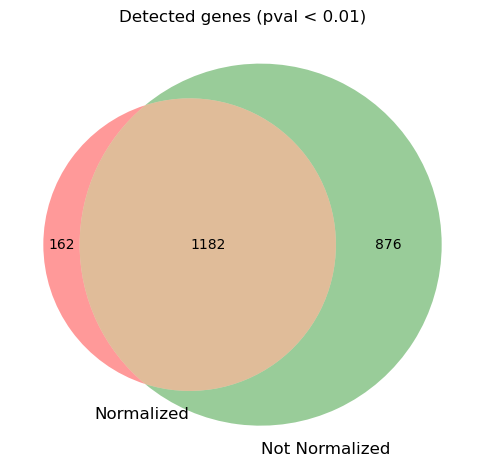

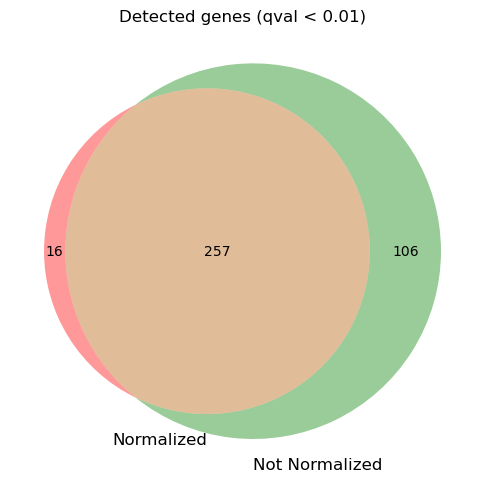

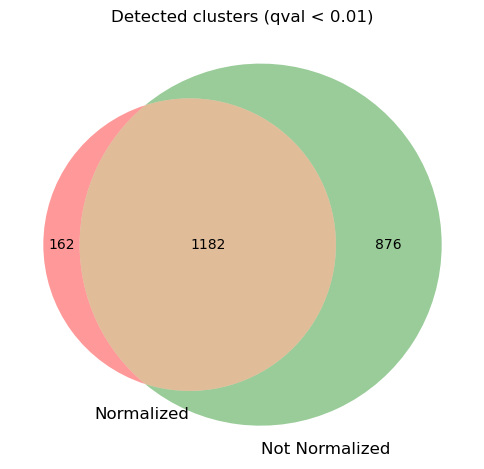

In [ ]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Genes pval
set1 = set(gene_result[gene_result["pval"] < 0.01].Gene)
set2 = set(gene_result_notnorm[gene_result_notnorm["pval"] < 0.01].Gene)

plt.figure(figsize=(6,6))
venn2([set1, set2], set_labels=('Normalized', 'Not Normalized'))
plt.title("Detected genes (pval < 0.01)")
plt.show()


# Genes qval
set1 = set(gene_result[gene_result["qval"] < 0.01].Gene)
set2 = set(gene_result_notnorm[gene_result_notnorm["qval"] < 0.01].Gene)

plt.figure(figsize=(6,6))
venn2([set1, set2], set_labels=('Normalized', 'Not Normalized'))
plt.title("Detected genes (qval < 0.01)")
plt.show()

# Clusters pval
set1 = set(res_result[res_result["pval"] < 0.01].Gene)
set2 = set(res_result_notnorm[res_result_notnorm["pval"] < 0.01].Gene)

plt.figure(figsize=(6,6))
venn2([set1, set2], set_labels=('Normalized', 'Not Normalized'))
plt.title("Detected clusters (qval < 0.01)")
plt.show()

In [254]:
gene_result_hits_q = gene_result[gene_result["qval"] < 0.01]
gene_result_notnorm_hits_q = gene_result_notnorm[gene_result_notnorm["qval"] < 0.01]

gene_result_hits_p = gene_result[gene_result["pval"] < 0.01]
gene_result_notnorm_hits_p = gene_result_notnorm[gene_result_notnorm["pval"] < 0.01]

gene_result_ex_q = gene_result_hits_q[~gene_result_hits_q.Gene.isin(gene_result_notnorm_hits_q.Gene)].reset_index(drop=True)
gene_result_notnorm_ex_q = gene_result_notnorm_hits_q[~gene_result_notnorm_hits_q.Gene.isin(gene_result_hits_q.Gene)].reset_index(drop=True)

gene_result_ex_p = gene_result_hits_p[~gene_result_hits_p.Gene.isin(gene_result_notnorm_hits_p.Gene)].reset_index(drop=True)
gene_result_notnorm_ex_p = gene_result_notnorm_hits_p[~gene_result_notnorm_hits_p.Gene.isin(gene_result_hits_p.Gene)].reset_index(drop=True)

In [275]:
def print_cgc_ratio(df, df_norm, cgc_df):

    norm_count = len(df[df.Gene.isin(cgc_df.Gene.values)].Gene)
    not_norm_count = len(df_norm[df_norm.Gene.isin(cgc_df.Gene.values)].Gene)

    print(f"CGC ratio Norm ({len(df)}):     {norm_count / len(df):.3} ({norm_count})")
    print(f"CGC ratio Not Norm ({len(df_norm)}): {not_norm_count / len(df_norm):.3} ({not_norm_count})")

print("\n> Hits qval < 0.01") 
print_cgc_ratio(gene_result_hits_q, gene_result_notnorm_hits_q, cgc_df)

print("\n> Exclusive Hits qval < 0.01") 
print_cgc_ratio(gene_result_ex_q, gene_result_notnorm_ex_q, cgc_df)

print("\n\n> Hits pval < 0.01") 
print_cgc_ratio(gene_result_hits_p, gene_result_notnorm_hits_p, cgc_df)

print("\n> Exclusive Hits pval < 0.01") 
print_cgc_ratio(gene_result_ex_p, gene_result_notnorm_ex_p, cgc_df)


> Hits qval < 0.01
CGC ratio Norm (619):     0.693
CGC ratio Not Norm (740): 0.624

> Exclusive Hits qval < 0.01
CGC ratio Norm (16):     0.438
CGC ratio Not Norm (109): 0.174


> Hits pval < 0.01
CGC ratio Norm (2105):     0.376
CGC ratio Not Norm (3032): 0.278

> Exclusive Hits pval < 0.01
CGC ratio Norm (167):     0.102
CGC ratio Not Norm (946): 0.0465


In [280]:
gene_result_ex_q_notcgc = gene_result_ex_q[~gene_result_ex_q.Gene.isin(cgc_df.Gene.values)]
gene_result_notnorm_ex_q_notcgc = gene_result_notnorm_ex_q[~gene_result_notnorm_ex_q.Gene.isin(cgc_df.Gene.values)]

,Mut_in_top_vol,Count
0,5.0,7
1,4.0,5
2,6.0,2
3,17.0,1
4,7.0,1


,Mut_in_top_vol,Count
0,4.0,37
1,3.0,24
2,5.0,20
3,6.0,12
4,8.0,6
5,7.0,5
6,2.0,4
7,10.0,1


/home/spellegrini/miniconda3/envs/o3d_nb/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


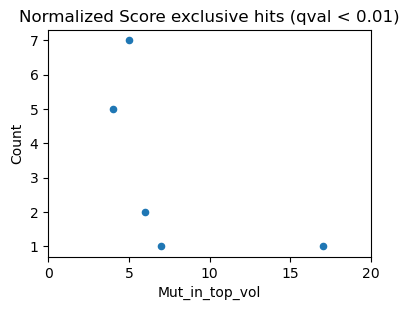

/home/spellegrini/miniconda3/envs/o3d_nb/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


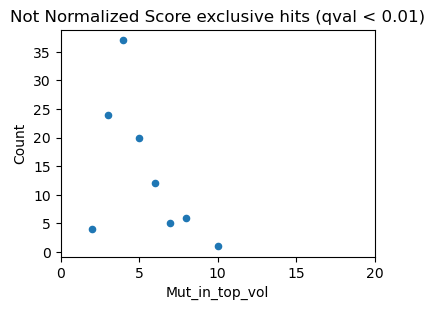

In [331]:

display(gene_result_ex_q.Mut_in_top_vol.value_counts().reset_index().rename(
    columns={"Mut_in_top_vol": "Count", "index": "Mut_in_top_vol"}))
display(gene_result_notnorm_ex_q.Mut_in_top_vol.value_counts().reset_index().rename(
    columns={"Mut_in_top_vol": "Count", "index": "Mut_in_top_vol"}))

plt.figure(figsize=(4, 3))
gene_result_ex_q.Mut_in_top_vol.value_counts().reset_index().rename(
    columns={"Mut_in_top_vol": "Count", "index": "Mut_in_top_vol"}).plot.scatter(x="Mut_in_top_vol", y="Count", ax=plt.gca())
plt.xlim(0, 20)
plt.tight_layout()
plt.title("Normalized Score exclusive hits (qval < 0.01)")
plt.show()

plt.figure(figsize=(4, 3))
gene_result_notnorm_ex_q.Mut_in_top_vol.value_counts().reset_index().rename(
    columns={"Mut_in_top_vol": "Count", "index": "Mut_in_top_vol"}).plot.scatter(x="Mut_in_top_vol", y="Count", ax=plt.gca())
plt.xlim(0, 20)
plt.tight_layout()
plt.title("Not Normalized Score exclusive hits (qval < 0.01)")
plt.show()

,Mut_in_top_vol,Count
0,3.0,81
1,4.0,59
2,5.0,16
3,8.0,4
4,6.0,3
5,9.0,2
6,11.0,1
7,7.0,1


,Mut_in_top_vol,Count
0,2.0,671
1,3.0,209
2,4.0,45
3,5.0,11
4,6.0,5
5,7.0,4
6,9.0,1


/home/spellegrini/miniconda3/envs/o3d_nb/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


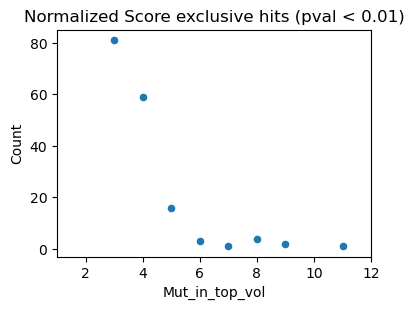

/home/spellegrini/miniconda3/envs/o3d_nb/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


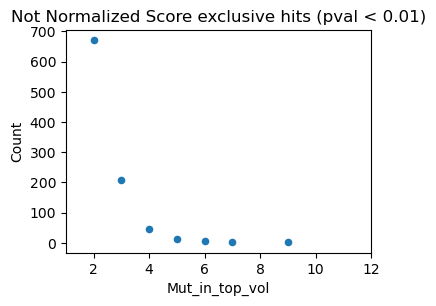

In [332]:

display(gene_result_ex_p.Mut_in_top_vol.value_counts().reset_index().rename(
    columns={"Mut_in_top_vol": "Count", "index": "Mut_in_top_vol"}))
display(gene_result_notnorm_ex_p.Mut_in_top_vol.value_counts().reset_index().rename(
    columns={"Mut_in_top_vol": "Count", "index": "Mut_in_top_vol"}))

plt.figure(figsize=(4, 3))
gene_result_ex_p.Mut_in_top_vol.value_counts().reset_index().rename(
    columns={"Mut_in_top_vol": "Count", "index": "Mut_in_top_vol"}).plot.scatter(x="Mut_in_top_vol", y="Count", ax=plt.gca())
plt.xlim(1, 12)
plt.tight_layout()
plt.title("Normalized Score exclusive hits (pval < 0.01)")
plt.show()

plt.figure(figsize=(4, 3))
gene_result_notnorm_ex_p.Mut_in_top_vol.value_counts().reset_index().rename(
    columns={"Mut_in_top_vol": "Count", "index": "Mut_in_top_vol"}).plot.scatter(x="Mut_in_top_vol", y="Count", ax=plt.gca())
plt.xlim(1, 12)
plt.tight_layout()
plt.title("Not Normalized Score exclusive hits (pval < 0.01)")
plt.show()

##### Dissection

In [131]:
cohort = "OTHER_WGS_MM_NATLEUK2018"
gene = "PTH2"

cols = ['Pos', 'Mut_in_gene', 'Mut_in_vol', 'Score', 'Rank', 'pval']
res_result_gene = res_result[(res_result["Gene"] == gene) & (res_result["Cohort"] == cohort)][cols].reset_index(drop=True)
res_result_notnorm_gene = res_result_notnorm[(res_result_notnorm["Gene"] == gene) & (res_result_notnorm["Cohort"] == cohort)][cols]
res_result_notnorm_gene = res_result_notnorm_gene.rename(
    columns={col : f"{col}_notnorm" for col in ["Score", "Score_obs_sim", "Rank", "pval"]}).reset_index(drop=True)
res_result_gene = res_result_gene.merge(res_result_notnorm_gene, on=["Pos", "Mut_in_gene", "Mut_in_vol"], how="inner")
res_result_gene

,Pos,Mut_in_gene,Mut_in_vol,Score,Rank,pval,Score_notnorm,Rank_notnorm,pval_notnorm
0,23,4,4,1.0,1,0.0078,14.524922,1,0.00001
1,22,4,4,1.0,0,0.0097,14.577867,0,0.00001


In [132]:
o3d_annot_dir = f"{WORKSPACE}/nobackup/scratch/oncodrive3d/annotations_mane_240506"
pdb_tool_df = pd.read_csv(os.path.join(o3d_annot_dir, "pdb_tool_df.tsv"), sep="\t")

o3d_datasets_dir = f"{WORKSPACE}/nobackup/scratch/oncodrive3d/datasets_mane_240506"
seq_df = pd.read_csv(os.path.join(o3d_datasets_dir, "seq_for_mut_prob.tsv"), sep="\t")

/tmp/jobs/spellegrini/10530889/ipykernel_1631372/2659275687.py:2: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  pdb_tool_df = pd.read_csv(os.path.join(o3d_annot_dir, "pdb_tool_df.tsv"), sep="\t")


In [133]:
cmap_path = f"{WORKSPACE}/nobackup/scratch/oncodrive3d/datasets_mane_240506/prob_cmaps"
mut_profile_path = f"{WORKSPACE}/projects/clustering_3d/o3d_analysys/datasets/input/cancer_202404/mut_profile/{cohort}.sig.json"
mut_profile = json.load(open(mut_profile_path, encoding="utf-8"))
miss_prob_dict = get_miss_mut_prob_dict(mut_rate_dict=mut_profile, seq_df=seq_df)

In [134]:
f, uni_id = seq_df[seq_df["Gene"] == gene][["F", "Uniprot_ID"]].values[0]
cmap = get_cmap(cmap_path, uni_id, f)
vol_missense_mut_prob, gene_miss_prob = get_vol_miss_prob(gene, cmap_path, miss_prob_dict, seq_df)
contacts = np.dot(cmap, np.repeat(1, len(gene_miss_prob)))

In [135]:
df_prob = pd.DataFrame(
    {"Prob_mut_vol": vol_missense_mut_prob, "Contacts": contacts}
    ).reset_index().rename(columns={"index": "Pos"})
df_prob["Pos"] += 1
df_prob["pACC"] = pdb_tool_df[pdb_tool_df["Uniprot_ID"] == uni_id].pACC.values
df_prob

,Pos,Prob_mut_vol,Contacts,pACC
0,1,0.009978,3,100.0
1,2,0.044825,5,97.0
2,3,0.048424,6,89.0
3,4,0.053640,6,93.0
4,5,0.057862,7,90.0
...,...,...,...,...
95,96,0.051076,10,57.0
96,97,0.047087,9,76.0
97,98,0.040225,7,81.0
98,99,0.037844,6,63.0


In [136]:
res_result_gene = res_result_gene.merge(df_prob, on="Pos", how="inner")
res_result_gene["Score_scaled"] = res_result_gene["Score"] / res_result_gene["Score"].sum()
res_result_gene["Score_notnorm_scaled"] = res_result_gene["Score_notnorm"] / res_result_gene["Score_notnorm"].sum()
res_result_gene

,Pos,Mut_in_gene,Mut_in_vol,Score,Rank,pval,Score_notnorm,Rank_notnorm,pval_notnorm,Prob_mut_vol,Contacts,pACC,Score_scaled,Score_notnorm_scaled
0,23,4,4,1.0,1,0.0078,14.524922,1,0.00001,0.026484,9,70.0,0.5,0.49909
1,22,4,4,1.0,0,0.0097,14.577867,0,0.00001,0.026135,9,52.0,0.5,0.50091
